In [1]:
from pylab import *
import numpy as np
from trackeddy.datastruct import *
%matplotlib inline
import gsw
import pdb
import pandas as pd

In [2]:
eddydict=np.load('../data_bk/aviso_1993-1-3_pos.npy')

In [3]:
eddyd=eddydict.item()

In [4]:
PROJ_LIB='/Users/josue/.anaconda3/share/proj'
os.environ['PROJ_LIB'] = PROJ_LIB
from mpl_toolkits.basemap import Basemap


In [5]:
new_dict_0={}
new_dict_1={}
new_dict_2={}
for key,item in eddyd.items():
    if int(item['time'])==0:
        new_dict_0[key]=item
    elif int(item['time'])==1:
        new_dict_1[key]=item
    elif int(item['time'])==2:
        new_dict_2[key]=item
    else:
        break

In [6]:
from trackeddy.printfunc import *

def split_list(alist, wanted_parts=1,overlap=None):
    length = len(alist)
    overlap=overlap+1
    if overlap==None or overlap==1:        
        splitl=np.array([ alist[i*length // wanted_parts: (i+1)*length // wanted_parts]
                 for i in range(wanted_parts)])
    else:
        splitl=np.array([ alist[i*length // wanted_parts: (i+1)*length // wanted_parts + overlap//2] if i==0 
                         else  alist[i*length // wanted_parts - overlap//2+1 : (i+1)*length // wanted_parts]
                           for i in range(wanted_parts)])
    return splitl


class eddyTimeTrack():
    '''
    
    '''
    def __init__(self,filename,dtype=dict,method='nearest',mode='offline'):
        self.dtype=dtype
        self.method=method
        self.mode=mode
        self.tracked_dict={}
        self.missing_tracks=[]
        self.break_track=5
        if self.dtype==dict and filename.split('.')[-1]=='npy':
            eddydict=np.load(filename)
            self.eddyd=eddydict.item()
            self.eddies_time_dict()
            self.timelist=range(len(self.time_dict.keys())-1)
        elif self.dtype==pd.core.frame.DataFrame or filename.split('.')[-1]=='csv':
            trackinginfo=pd.read_csv(filename)
            self.eddyd = trackinginfo.set_index(pd.to_datetime(trackinginfo['time']))
            self.eddyidentifier = trackinginfo.set_index("neddy").T
            self.timelist=sort(trackinginfo['time'].unique())[0:180]
            self.time_dict = {time:self.eddyd.loc[time].set_index("neddy") for time in self.timelist}
            self.dtype='pandas'
        else:
            raise TypeError('The input of this tracking method should be a dictionary or a pandas dataframe.')
       
    def eddies_time_dict(self):
        self.time_dict={}
        for key,item in self.eddyd.items():
            if int(item['time']) not in self.time_dict.keys():
                self.time_dict[int(item['time'])]={}
                self.time_dict[int(item['time'])][key]=item
            else:
                self.time_dict[int(item['time'])][key]=item

    def track_eddies(self,pprint=False):
        self.tracked_dict={}
        count=0
        if pprint:
            pp = Printer(); 
            
        if self.dtype==dict:    
            for time_key in self.timelist:
                if pprint:
                    pp.timepercentprint(0,max(self.timelist),time_key+1,0,"Time tracking (T={0})".format(time_key))
                    
                self.eddy_t=self.time_dict[time_key]
                self.eddy_t1=self.time_dict[time_key+1]
                self.keys_at_t=[k for keys in [self.eddy_t.keys(),self.missing_tracks] for k in keys]#list(self.eddy_t.keys())
                self.keys_at_t1=list(self.eddy_t1.keys())
                tracks2connect=self.persisting_eddies()
                if count==0:
                    track_count=0
                else:
                    track_count=len(self.tracked_dict.keys())
                for eddies_index in range(len(tracks2connect)):
                    if count==0:
                        self.tracked_dict['track_{0}'.format(track_count)]={'eddyn':tracks2connect[eddies_index],'tracking':True}
                    else:
                        for track_key,track_item in self.tracked_dict.items():
                            if tracks2connect[eddies_index][0] in track_item['eddyn']:
                                self.tracked_dict[track_key]['eddyn']=list(np.hstack((track_item['eddyn'],tracks2connect[eddies_index][-1])))
                                self.tracked_dict[track_key]['tracking']=True
                                self.tracked_dict[track_key]['time']=time_key
                                break
                    track_count+=1
                self.remove_old_eddies()
                self.append_non_connected()
                count=1
                
        elif self.dtype=='pandas':
            self.tracked_dict={}
            count=0
            if pprint:
                pp = Printer();
            for time_key in range(len(self.timelist)-1):
                if pprint:
                    pp.timepercentprint(0,len(self.timelist),time_key+1,0,"Time tracking (T={0})".format(time_key))
                self.eddy_t = self.time_dict[self.timelist[time_key]].to_dict()
                self.eddy_t1 = self.time_dict[self.timelist[time_key+1]].to_dict()
                self.keys_at_t  = [k for keys in [self.time_dict[self.timelist[time_key]].index,self.missing_tracks] for k in keys]
                self.keys_at_t1 = list(self.time_dict[self.timelist[time_key+1]].index).copy()
                tracks2connect=self.persisting_eddies()
                if count==0:
                    track_count=0
                else:
                    track_count=len(self.tracked_dict.keys())
                    
                tic=time.time()
                for eddies_index in range(len(tracks2connect)):
                    if count==0:
                        self.tracked_dict['track_{0}'.format(track_count)]={'eddyn':tracks2connect[eddies_index],'tracking':True,'time':[self.eddyidentifier[eddy]['time'] for eddy in tracks2connect[eddies_index]]}
                    else:
                        for track_key,track_item in self.tracked_dict.items():
                            if tracks2connect[eddies_index][0] in track_item['eddyn']:
                                self.tracked_dict[track_key]['eddyn']=list(np.hstack((track_item['eddyn'],tracks2connect[eddies_index][-1])))
                                self.tracked_dict[track_key]['tracking']=True
                                self.tracked_dict[track_key]['time']=[self.eddyidentifier[eddy]['time'] for eddy in self.tracked_dict[track_key]['eddyn']]#self.timelist[time_key]
                                break
                    track_count+=1
                tic=time.time()
                self.remove_old_eddies()
                self.append_non_connected()
                count=1
            
        else:
            raise ValueError('Time tracking currently only accepts a dictionary (.npy) and pandas dataframes (.cvs).')
        
#        if len(tracks2connect)*2+len(self.keys_at_t)+len(self.keys_at_t1)!=len(self.eddy_t.keys())+len(self.eddy_t1.keys()):
#            raise ValueError('Leakage of eddies, look into the tracking algorithm.')

        return self.tracked_dict
        
    def persisting_eddies(self):
        ## ISSUE JOINING EDDIES AT THE SAME TIME
        connect_tracks=[]
        non_repeated_eddy=[]
        # linke_eddy only makes sure there are no multiple eddies detected at the same time. It will be good 
        # to compute the optimal track to follow. This may be allow tree structure like tracks.
#         if self.tracked_dict != {}:
#             linked_eddy = [eddy for key,item in self.tracked_dict.items() for eddy in item['eddyn']]
#         else:
#             linked_eddy=[]
        key_t0=0
        
        while len(self.keys_at_t)>key_t0:
            loc=self.get_loc(key_t0)
            if self.method=='nearest':
                locs_t=self.list_locs()
                near_eddy,distance_between_eddies=self.nearest_eddy(loc,locs_t)
                rossby_radius=rossbyR(loc[1],loc[0])
                if distance_between_eddies < rossby_radius and near_eddy not in non_repeated_eddy:# and key_t0 not in linked_eddy:
                    connect_tracks.append([self.keys_at_t[key_t0],self.keys_at_t1[near_eddy]])
                    non_repeated_eddy.append(near_eddy)
                    self.keys_at_t1[near_eddy]=None
                    self.keys_at_t[key_t0]=None

            elif self.method=='weighted':
                pass
            key_t0+=1
        self.keys_at_t=[ii for ii in self.keys_at_t if ii!=None]
        self.keys_at_t1=[ii for ii in self.keys_at_t1 if ii!=None]
        return connect_tracks
    
    def remove_old_eddies(self):
        trackn=[tkey for tkey in self.tracked_dict.keys() if self.tracked_dict[tkey]['tracking']>=self.break_track]
        for track in trackn:
            for eddyn in self.tracked_dict[track]:
                try:
                    self.keys_at_t.remove(eddyn)
                except:
                    pass
    
    def append_non_connected(self):
        track_count=len(self.tracked_dict.keys())
        all_keys=[val for tkey,titem in self.tracked_dict.items() for val in titem['eddyn']]
        for key_t in self.keys_at_t:
            if key_t not in all_keys:
                self.tracked_dict['track_{0}'.format(track_count)]={'eddyn':[key_t],'tracking':1,'time':[self.eddyidentifier[key_t]['time']]}
                self.missing_tracks.append(key_t)
            else:
                trackn=[tkey for tkey in self.tracked_dict.keys() if key_t in self.tracked_dict[tkey]['eddyn']]
                if self.tracked_dict[trackn[0]]['tracking'] <= self.break_track :
                    self.tracked_dict[trackn[0]]['tracking']+=1
                    self.missing_tracks.append(self.tracked_dict[trackn[0]]['eddyn'][-1])
                elif self.tracked_dict[trackn[0]]['tracking'] > self.break_track :
                    for keys in self.tracked_dict[trackn[0]]['eddyn']:
                        try:
                            self.missing_tracks.remove(keys)
                        except:
                            pass
                else:
                    self.missing_tracks.append(self.tracked_dict[trackn[0]]['eddyn'][-1])
                    self.tracked_dict[trackn[0]]['tracking']+=1
            track_count+=1
        
        track_count=len(self.tracked_dict.keys())
        
        for key_t1 in self.keys_at_t1: 
            if key_t1 not in all_keys:
                self.tracked_dict['track_{0}'.format(track_count)]={'eddyn':[key_t1],'tracking':True,'time':[self.eddyidentifier[key_t1]['time']]}
            else:
                raise ValueError('Repited eddy number, make sure to have an indentifier.')
            track_count+=1
    
    def nearest_eddy(self,loc,locs_t):
        near_eddy=abs(sum(locs_t-loc,axis=1)).argmin()
        distance_between_eddies=sw.dist(np.array([loc[1],locs_t[near_eddy][1]]),np.array([loc[0],locs_t[near_eddy][0]]))[0]*1000 #Distance in meters
        return near_eddy,distance_between_eddies
    
    def weighted_nearest_eddy(self,loc,loc_t,previous_orientation):
        near_eddy=abs(sum(locs_t-loc,axis=1)).argmin()
        distance_between_eddies,angle_trajectory=sw.dist(np.array([loc[1],locs_t[near_eddy][1]]),np.array([loc[0],locs_t[near_eddy][0]]))
        return near_eddy,distance_between_eddies*1000,angle_trajectory
    
    def get_loc(self,ii):
        if self.dtype==dict:
            loc=self.eddyd[self.keys_at_t[ii]]['position_default'][-1]
        else:
            loc=[self.eddyidentifier[self.keys_at_t[ii]]['center_mass_loc_x'],self.eddyidentifier[self.keys_at_t[ii]]['center_mass_loc_y']]
        return loc
    
    def list_locs(self):
        if self.dtype==dict:
            locs_t=np.array([self.eddy_t1[key_t1]['position_default'][-1] for key_t1 in self.eddy_t1])
        else:
            locs_t= np.array([[self.eddy_t1['center_mass_loc_x'][key_t1],self.eddy_t1['center_mass_loc_y'][key_t1]] for key_t1 in self.eddy_t1['time'].keys()])
        return locs_t
    
    def track_parallel(self,cores=None):
        '''
        Note that there is a halo in time (Overlap between time divisions)
        '''
        from multiprocessing import Process, Manager, cpu_count
        #lock console waiting for other processes.
        manager = Manager()
        return_dict = manager.dict()
        if cores==None:
            cores=cpu_count()
        #elif cores > cpu_count():
        #    raise ValueError("Can't use more cores that the available in this node-computer.")
        parallel_time_tracking_indexes=list(self.time_dict.keys())
        parallel_time_division=split_list(parallel_time_tracking_indexes[:-1], wanted_parts=cores,overlap=self.break_track)
        procs=[]
        events=[]
        for core in range(cores):
            event = manager.Event()
            p = Process(target=self.parallel_tracking_function,args=(core,parallel_time_division[core],return_dict,event))
            procs.append(p)
            events.append(event)
            p.start()
        for event in events:
            event.wait() 
        for p in procs:
            p.terminate()
        print('Parallel time-track finished!')
        self.time_track_multiple_times=dict(return_dict)
        #self.join_tracks()

    def parallel_tracking_function(self,thread,times,return_dict,event):
        # Do something here in parallel.
        self.timelist=times
        #print('Core {0} is processing times: {1} '.format(thread,self.timelist))
        return_dict[thread]=self.track_eddies()
        event.set()
    
    def create_new_dict(self):
        #Implement dictionary
        if self.dtype=='pandas':
            self.eddyidentifier['tracking']=self.eddyidentifier.index
            for key, item in td.tracked_dict.items():
                tracking_number=int(key.split('_')[-1])
                for eddy in item['eddyn']:
                    self.eddyidentifier[eddy]['tracking']=tracking_number
        
    
    def join_tracks(self):
        # Join the output dictionaries (needs to be in a dictionary like {0:tracks,1:tracks,...}).
        joined_tracking={}
        count=0
        for division_in_time in range(len(self.time_track_multiple_times.items())-1):
            self.track_joiner(joined_tracking,division_in_time,count)
        self.tracked_dict=joined_tracking

    def join_tracks_parallel(self):
        joined_tracking={}
    
    
    def track_joiner(self,joined_tracking,division_in_time,count,thread=None,event=None):
        if division_in_time==0:
            tracked_div0={track:item['eddyn'][-1] for track,item in self.time_track_multiple_times[division_in_time].items() if item['tracking']<self.break_track}
        else:
            tracked_div0={track:item['eddyn'][-1] for track,item in joined_tracking.items() if item['tracking']<self.break_track}

        tracked_div1={track:item['eddyn'][0] for track,item in self.time_track_multiple_times[division_in_time+1].items()}

        for track,eddyn in tracked_div0.items():
            for track1,eddyn1 in tracked_div1.items():
                if eddyn == eddyn1 and len(self.time_track_multiple_times[division_in_time+1][track1]['eddyn'])>1:
                    if division_in_time==0:
                        connected_tracks=(self.time_track_multiple_times[division_in_time][track]['eddyn'],self.time_track_multiple_times[division_in_time+1][track1]['eddyn'][1::])
                        joined_tracking['track_{0}'.format(count)]={'eddyn':[e for eddy in connected_tracks for e in eddy],'tracking':self.time_track_multiple_times[division_in_time+1][track1]['tracking']}
                    else:
                        connected_tracks=(joined_tracking[track]['eddyn'],self.time_track_multiple_times[division_in_time+1][track1]['eddyn'][1::])
                        joined_tracking[track]={'eddyn':[e for eddy in connected_tracks for e in eddy],'tracking':self.time_track_multiple_times[division_in_time+1][track1]['tracking']}

                    tracked_div0[track]=None
                    tracked_div1[track1]=None
                    count+=1
                    break
                elif eddyn == eddyn1 and len(self.time_track_multiple_times[division_in_time+1][track1]['eddyn'])==1:
                    tracked_div1[track1]=None
                    break

        previous_eddies = [e for track,eddy in joined_tracking.items() for e in eddy['eddyn']]
        for track,eddyn in tracked_div0.items():
            if eddyn != None and eddyn not in previous_eddies:
                if division_in_time==0:
                    joined_tracking['track_{0}'.format(count)]={'eddyn':self.time_track_multiple_times[division_in_time][track]['eddyn'],'tracking':self.time_track_multiple_times[division_in_time][track]['tracking']}
                else:
                    joined_tracking['track_{0}'.format(count)]={'eddyn':joined_tracking[track]['eddyn'],'tracking':joined_tracking[track]['tracking']}
                count+=1
        previous_eddies = [e for track,eddy in joined_tracking.items() for e in eddy['eddyn']]
        previous_eddies=[e for track,eddy in joined_tracking.items() for e in eddy['eddyn']]
        for track1,eddyn1 in tracked_div1.items():
            if eddyn1 != None and eddyn1 not in previous_eddies:
                joined_tracking['track_{0}'.format(count)]={'eddyn':self.time_track_multiple_times[division_in_time+1][track1]['eddyn'],'tracking':self.time_track_multiple_times[division_in_time+1][track1]['tracking']}
                count+=1
        previous_eddies = [e for track,eddy in joined_tracking.items() for e in eddy['eddyn']]
        return(joined_tracking)
    
            

In [7]:
import xarray as xr

In [8]:
!pwd

/Users/josue/Documents/academia/phd/github/trackeddy/tracking_test


In [9]:
# filename='../data_bk/aviso_1993-1-3_pos.npy'

In [10]:
# %%time
# td=eddyTimeTrack(filename)

In [11]:
# TEST
# td.track_eddies(True)

In [12]:
# %%time
# td.track_parallel(12)

In [13]:
filename='/Users/josue/Documents/academia/phd/github/trackeddy/data_bk/trackeddy_V1.0_global_eddies.csv'

In [14]:
%%time
td=eddyTimeTrack(filename)

CPU times: user 3min 3s, sys: 2min 25s, total: 5min 29s
Wall time: 7min 1s


In [15]:
# for ii in td.time_dict['1993-01-01']:
#     if ii in td.time_dict['1993-01-02']:
#         print('repeated')

In [16]:
#td.track_eddies(True)

In [17]:
td.break_track = 5

In [21]:
%%time
td.track_parallel(8)

Parallel time-track finished!
CPU times: user 4 s, sys: 1.41 s, total: 5.41 s
Wall time: 16h 36min 27s


In [20]:
parallel_time_tracking_indexes=list(td.time_dict.keys())
split_list(parallel_time_tracking_indexes[:-1], wanted_parts=8,overlap=td.break_track)

array([ list(['1993-01-01', '1993-01-02', '1993-01-03', '1993-01-04', '1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08', '1993-01-09', '1993-01-10', '1993-01-11', '1993-01-12', '1993-01-13', '1993-01-14', '1993-01-15', '1993-01-16', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20', '1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25']),
       list(['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']),
       list(['1993-02-12', '1993-02-13', '1993-02-14', '1993-02-15', '1993-02-16', '1993-02-17', '1993-02-18', '1993-02-19', '1993-02-20', '1993-02-21', '1993-02-22', '1993-02-23', '1993-02-24', '1993-02-25', '1993-02-26', '1993-02-27', '1993-02-28', '1993-03-01', '1993-03-02', '199

In [22]:
parallel_connected=td.time_track_multiple_times.copy()
#td.time_track_multiple_times=parallel_connected

In [23]:
for key,item in parallel_connected[0].items():
    print(key,item)
    #['track_22440']['eddyn']

track_0 {'eddyn': [0, 2093, 4210], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03']}
track_1 {'eddyn': [1, 2094, 4213, 6318, 8444, 10546, 12645, 14736, 16841, 18967], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03', '1993-01-04', '1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08', '1993-01-09', '1993-01-10']}
track_2 {'eddyn': [43936, 45978, 56155], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-07']}
track_3 {'eddyn': [3, 2099, 4229], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03']}
track_4 {'eddyn': [43938, 45979, 47999, 50026, 52050, 54118, 56154, 58237], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03', '1993-01-04', '1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08']}
track_5 {'eddyn': [43939, 45980, 56156], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-07']}
track_6 {'eddyn': [5, 2095], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02']}
track_7 {'eddyn': [43941, 45983, 48003

track_1547 {'eddyn': [45818, 47797], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02']}
track_1548 {'eddyn': [1885, 3918, 10368], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-05']}
track_1549 {'eddyn': [45823, 47783, 49721], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03']}
track_1550 {'eddyn': [45826, 47824, 49919], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03']}
track_1551 {'eddyn': [1895, 4046], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02']}
track_1552 {'eddyn': [45831, 47970], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02']}
track_1553 {'eddyn': [1896, 4050, 8290, 10379], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-04', '1993-01-05']}
track_1554 {'eddyn': [1898, 4013, 6178], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02', '1993-01-03']}
track_1555 {'eddyn': [1899, 3720], 'tracking': 6, 'time': ['1993-01-01', '1993-01-02']}
track_1556 {'eddyn': [1900, 3986, 6092], 'tracking': 6, 'time': ['1993-01-01

track_2764 {'eddyn': [44925], 'tracking': 6, 'time': ['1993-01-01']}
track_2765 {'eddyn': [990], 'tracking': 6, 'time': ['1993-01-01']}
track_2766 {'eddyn': [44926], 'tracking': 6, 'time': ['1993-01-01']}
track_2767 {'eddyn': [991], 'tracking': 6, 'time': ['1993-01-01']}
track_2768 {'eddyn': [44927], 'tracking': 6, 'time': ['1993-01-01']}
track_2769 {'eddyn': [993], 'tracking': 6, 'time': ['1993-01-01']}
track_2770 {'eddyn': [44929], 'tracking': 6, 'time': ['1993-01-01']}
track_2771 {'eddyn': [994], 'tracking': 6, 'time': ['1993-01-01']}
track_2772 {'eddyn': [996, 5381, 7523, 11786], 'tracking': 6, 'time': ['1993-01-01', '1993-01-03', '1993-01-04', '1993-01-06']}
track_2773 {'eddyn': [44932], 'tracking': 6, 'time': ['1993-01-01']}
track_2774 {'eddyn': [997], 'tracking': 6, 'time': ['1993-01-01']}
track_2775 {'eddyn': [44933], 'tracking': 6, 'time': ['1993-01-01']}
track_2776 {'eddyn': [44934, 48933, 50902, 52893], 'tracking': 6, 'time': ['1993-01-01', '1993-01-03', '1993-01-04', '1993-

track_4387 {'eddyn': [2307, 4360], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03']}
track_4388 {'eddyn': [46242], 'tracking': 6, 'time': ['1993-01-02']}
track_4389 {'eddyn': [46243], 'tracking': 6, 'time': ['1993-01-02']}
track_4390 {'eddyn': [46244], 'tracking': 6, 'time': ['1993-01-02']}
track_4391 {'eddyn': [46246, 48280, 50236, 52269], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03', '1993-01-04', '1993-01-05']}
track_4392 {'eddyn': [2311, 4431], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03']}
track_4393 {'eddyn': [46247], 'tracking': 6, 'time': ['1993-01-02']}
track_4394 {'eddyn': [2313], 'tracking': 6, 'time': ['1993-01-02']}
track_4395 {'eddyn': [46248], 'tracking': 6, 'time': ['1993-01-02']}
track_4396 {'eddyn': [2315, 4425, 6488], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03', '1993-01-04']}
track_4397 {'eddyn': [2316], 'tracking': 6, 'time': ['1993-01-02']}
track_4398 {'eddyn': [46251], 'tracking': 6, 'time': ['1993-01-02']}
track_4399 {'eddyn': [46253], 'tra

track_5948 {'eddyn': [47575], 'tracking': 6, 'time': ['1993-01-02']}
track_5949 {'eddyn': [3640, 5721], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03']}
track_5950 {'eddyn': [47576], 'tracking': 6, 'time': ['1993-01-02']}
track_5951 {'eddyn': [3642, 5726, 9777, 11852], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03', '1993-01-05', '1993-01-06']}
track_5952 {'eddyn': [3643, 7590], 'tracking': 6, 'time': ['1993-01-02', '1993-01-04']}
track_5953 {'eddyn': [47578], 'tracking': 6, 'time': ['1993-01-02']}
track_5954 {'eddyn': [47579, 49663], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03']}
track_5955 {'eddyn': [3644], 'tracking': 6, 'time': ['1993-01-02']}
track_5956 {'eddyn': [47580], 'tracking': 6, 'time': ['1993-01-02']}
track_5957 {'eddyn': [3646], 'tracking': 6, 'time': ['1993-01-02']}
track_5958 {'eddyn': [47581], 'tracking': 6, 'time': ['1993-01-02']}
track_5959 {'eddyn': [3647, 5758], 'tracking': 6, 'time': ['1993-01-02', '1993-01-03']}
track_5960 {'eddyn': [47582], 'track

track_7393 {'eddyn': [48815], 'tracking': 6, 'time': ['1993-01-03']}
track_7394 {'eddyn': [48816, 50827], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04']}
track_7395 {'eddyn': [48817], 'tracking': 6, 'time': ['1993-01-03']}
track_7396 {'eddyn': [48818, 52866, 55014], 'tracking': 6, 'time': ['1993-01-03', '1993-01-05', '1993-01-06']}
track_7397 {'eddyn': [4884], 'tracking': 6, 'time': ['1993-01-03']}
track_7398 {'eddyn': [4885], 'tracking': 6, 'time': ['1993-01-03']}
track_7399 {'eddyn': [48821, 50645], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04']}
track_7400 {'eddyn': [4886], 'tracking': 6, 'time': ['1993-01-03']}
track_7401 {'eddyn': [4888], 'tracking': 6, 'time': ['1993-01-03']}
track_7402 {'eddyn': [48824, 50685], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04']}
track_7403 {'eddyn': [4891, 11241, 13320, 15466], 'tracking': 6, 'time': ['1993-01-03', '1993-01-06', '1993-01-07', '1993-01-08']}
track_7404 {'eddyn': [48826], 'tracking': 6, 'time': ['1993-01-03']}
track_740

track_8751 {'eddyn': [6018], 'tracking': 6, 'time': ['1993-01-03']}
track_8752 {'eddyn': [49954, 51990], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04']}
track_8753 {'eddyn': [49955], 'tracking': 6, 'time': ['1993-01-03']}
track_8754 {'eddyn': [49956], 'tracking': 6, 'time': ['1993-01-03']}
track_8755 {'eddyn': [6021], 'tracking': 6, 'time': ['1993-01-03']}
track_8756 {'eddyn': [49957], 'tracking': 6, 'time': ['1993-01-03']}
track_8757 {'eddyn': [6022], 'tracking': 6, 'time': ['1993-01-03']}
track_8758 {'eddyn': [6023], 'tracking': 6, 'time': ['1993-01-03']}
track_8759 {'eddyn': [49959], 'tracking': 6, 'time': ['1993-01-03']}
track_8760 {'eddyn': [6025, 8171, 12441], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04', '1993-01-06']}
track_8761 {'eddyn': [49960], 'tracking': 6, 'time': ['1993-01-03']}
track_8762 {'eddyn': [6026], 'tracking': 6, 'time': ['1993-01-03']}
track_8763 {'eddyn': [6027, 8175], 'tracking': 6, 'time': ['1993-01-03', '1993-01-04']}
track_8764 {'eddyn': [49962,

track_10416 {'eddyn': [51473, 53535, 55595, 57736, 59857], 'tracking': 6, 'time': ['1993-01-04', '1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08']}
track_10417 {'eddyn': [7538], 'tracking': 6, 'time': ['1993-01-04']}
track_10418 {'eddyn': [7539], 'tracking': 6, 'time': ['1993-01-04']}
track_10419 {'eddyn': [7540, 9629], 'tracking': 6, 'time': ['1993-01-04', '1993-01-05']}
track_10420 {'eddyn': [51476, 53457, 55614, 62030], 'tracking': 6, 'time': ['1993-01-04', '1993-01-05', '1993-01-06', '1993-01-09']}
track_10421 {'eddyn': [7541], 'tracking': 6, 'time': ['1993-01-04']}
track_10422 {'eddyn': [51477, 53514, 55580, 57616, 59651, 61697], 'tracking': 6, 'time': ['1993-01-04', '1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08', '1993-01-09']}
track_10423 {'eddyn': [7545, 9834], 'tracking': 6, 'time': ['1993-01-04', '1993-01-05']}
track_10424 {'eddyn': [51480], 'tracking': 6, 'time': ['1993-01-04']}
track_10425 {'eddyn': [51481], 'tracking': 6, 'time': ['1993-01-04']}
track_10426 {

track_11882 {'eddyn': [8820], 'tracking': 6, 'time': ['1993-01-05']}
track_11883 {'eddyn': [52755, 54860], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06']}
track_11884 {'eddyn': [8821], 'tracking': 6, 'time': ['1993-01-05']}
track_11885 {'eddyn': [52757], 'tracking': 6, 'time': ['1993-01-05']}
track_11886 {'eddyn': [8822, 10946, 13035], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06', '1993-01-07']}
track_11887 {'eddyn': [8823], 'tracking': 6, 'time': ['1993-01-05']}
track_11888 {'eddyn': [52758], 'tracking': 6, 'time': ['1993-01-05']}
track_11889 {'eddyn': [52759], 'tracking': 6, 'time': ['1993-01-05']}
track_11890 {'eddyn': [8824], 'tracking': 6, 'time': ['1993-01-05']}
track_11891 {'eddyn': [52760, 54858, 56902, 58975], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06', '1993-01-07', '1993-01-08']}
track_11892 {'eddyn': [8826], 'tracking': 6, 'time': ['1993-01-05']}
track_11893 {'eddyn': [8827], 'tracking': 6, 'time': ['1993-01-05']}
track_11894 {'eddyn': [52762, 54886], 'tr

track_13372 {'eddyn': [10156, 12220, 14218], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06', '1993-01-07']}
track_13373 {'eddyn': [54091], 'tracking': 6, 'time': ['1993-01-05']}
track_13374 {'eddyn': [10157], 'tracking': 6, 'time': ['1993-01-05']}
track_13375 {'eddyn': [54093], 'tracking': 6, 'time': ['1993-01-05']}
track_13376 {'eddyn': [10159, 12198], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06']}
track_13377 {'eddyn': [54094, 58152], 'tracking': 6, 'time': ['1993-01-05', '1993-01-07']}
track_13378 {'eddyn': [54095], 'tracking': 6, 'time': ['1993-01-05']}
track_13379 {'eddyn': [54096], 'tracking': 6, 'time': ['1993-01-05']}
track_13380 {'eddyn': [10161], 'tracking': 6, 'time': ['1993-01-05']}
track_13381 {'eddyn': [54097, 56107, 64325, 66368, 68368], 'tracking': 6, 'time': ['1993-01-05', '1993-01-06', '1993-01-10', '1993-01-11', '1993-01-12']}
track_13382 {'eddyn': [54098], 'tracking': 6, 'time': ['1993-01-05']}
track_13383 {'eddyn': [54099], 'tracking': 6, 'time': ['1993-0

track_15062 {'eddyn': [11714, 13697], 'tracking': 6, 'time': ['1993-01-06', '1993-01-07']}
track_15063 {'eddyn': [55650, 57820, 59849, 61880], 'tracking': 6, 'time': ['1993-01-06', '1993-01-07', '1993-01-08', '1993-01-09']}
track_15064 {'eddyn': [11715], 'tracking': 6, 'time': ['1993-01-06']}
track_15065 {'eddyn': [11716, 13888], 'tracking': 6, 'time': ['1993-01-06', '1993-01-07']}
track_15066 {'eddyn': [11717], 'tracking': 6, 'time': ['1993-01-06']}
track_15067 {'eddyn': [11718, 13773], 'tracking': 6, 'time': ['1993-01-06', '1993-01-07']}
track_15068 {'eddyn': [55653, 57653, 59688], 'tracking': 6, 'time': ['1993-01-06', '1993-01-07', '1993-01-08']}
track_15069 {'eddyn': [11720], 'tracking': 6, 'time': ['1993-01-06']}
track_15070 {'eddyn': [11721], 'tracking': 6, 'time': ['1993-01-06']}
track_15071 {'eddyn': [11722], 'tracking': 6, 'time': ['1993-01-06']}
track_15072 {'eddyn': [55658], 'tracking': 6, 'time': ['1993-01-06']}
track_15073 {'eddyn': [55659], 'tracking': 6, 'time': ['1993-0

track_16406 {'eddyn': [56851], 'tracking': 6, 'time': ['1993-01-07']}
track_16407 {'eddyn': [12917, 15012, 17144, 19273, 21409, 23494, 31929, 33921], 'tracking': 6, 'time': ['1993-01-07', '1993-01-08', '1993-01-09', '1993-01-10', '1993-01-11', '1993-01-12', '1993-01-16', '1993-01-17']}
track_16408 {'eddyn': [56852], 'tracking': 6, 'time': ['1993-01-07']}
track_16409 {'eddyn': [56853, 59072], 'tracking': 6, 'time': ['1993-01-07', '1993-01-08']}
track_16410 {'eddyn': [12918], 'tracking': 6, 'time': ['1993-01-07']}
track_16411 {'eddyn': [12919, 15023], 'tracking': 6, 'time': ['1993-01-07', '1993-01-08']}
track_16412 {'eddyn': [12921], 'tracking': 6, 'time': ['1993-01-07']}
track_16413 {'eddyn': [56858], 'tracking': 6, 'time': ['1993-01-07']}
track_16414 {'eddyn': [12923], 'tracking': 6, 'time': ['1993-01-07']}
track_16415 {'eddyn': [56859], 'tracking': 6, 'time': ['1993-01-07']}
track_16416 {'eddyn': [56860], 'tracking': 6, 'time': ['1993-01-07']}
track_16417 {'eddyn': [56861], 'tracking'

track_17233 {'eddyn': [57629], 'tracking': 6, 'time': ['1993-01-07']}
track_17234 {'eddyn': [57630], 'tracking': 6, 'time': ['1993-01-07']}
track_17235 {'eddyn': [57631], 'tracking': 6, 'time': ['1993-01-07']}
track_17236 {'eddyn': [57632], 'tracking': 6, 'time': ['1993-01-07']}
track_17237 {'eddyn': [13698], 'tracking': 6, 'time': ['1993-01-07']}
track_17238 {'eddyn': [57633], 'tracking': 6, 'time': ['1993-01-07']}
track_17239 {'eddyn': [57636], 'tracking': 6, 'time': ['1993-01-07']}
track_17240 {'eddyn': [13701], 'tracking': 6, 'time': ['1993-01-07']}
track_17241 {'eddyn': [13702], 'tracking': 6, 'time': ['1993-01-07']}
track_17242 {'eddyn': [57640], 'tracking': 6, 'time': ['1993-01-07']}
track_17243 {'eddyn': [57641, 59730, 61807, 63920], 'tracking': 6, 'time': ['1993-01-07', '1993-01-08', '1993-01-09', '1993-01-10']}
track_17244 {'eddyn': [13706], 'tracking': 6, 'time': ['1993-01-07']}
track_17245 {'eddyn': [13708, 15725, 17783, 19931, 22295], 'tracking': 6, 'time': ['1993-01-07', 

track_18403 {'eddyn': [58562], 'tracking': 6, 'time': ['1993-01-08']}
track_18404 {'eddyn': [58563, 60590], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09']}
track_18405 {'eddyn': [58564], 'tracking': 6, 'time': ['1993-01-08']}
track_18406 {'eddyn': [58565], 'tracking': 6, 'time': ['1993-01-08']}
track_18407 {'eddyn': [58567], 'tracking': 6, 'time': ['1993-01-08']}
track_18408 {'eddyn': [58568], 'tracking': 6, 'time': ['1993-01-08']}
track_18409 {'eddyn': [58570], 'tracking': 6, 'time': ['1993-01-08']}
track_18410 {'eddyn': [58573, 60635, 62708, 64795], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09', '1993-01-10', '1993-01-11']}
track_18411 {'eddyn': [58574], 'tracking': 6, 'time': ['1993-01-08']}
track_18412 {'eddyn': [58576], 'tracking': 6, 'time': ['1993-01-08']}
track_18413 {'eddyn': [58580, 60636, 62727, 64815], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09', '1993-01-10', '1993-01-11']}
track_18414 {'eddyn': [58581], 'tracking': 6, 'time': ['1993-01-08']}
track_18415 {

track_19644 {'eddyn': [15900], 'tracking': 6, 'time': ['1993-01-08']}
track_19645 {'eddyn': [59836], 'tracking': 6, 'time': ['1993-01-08']}
track_19646 {'eddyn': [59837], 'tracking': 6, 'time': ['1993-01-08']}
track_19647 {'eddyn': [15902], 'tracking': 6, 'time': ['1993-01-08']}
track_19648 {'eddyn': [59838], 'tracking': 6, 'time': ['1993-01-08']}
track_19649 {'eddyn': [59839, 64022], 'tracking': 6, 'time': ['1993-01-08', '1993-01-10']}
track_19650 {'eddyn': [15907], 'tracking': 6, 'time': ['1993-01-08']}
track_19651 {'eddyn': [15908], 'tracking': 6, 'time': ['1993-01-08']}
track_19652 {'eddyn': [59844, 61796, 63867], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09', '1993-01-10']}
track_19653 {'eddyn': [59845], 'tracking': 6, 'time': ['1993-01-08']}
track_19654 {'eddyn': [59846], 'tracking': 6, 'time': ['1993-01-08']}
track_19655 {'eddyn': [15912, 17801, 19933, 22080, 30325, 32455, 34692, 36808, 39094], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09', '1993-01-10', '1993-01-11', 

track_20310 {'eddyn': [16591], 'tracking': 6, 'time': ['1993-01-08']}
track_20311 {'eddyn': [16592], 'tracking': 6, 'time': ['1993-01-08']}
track_20312 {'eddyn': [16596], 'tracking': 6, 'time': ['1993-01-08']}
track_20313 {'eddyn': [16599, 18815], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09']}
track_20314 {'eddyn': [16601], 'tracking': 6, 'time': ['1993-01-08']}
track_20315 {'eddyn': [16602], 'tracking': 6, 'time': ['1993-01-08']}
track_20316 {'eddyn': [16603], 'tracking': 6, 'time': ['1993-01-08']}
track_20317 {'eddyn': [16604], 'tracking': 6, 'time': ['1993-01-08']}
track_20318 {'eddyn': [16605, 18694], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09']}
track_20319 {'eddyn': [16606, 18721], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09']}
track_20320 {'eddyn': [16607], 'tracking': 6, 'time': ['1993-01-08']}
track_20321 {'eddyn': [16608, 18906], 'tracking': 6, 'time': ['1993-01-08', '1993-01-09']}
track_20322 {'eddyn': [16611, 18658], 'tracking': 6, 'time': ['1993-01-08', 

track_21076 {'eddyn': [17194, 19281, 21496, 23571, 25627], 'tracking': 6, 'time': ['1993-01-09', '1993-01-10', '1993-01-11', '1993-01-12', '1993-01-13']}
track_21077 {'eddyn': [61129], 'tracking': 6, 'time': ['1993-01-09']}
track_21078 {'eddyn': [61130], 'tracking': 6, 'time': ['1993-01-09']}
track_21079 {'eddyn': [17195], 'tracking': 6, 'time': ['1993-01-09']}
track_21080 {'eddyn': [61131], 'tracking': 6, 'time': ['1993-01-09']}
track_21081 {'eddyn': [17196], 'tracking': 6, 'time': ['1993-01-09']}
track_21082 {'eddyn': [17197], 'tracking': 6, 'time': ['1993-01-09']}
track_21083 {'eddyn': [61132, 67239, 69259], 'tracking': 6, 'time': ['1993-01-09', '1993-01-12', '1993-01-13']}
track_21084 {'eddyn': [61133, 69195, 71232, 73270, 75324, 77334, 79454, 82135, 83562, 133576, 135597], 'tracking': 6, 'time': ['1993-01-09', '1993-01-13', '1993-01-14', '1993-01-15', '1993-01-16', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20', '1993-01-23', '1993-01-24']}
track_21085 {'eddyn': [17198], '

track_22657 {'eddyn': [18788], 'tracking': 6, 'time': ['1993-01-09']}
track_22658 {'eddyn': [18789], 'tracking': 6, 'time': ['1993-01-09']}
track_22659 {'eddyn': [18792, 20866, 22992, 25158, 27137, 29167, 33375], 'tracking': 6, 'time': ['1993-01-09', '1993-01-10', '1993-01-11', '1993-01-12', '1993-01-13', '1993-01-14', '1993-01-16']}
track_22660 {'eddyn': [18793], 'tracking': 6, 'time': ['1993-01-09']}
track_22661 {'eddyn': [18794], 'tracking': 6, 'time': ['1993-01-09']}
track_22662 {'eddyn': [18796], 'tracking': 6, 'time': ['1993-01-09']}
track_22663 {'eddyn': [18799], 'tracking': 6, 'time': ['1993-01-09']}
track_22664 {'eddyn': [18803], 'tracking': 6, 'time': ['1993-01-09']}
track_22665 {'eddyn': [18804], 'tracking': 6, 'time': ['1993-01-09']}
track_22666 {'eddyn': [18805], 'tracking': 6, 'time': ['1993-01-09']}
track_22667 {'eddyn': [18807, 25049], 'tracking': 6, 'time': ['1993-01-09', '1993-01-12']}
track_22668 {'eddyn': [18808], 'tracking': 6, 'time': ['1993-01-09']}
track_22669 {

track_24329 {'eddyn': [20135], 'tracking': 6, 'time': ['1993-01-10']}
track_24330 {'eddyn': [20137, 24560, 26513, 28507, 30493, 32577], 'tracking': 6, 'time': ['1993-01-10', '1993-01-12', '1993-01-13', '1993-01-14', '1993-01-15', '1993-01-16']}
track_24331 {'eddyn': [64075, 66201], 'tracking': 6, 'time': ['1993-01-10', '1993-01-11']}
track_24332 {'eddyn': [64076], 'tracking': 6, 'time': ['1993-01-10']}
track_24333 {'eddyn': [20142, 22250], 'tracking': 6, 'time': ['1993-01-10', '1993-01-11']}
track_24334 {'eddyn': [64077], 'tracking': 6, 'time': ['1993-01-10']}
track_24335 {'eddyn': [20143, 22283], 'tracking': 6, 'time': ['1993-01-10', '1993-01-11']}
track_24336 {'eddyn': [20144], 'tracking': 6, 'time': ['1993-01-10']}
track_24337 {'eddyn': [20146], 'tracking': 6, 'time': ['1993-01-10']}
track_24338 {'eddyn': [20147, 22292], 'tracking': 6, 'time': ['1993-01-10', '1993-01-11']}
track_24339 {'eddyn': [64082, 66153, 68335], 'tracking': 6, 'time': ['1993-01-10', '1993-01-11', '1993-01-12']}

track_25474 {'eddyn': [65099, 69058], 'tracking': 6, 'time': ['1993-01-11', '1993-01-13']}
track_25475 {'eddyn': [65101], 'tracking': 6, 'time': ['1993-01-11']}
track_25476 {'eddyn': [21168], 'tracking': 6, 'time': ['1993-01-11']}
track_25477 {'eddyn': [65105], 'tracking': 6, 'time': ['1993-01-11']}
track_25478 {'eddyn': [21170], 'tracking': 6, 'time': ['1993-01-11']}
track_25479 {'eddyn': [65107], 'tracking': 6, 'time': ['1993-01-11']}
track_25480 {'eddyn': [65108], 'tracking': 6, 'time': ['1993-01-11']}
track_25481 {'eddyn': [21173], 'tracking': 6, 'time': ['1993-01-11']}
track_25482 {'eddyn': [65109, 67146, 69202], 'tracking': 6, 'time': ['1993-01-11', '1993-01-12', '1993-01-13']}
track_25483 {'eddyn': [21177, 23293, 25388, 27487], 'tracking': 6, 'time': ['1993-01-11', '1993-01-12', '1993-01-13', '1993-01-14']}
track_25484 {'eddyn': [21178], 'tracking': 6, 'time': ['1993-01-11']}
track_25485 {'eddyn': [21179, 23289], 'tracking': 6, 'time': ['1993-01-11', '1993-01-12']}
track_25486 {

track_26336 {'eddyn': [22001], 'tracking': 6, 'time': ['1993-01-11']}
track_26337 {'eddyn': [65937], 'tracking': 6, 'time': ['1993-01-11']}
track_26338 {'eddyn': [22002], 'tracking': 6, 'time': ['1993-01-11']}
track_26339 {'eddyn': [22003], 'tracking': 6, 'time': ['1993-01-11']}
track_26340 {'eddyn': [65938, 67970], 'tracking': 6, 'time': ['1993-01-11', '1993-01-12']}
track_26341 {'eddyn': [65939, 67715, 69689, 71768], 'tracking': 6, 'time': ['1993-01-11', '1993-01-12', '1993-01-13', '1993-01-14']}
track_26342 {'eddyn': [22004], 'tracking': 6, 'time': ['1993-01-11']}
track_26343 {'eddyn': [22005], 'tracking': 6, 'time': ['1993-01-11']}
track_26344 {'eddyn': [65940], 'tracking': 6, 'time': ['1993-01-11']}
track_26345 {'eddyn': [65942], 'tracking': 6, 'time': ['1993-01-11']}
track_26346 {'eddyn': [65943], 'tracking': 6, 'time': ['1993-01-11']}
track_26347 {'eddyn': [65944], 'tracking': 6, 'time': ['1993-01-11']}
track_26348 {'eddyn': [65945], 'tracking': 6, 'time': ['1993-01-11']}
track_

track_27398 {'eddyn': [66661], 'tracking': 6, 'time': ['1993-01-12']}
track_27399 {'eddyn': [66662], 'tracking': 6, 'time': ['1993-01-12']}
track_27400 {'eddyn': [66663], 'tracking': 6, 'time': ['1993-01-12']}
track_27401 {'eddyn': [66668], 'tracking': 6, 'time': ['1993-01-12']}
track_27402 {'eddyn': [66671, 68715], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13']}
track_27403 {'eddyn': [66674, 68691], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13']}
track_27404 {'eddyn': [66675, 68685], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13']}
track_27405 {'eddyn': [66683], 'tracking': 6, 'time': ['1993-01-12']}
track_27406 {'eddyn': [66688], 'tracking': 6, 'time': ['1993-01-12']}
track_27407 {'eddyn': [66689], 'tracking': 6, 'time': ['1993-01-12']}
track_27408 {'eddyn': [66691], 'tracking': 6, 'time': ['1993-01-12']}
track_27409 {'eddyn': [66693], 'tracking': 6, 'time': ['1993-01-12']}
track_27410 {'eddyn': [66694], 'tracking': 6, 'time': ['1993-01-12']}
track_27411 {'eddyn': [6669

track_28673 {'eddyn': [24156], 'tracking': 6, 'time': ['1993-01-12']}
track_28674 {'eddyn': [24158], 'tracking': 6, 'time': ['1993-01-12']}
track_28675 {'eddyn': [24159], 'tracking': 6, 'time': ['1993-01-12']}
track_28676 {'eddyn': [68095, 70210, 72134], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13', '1993-01-14']}
track_28677 {'eddyn': [68096], 'tracking': 6, 'time': ['1993-01-12']}
track_28678 {'eddyn': [24161, 26233, 28285, 30365, 32426, 34536, 36595, 38799, 42973, 87780, 89781, 91892, 93799], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13', '1993-01-14', '1993-01-15', '1993-01-16', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25']}
track_28679 {'eddyn': [68097, 70268, 72259], 'tracking': 6, 'time': ['1993-01-12', '1993-01-13', '1993-01-14']}
track_28680 {'eddyn': [68099], 'tracking': 6, 'time': ['1993-01-12']}
track_28681 {'eddyn': [24164], 'tracking': 6, 'time': ['1993-01-12']}
track_28682 {'eddyn': [24165], 'tr

track_30176 {'eddyn': [69401], 'tracking': 6, 'time': ['1993-01-13']}
track_30177 {'eddyn': [25467, 27518, 29602], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14', '1993-01-15']}
track_30178 {'eddyn': [25468, 27564], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14']}
track_30179 {'eddyn': [69403, 71470, 75470], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14', '1993-01-16']}
track_30180 {'eddyn': [69405], 'tracking': 6, 'time': ['1993-01-13']}
track_30181 {'eddyn': [25470], 'tracking': 6, 'time': ['1993-01-13']}
track_30182 {'eddyn': [69406], 'tracking': 6, 'time': ['1993-01-13']}
track_30183 {'eddyn': [69408, 73439, 75434], 'tracking': 6, 'time': ['1993-01-13', '1993-01-15', '1993-01-16']}
track_30184 {'eddyn': [25473], 'tracking': 6, 'time': ['1993-01-13']}
track_30185 {'eddyn': [25474], 'tracking': 6, 'time': ['1993-01-13']}
track_30186 {'eddyn': [69409, 71368, 73341, 75381], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14', '1993-01-15', '1993-01-16']}
track_30187 {'eddyn'

track_31814 {'eddyn': [27279], 'tracking': 6, 'time': ['1993-01-13']}
track_31815 {'eddyn': [27280, 29351], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14']}
track_31816 {'eddyn': [27282], 'tracking': 6, 'time': ['1993-01-13']}
track_31817 {'eddyn': [27284, 33417, 35439], 'tracking': 6, 'time': ['1993-01-13', '1993-01-16', '1993-01-17']}
track_31818 {'eddyn': [27286], 'tracking': 6, 'time': ['1993-01-13']}
track_31819 {'eddyn': [27287, 29339], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14']}
track_31820 {'eddyn': [27290, 29345], 'tracking': 6, 'time': ['1993-01-13', '1993-01-14']}
track_31821 {'eddyn': [27291], 'tracking': 6, 'time': ['1993-01-13']}
track_31822 {'eddyn': [27292], 'tracking': 6, 'time': ['1993-01-13']}
track_31823 {'eddyn': [27293], 'tracking': 6, 'time': ['1993-01-13']}
track_31824 {'eddyn': [27294], 'tracking': 6, 'time': ['1993-01-13']}
track_31825 {'eddyn': [27296, 29256, 31282, 35304, 37170, 41132, 43274, 88104], 'tracking': 6, 'time': ['1993-01-13', '1993-0

track_33391 {'eddyn': [72379, 74317, 76304, 78424], 'tracking': 6, 'time': ['1993-01-14', '1993-01-15', '1993-01-16', '1993-01-17']}
track_33392 {'eddyn': [28445], 'tracking': 6, 'time': ['1993-01-14']}
track_33393 {'eddyn': [72382, 74321], 'tracking': 6, 'time': ['1993-01-14', '1993-01-15']}
track_33394 {'eddyn': [28449, 30532], 'tracking': 6, 'time': ['1993-01-14', '1993-01-15']}
track_33395 {'eddyn': [72384], 'tracking': 6, 'time': ['1993-01-14']}
track_33396 {'eddyn': [72385], 'tracking': 6, 'time': ['1993-01-14']}
track_33397 {'eddyn': [72386, 74383], 'tracking': 6, 'time': ['1993-01-14', '1993-01-15']}
track_33398 {'eddyn': [28451, 30537, 32757], 'tracking': 6, 'time': ['1993-01-14', '1993-01-15', '1993-01-16']}
track_33399 {'eddyn': [72387], 'tracking': 6, 'time': ['1993-01-14']}
track_33400 {'eddyn': [28453], 'tracking': 6, 'time': ['1993-01-14']}
track_33401 {'eddyn': [72388], 'tracking': 6, 'time': ['1993-01-14']}
track_33402 {'eddyn': [28454], 'tracking': 6, 'time': ['1993-0

track_34934 {'eddyn': [73818, 75718, 79807], 'tracking': 6, 'time': ['1993-01-15', '1993-01-16', '1993-01-18']}
track_34935 {'eddyn': [73819], 'tracking': 6, 'time': ['1993-01-15']}
track_34936 {'eddyn': [73820], 'tracking': 6, 'time': ['1993-01-15']}
track_34937 {'eddyn': [29886], 'tracking': 6, 'time': ['1993-01-15']}
track_34938 {'eddyn': [29887, 33891, 35973, 38038, 40131, 42177], 'tracking': 6, 'time': ['1993-01-15', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20', '1993-01-21']}
track_34939 {'eddyn': [73823, 75867, 77948, 80103], 'tracking': 6, 'time': ['1993-01-15', '1993-01-16', '1993-01-17', '1993-01-18']}
track_34940 {'eddyn': [73824], 'tracking': 6, 'time': ['1993-01-15']}
track_34941 {'eddyn': [29889, 31923], 'tracking': 6, 'time': ['1993-01-15', '1993-01-16']}
track_34942 {'eddyn': [73825], 'tracking': 6, 'time': ['1993-01-15']}
track_34943 {'eddyn': [29890], 'tracking': 6, 'time': ['1993-01-15']}
track_34944 {'eddyn': [29891], 'tracking': 6, 'time': ['1993-01-15']}

track_36516 {'eddyn': [75010], 'tracking': 6, 'time': ['1993-01-16']}
track_36517 {'eddyn': [75012, 77036], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17']}
track_36518 {'eddyn': [75013], 'tracking': 6, 'time': ['1993-01-16']}
track_36519 {'eddyn': [75014], 'tracking': 6, 'time': ['1993-01-16']}
track_36520 {'eddyn': [75015, 77065, 79085, 81140, 83179, 85157, 131086], 'tracking': 5, 'time': ['1993-01-16', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20', '1993-01-21', '1993-01-22']}
track_36521 {'eddyn': [75016, 85095], 'tracking': 6, 'time': ['1993-01-16', '1993-01-21']}
track_36522 {'eddyn': [75018, 83093, 85056], 'tracking': 6, 'time': ['1993-01-16', '1993-01-20', '1993-01-21']}
track_36523 {'eddyn': [75019, 77041], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17']}
track_36524 {'eddyn': [75020, 77147, 79522], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17', '1993-01-18']}
track_36525 {'eddyn': [75023], 'tracking': 6, 'time': ['1993-01-16']}
track_36526 {'eddyn': [750

track_37932 {'eddyn': [76586], 'tracking': 6, 'time': ['1993-01-16']}
track_37933 {'eddyn': [32652], 'tracking': 6, 'time': ['1993-01-16']}
track_37934 {'eddyn': [32653], 'tracking': 6, 'time': ['1993-01-16']}
track_37935 {'eddyn': [76588, 78596, 80650, 82667, 84639], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20']}
track_37936 {'eddyn': [32655, 34823], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17']}
track_37937 {'eddyn': [76590], 'tracking': 6, 'time': ['1993-01-16']}
track_37938 {'eddyn': [76591], 'tracking': 6, 'time': ['1993-01-16']}
track_37939 {'eddyn': [76592], 'tracking': 6, 'time': ['1993-01-16']}
track_37940 {'eddyn': [32658, 34777], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17']}
track_37941 {'eddyn': [76593], 'tracking': 6, 'time': ['1993-01-16']}
track_37942 {'eddyn': [32661], 'tracking': 6, 'time': ['1993-01-16']}
track_37943 {'eddyn': [32662, 34779], 'tracking': 6, 'time': ['1993-01-16', '1993-01-17']}
track_37944 {

track_39651 {'eddyn': [78233, 80307], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18']}
track_39652 {'eddyn': [78234, 82204], 'tracking': 6, 'time': ['1993-01-17', '1993-01-19']}
track_39653 {'eddyn': [34300, 36366, 38388], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18', '1993-01-19']}
track_39654 {'eddyn': [78235, 79906, 81547, 83283], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20']}
track_39655 {'eddyn': [34301, 36331, 38372, 40523, 42643], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18', '1993-01-19', '1993-01-20', '1993-01-21']}
track_39656 {'eddyn': [34302], 'tracking': 6, 'time': ['1993-01-17']}
track_39657 {'eddyn': [78238, 80290], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18']}
track_39658 {'eddyn': [78239, 80221, 82208], 'tracking': 6, 'time': ['1993-01-17', '1993-01-18', '1993-01-19']}
track_39659 {'eddyn': [78241], 'tracking': 6, 'time': ['1993-01-17']}
track_39660 {'eddyn': [34307, 36357, 87328], 'tracking': 6, 'time': ['1993-0

track_41165 {'eddyn': [35674], 'tracking': 6, 'time': ['1993-01-18']}
track_41166 {'eddyn': [79609], 'tracking': 6, 'time': ['1993-01-18']}
track_41167 {'eddyn': [79610, 81721], 'tracking': 6, 'time': ['1993-01-18', '1993-01-19']}
track_41168 {'eddyn': [79611], 'tracking': 6, 'time': ['1993-01-18']}
track_41169 {'eddyn': [35677], 'tracking': 6, 'time': ['1993-01-18']}
track_41170 {'eddyn': [35678, 37747], 'tracking': 6, 'time': ['1993-01-18', '1993-01-19']}
track_41171 {'eddyn': [35679], 'tracking': 6, 'time': ['1993-01-18']}
track_41172 {'eddyn': [79615], 'tracking': 6, 'time': ['1993-01-18']}
track_41173 {'eddyn': [35681, 37762], 'tracking': 6, 'time': ['1993-01-18', '1993-01-19']}
track_41174 {'eddyn': [35682], 'tracking': 6, 'time': ['1993-01-18']}
track_41175 {'eddyn': [79618, 81650], 'tracking': 6, 'time': ['1993-01-18', '1993-01-19']}
track_41176 {'eddyn': [79619], 'tracking': 6, 'time': ['1993-01-18']}
track_41177 {'eddyn': [35684], 'tracking': 6, 'time': ['1993-01-18']}
track_

track_42458 {'eddyn': [36956], 'tracking': 6, 'time': ['1993-01-18']}
track_42459 {'eddyn': [36958], 'tracking': 6, 'time': ['1993-01-18']}
track_42460 {'eddyn': [36960], 'tracking': 6, 'time': ['1993-01-18']}
track_42461 {'eddyn': [36962], 'tracking': 6, 'time': ['1993-01-18']}
track_42462 {'eddyn': [36964], 'tracking': 6, 'time': ['1993-01-18']}
track_42463 {'eddyn': [36970], 'tracking': 6, 'time': ['1993-01-18']}
track_42464 {'eddyn': [36973, 39086, 41158], 'tracking': 6, 'time': ['1993-01-18', '1993-01-19', '1993-01-20']}
track_42465 {'eddyn': [36974], 'tracking': 6, 'time': ['1993-01-18']}
track_42466 {'eddyn': [36975], 'tracking': 6, 'time': ['1993-01-18']}
track_42467 {'eddyn': [36976], 'tracking': 6, 'time': ['1993-01-18']}
track_42468 {'eddyn': [36977], 'tracking': 6, 'time': ['1993-01-18']}
track_42469 {'eddyn': [36979], 'tracking': 6, 'time': ['1993-01-18']}
track_42470 {'eddyn': [36983, 39117, 41229, 43180, 88066, 92262, 94371], 'tracking': 2, 'time': ['1993-01-18', '1993-0

track_43297 {'eddyn': [81461, 83504, 85514], 'tracking': 6, 'time': ['1993-01-19', '1993-01-20', '1993-01-21']}
track_43298 {'eddyn': [81463], 'tracking': 6, 'time': ['1993-01-19']}
track_43299 {'eddyn': [81466], 'tracking': 6, 'time': ['1993-01-19']}
track_43300 {'eddyn': [81467], 'tracking': 6, 'time': ['1993-01-19']}
track_43301 {'eddyn': [81469], 'tracking': 6, 'time': ['1993-01-19']}
track_43302 {'eddyn': [81471], 'tracking': 6, 'time': ['1993-01-19']}
track_43303 {'eddyn': [81473, 83442, 85425], 'tracking': 6, 'time': ['1993-01-19', '1993-01-20', '1993-01-21']}
track_43304 {'eddyn': [81476], 'tracking': 6, 'time': ['1993-01-19']}
track_43305 {'eddyn': [81482], 'tracking': 6, 'time': ['1993-01-19']}
track_43306 {'eddyn': [81486, 85537], 'tracking': 6, 'time': ['1993-01-19', '1993-01-21']}
track_43307 {'eddyn': [81487], 'tracking': 6, 'time': ['1993-01-19']}
track_43308 {'eddyn': [81494], 'tracking': 6, 'time': ['1993-01-19']}
track_43309 {'eddyn': [81501, 83519], 'tracking': 6, 't

track_44188 {'eddyn': [82416, 84368, 86354, 132324, 134234, 136235], 'tracking': 2, 'time': ['1993-01-19', '1993-01-20', '1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_44189 {'eddyn': [82419], 'tracking': 6, 'time': ['1993-01-19']}
track_44190 {'eddyn': [82420], 'tracking': 6, 'time': ['1993-01-19']}
track_44191 {'eddyn': [38486], 'tracking': 6, 'time': ['1993-01-19']}
track_44192 {'eddyn': [82422], 'tracking': 6, 'time': ['1993-01-19']}
track_44193 {'eddyn': [82423, 84193, 86110], 'tracking': 6, 'time': ['1993-01-19', '1993-01-20', '1993-01-21']}
track_44194 {'eddyn': [38489], 'tracking': 6, 'time': ['1993-01-19']}
track_44195 {'eddyn': [82424], 'tracking': 6, 'time': ['1993-01-19']}
track_44196 {'eddyn': [82427], 'tracking': 6, 'time': ['1993-01-19']}
track_44197 {'eddyn': [38492, 40484], 'tracking': 6, 'time': ['1993-01-19', '1993-01-20']}
track_44198 {'eddyn': [38493, 40632], 'tracking': 6, 'time': ['1993-01-19', '1993-01-20']}
track_44199 {'eddyn': [38495], 'tracki

track_45638 {'eddyn': [83682, 85809, 131652, 133746, 135627], 'tracking': 2, 'time': ['1993-01-20', '1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_45639 {'eddyn': [83685, 131688], 'tracking': 6, 'time': ['1993-01-20', '1993-01-22']}
track_45640 {'eddyn': [83687], 'tracking': 6, 'time': ['1993-01-20']}
track_45641 {'eddyn': [83691], 'tracking': 6, 'time': ['1993-01-20']}
track_45642 {'eddyn': [83694], 'tracking': 6, 'time': ['1993-01-20']}
track_45643 {'eddyn': [83696, 85699], 'tracking': 6, 'time': ['1993-01-20', '1993-01-21']}
track_45644 {'eddyn': [83699], 'tracking': 6, 'time': ['1993-01-20']}
track_45645 {'eddyn': [83700], 'tracking': 6, 'time': ['1993-01-20']}
track_45646 {'eddyn': [83702], 'tracking': 6, 'time': ['1993-01-20']}
track_45647 {'eddyn': [83705], 'tracking': 6, 'time': ['1993-01-20']}
track_45648 {'eddyn': [83707, 85666], 'tracking': 6, 'time': ['1993-01-20', '1993-01-21']}
track_45649 {'eddyn': [83710, 85605, 131601, 135503, 137590], 'tracking': 2, 't

track_46828 {'eddyn': [41038, 43071, 87838], 'tracking': 5, 'time': ['1993-01-20', '1993-01-21', '1993-01-22']}
track_46829 {'eddyn': [41040], 'tracking': 6, 'time': ['1993-01-20']}
track_46830 {'eddyn': [41041], 'tracking': 6, 'time': ['1993-01-20']}
track_46831 {'eddyn': [41044], 'tracking': 6, 'time': ['1993-01-20']}
track_46832 {'eddyn': [41045], 'tracking': 6, 'time': ['1993-01-20']}
track_46833 {'eddyn': [41046], 'tracking': 6, 'time': ['1993-01-20']}
track_46834 {'eddyn': [41048], 'tracking': 6, 'time': ['1993-01-20']}
track_46835 {'eddyn': [41049, 43194, 88121], 'tracking': 5, 'time': ['1993-01-20', '1993-01-21', '1993-01-22']}
track_46836 {'eddyn': [41050], 'tracking': 6, 'time': ['1993-01-20']}
track_46837 {'eddyn': [41051], 'tracking': 6, 'time': ['1993-01-20']}
track_46838 {'eddyn': [41052], 'tracking': 6, 'time': ['1993-01-20']}
track_46839 {'eddyn': [41054, 87994, 89812, 91947, 94263], 'tracking': 5, 'time': ['1993-01-20', '1993-01-22', '1993-01-23', '1993-01-24', '1993-0

track_47666 {'eddyn': [85310], 'tracking': 6, 'time': ['1993-01-21']}
track_47667 {'eddyn': [85311], 'tracking': 6, 'time': ['1993-01-21']}
track_47668 {'eddyn': [85312, 131317], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22']}
track_47669 {'eddyn': [85313, 131214, 133167, 135197], 'tracking': 2, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_47670 {'eddyn': [85315, 131242], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22']}
track_47671 {'eddyn': [85318], 'tracking': 6, 'time': ['1993-01-21']}
track_47672 {'eddyn': [85319], 'tracking': 6, 'time': ['1993-01-21']}
track_47673 {'eddyn': [85320, 131127], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22']}
track_47674 {'eddyn': [85321], 'tracking': 6, 'time': ['1993-01-21']}
track_47675 {'eddyn': [85324], 'tracking': 6, 'time': ['1993-01-21']}
track_47676 {'eddyn': [85325], 'tracking': 6, 'time': ['1993-01-21']}
track_47677 {'eddyn': [85330, 131250, 133169, 135125], 'tracking': 2, 'time': ['1993-01-21', '1993

track_48469 {'eddyn': [42364], 'tracking': 6, 'time': ['1993-01-21']}
track_48470 {'eddyn': [42365, 87182], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22']}
track_48471 {'eddyn': [42366, 87159, 89219], 'tracking': 3, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_48472 {'eddyn': [42367, 87120, 89225], 'tracking': 3, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_48473 {'eddyn': [42368], 'tracking': 6, 'time': ['1993-01-21']}
track_48474 {'eddyn': [42369], 'tracking': 6, 'time': ['1993-01-21']}
track_48475 {'eddyn': [42370, 87153, 89199], 'tracking': 3, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_48476 {'eddyn': [42371], 'tracking': 6, 'time': ['1993-01-21']}
track_48477 {'eddyn': [86307], 'tracking': 6, 'time': ['1993-01-21']}
track_48478 {'eddyn': [42373], 'tracking': 6, 'time': ['1993-01-21']}
track_48479 {'eddyn': [86308], 'tracking': 6, 'time': ['1993-01-21']}
track_48480 {'eddyn': [42374, 87179], 'tracking': 5, 'time': ['1993-01-21', '1993-0

track_49306 {'eddyn': [43526, 88376, 90447], 'tracking': 3, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_49307 {'eddyn': [43527], 'tracking': 6, 'time': ['1993-01-21']}
track_49308 {'eddyn': [43533], 'tracking': 6, 'time': ['1993-01-21']}
track_49309 {'eddyn': [43535], 'tracking': 6, 'time': ['1993-01-21']}
track_49310 {'eddyn': [43536], 'tracking': 6, 'time': ['1993-01-21']}
track_49311 {'eddyn': [43537, 88359], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22']}
track_49312 {'eddyn': [43538, 88340, 90358], 'tracking': 3, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_49313 {'eddyn': [43539], 'tracking': 6, 'time': ['1993-01-21']}
track_49314 {'eddyn': [43541], 'tracking': 6, 'time': ['1993-01-21']}
track_49315 {'eddyn': [43542], 'tracking': 6, 'time': ['1993-01-21']}
track_49316 {'eddyn': [43543], 'tracking': 6, 'time': ['1993-01-21']}
track_49317 {'eddyn': [43544], 'tracking': 6, 'time': ['1993-01-21']}
track_49318 {'eddyn': [43546], 'tracking': 6, 'time': [

track_50554 {'eddyn': [131594, 133623], 'tracking': 3, 'time': ['1993-01-22', '1993-01-23']}
track_50555 {'eddyn': [87629], 'tracking': 5, 'time': ['1993-01-22']}
track_50556 {'eddyn': [131596, 133654, 135572], 'tracking': 2, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_50557 {'eddyn': [87630], 'tracking': 5, 'time': ['1993-01-22']}
track_50558 {'eddyn': [87631], 'tracking': 5, 'time': ['1993-01-22']}
track_50559 {'eddyn': [87633, 89695, 91776, 93884], 'tracking': True, 'time': ['1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25']}
track_50560 {'eddyn': [131600], 'tracking': 5, 'time': ['1993-01-22']}
track_50561 {'eddyn': [87635], 'tracking': 5, 'time': ['1993-01-22']}
track_50562 {'eddyn': [87636, 89288], 'tracking': 3, 'time': ['1993-01-22', '1993-01-23']}
track_50563 {'eddyn': [87637], 'tracking': 5, 'time': ['1993-01-22']}
track_50564 {'eddyn': [131603, 133486], 'tracking': 3, 'time': ['1993-01-22', '1993-01-23']}
track_50565 {'eddyn': [131605], 'tracking': 5, 'tim

track_51514 {'eddyn': [132453], 'tracking': 5, 'time': ['1993-01-22']}
track_51515 {'eddyn': [88488], 'tracking': 5, 'time': ['1993-01-22']}
track_51516 {'eddyn': [132455, 134462], 'tracking': 3, 'time': ['1993-01-22', '1993-01-23']}
track_51517 {'eddyn': [88489], 'tracking': 5, 'time': ['1993-01-22']}
track_51518 {'eddyn': [88491], 'tracking': 5, 'time': ['1993-01-22']}
track_51519 {'eddyn': [132457, 134469], 'tracking': 3, 'time': ['1993-01-22', '1993-01-23']}
track_51520 {'eddyn': [132458, 138514], 'tracking': 2, 'time': ['1993-01-22', '1993-01-25']}
track_51521 {'eddyn': [132459], 'tracking': 5, 'time': ['1993-01-22']}
track_51522 {'eddyn': [88493], 'tracking': 5, 'time': ['1993-01-22']}
track_51523 {'eddyn': [132460], 'tracking': 5, 'time': ['1993-01-22']}
track_51524 {'eddyn': [132461], 'tracking': 5, 'time': ['1993-01-22']}
track_51525 {'eddyn': [88495], 'tracking': 5, 'time': ['1993-01-22']}
track_51526 {'eddyn': [132462], 'tracking': 5, 'time': ['1993-01-22']}
track_51527 {'ed

track_52852 {'eddyn': [133679], 'tracking': 3, 'time': ['1993-01-23']}
track_52853 {'eddyn': [133680, 135716, 137789], 'tracking': True, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_52854 {'eddyn': [89714, 91802, 93862], 'tracking': True, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_52855 {'eddyn': [133681, 135671, 137835], 'tracking': True, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_52856 {'eddyn': [89716, 94140], 'tracking': True, 'time': ['1993-01-23', '1993-01-25']}
track_52857 {'eddyn': [133682], 'tracking': 3, 'time': ['1993-01-23']}
track_52858 {'eddyn': [133683, 137704], 'tracking': True, 'time': ['1993-01-23', '1993-01-25']}
track_52859 {'eddyn': [133685], 'tracking': 3, 'time': ['1993-01-23']}
track_52860 {'eddyn': [89720], 'tracking': 3, 'time': ['1993-01-23']}
track_52861 {'eddyn': [133686], 'tracking': 3, 'time': ['1993-01-23']}
track_52862 {'eddyn': [133687], 'tracking': 3, 'time': ['1993-01-23']}
track_52863 {'eddyn': [89722], 'tr

track_54576 {'eddyn': [135210], 'tracking': 2, 'time': ['1993-01-24']}
track_54577 {'eddyn': [135212, 137221], 'tracking': True, 'time': ['1993-01-24', '1993-01-25']}
track_54578 {'eddyn': [91247], 'tracking': 2, 'time': ['1993-01-24']}
track_54579 {'eddyn': [91248], 'tracking': 2, 'time': ['1993-01-24']}
track_54580 {'eddyn': [135214, 137283], 'tracking': True, 'time': ['1993-01-24', '1993-01-25']}
track_54581 {'eddyn': [91250, 93380], 'tracking': True, 'time': ['1993-01-24', '1993-01-25']}
track_54582 {'eddyn': [135217], 'tracking': 2, 'time': ['1993-01-24']}
track_54583 {'eddyn': [91251, 93330], 'tracking': True, 'time': ['1993-01-24', '1993-01-25']}
track_54584 {'eddyn': [135219], 'tracking': 2, 'time': ['1993-01-24']}
track_54585 {'eddyn': [91253], 'tracking': 2, 'time': ['1993-01-24']}
track_54586 {'eddyn': [91254], 'tracking': 2, 'time': ['1993-01-24']}
track_54587 {'eddyn': [135220], 'tracking': 2, 'time': ['1993-01-24']}
track_54588 {'eddyn': [135221], 'tracking': 2, 'time': [

track_56373 {'eddyn': [136742], 'tracking': True, 'time': ['1993-01-25']}
track_56374 {'eddyn': [136744], 'tracking': True, 'time': ['1993-01-25']}
track_56375 {'eddyn': [136745], 'tracking': True, 'time': ['1993-01-25']}
track_56376 {'eddyn': [136747], 'tracking': True, 'time': ['1993-01-25']}
track_56377 {'eddyn': [136750], 'tracking': True, 'time': ['1993-01-25']}
track_56378 {'eddyn': [136754], 'tracking': True, 'time': ['1993-01-25']}
track_56379 {'eddyn': [136755], 'tracking': True, 'time': ['1993-01-25']}
track_56380 {'eddyn': [136756], 'tracking': True, 'time': ['1993-01-25']}
track_56381 {'eddyn': [136758], 'tracking': True, 'time': ['1993-01-25']}
track_56382 {'eddyn': [136762], 'tracking': True, 'time': ['1993-01-25']}
track_56383 {'eddyn': [136763], 'tracking': True, 'time': ['1993-01-25']}
track_56384 {'eddyn': [136764], 'tracking': True, 'time': ['1993-01-25']}
track_56385 {'eddyn': [136766], 'tracking': True, 'time': ['1993-01-25']}
track_56386 {'eddyn': [136772], 'track

track_57863 {'eddyn': [94254], 'tracking': True, 'time': ['1993-01-25']}
track_57864 {'eddyn': [138221], 'tracking': True, 'time': ['1993-01-25']}
track_57865 {'eddyn': [94258], 'tracking': True, 'time': ['1993-01-25']}
track_57866 {'eddyn': [138225], 'tracking': True, 'time': ['1993-01-25']}
track_57867 {'eddyn': [94259], 'tracking': True, 'time': ['1993-01-25']}
track_57868 {'eddyn': [138226], 'tracking': True, 'time': ['1993-01-25']}
track_57869 {'eddyn': [94260], 'tracking': True, 'time': ['1993-01-25']}
track_57870 {'eddyn': [94261], 'tracking': True, 'time': ['1993-01-25']}
track_57871 {'eddyn': [138228], 'tracking': True, 'time': ['1993-01-25']}
track_57872 {'eddyn': [138229], 'tracking': True, 'time': ['1993-01-25']}
track_57873 {'eddyn': [138230], 'tracking': True, 'time': ['1993-01-25']}
track_57874 {'eddyn': [94264], 'tracking': True, 'time': ['1993-01-25']}
track_57875 {'eddyn': [138233], 'tracking': True, 'time': ['1993-01-25']}
track_57876 {'eddyn': [138234], 'tracking': 

In [24]:
for key,item in parallel_connected[1].items():
    print(key,item)

track_0 {'eddyn': [84666, 130636, 132626, 134629], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_1 {'eddyn': [84668, 130640, 132628, 134623, 136647, 138676, 140688], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27']}
track_2 {'eddyn': [84669, 130638], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_3 {'eddyn': [84672, 130642, 132632, 134626], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_4 {'eddyn': [84673, 130641], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_5 {'eddyn': [84684, 130648, 132644], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_6 {'eddyn': [84689, 130659], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_7 {'eddyn': [84693, 130665, 132656, 134651], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_8 {'eddyn': [84696, 130663

track_135 {'eddyn': [84981, 130951, 132911], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_136 {'eddyn': [84989, 130915], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_137 {'eddyn': [84991, 130958], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_138 {'eddyn': [84992, 130861], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_139 {'eddyn': [84994, 131023, 132961, 139029, 141028, 143096, 145120, 147141, 149155, 151202, 153182, 155358], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03']}
track_140 {'eddyn': [84998, 130893], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_141 {'eddyn': [85001, 130930, 132908, 134915], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24']}
track_142 {'eddyn': [85003, 130936, 133023, 135141, 137033, 139096, 140965, 142995, 

track_979 {'eddyn': [42500, 87289, 89399, 91525, 93633, 95790, 97790, 99966, 102061, 104173, 106249, 108351, 110506, 112601, 114710, 116863, 119080, 120997, 123193, 125261, 127305], 'tracking': 5, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10']}
track_980 {'eddyn': [42501, 87291], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_981 {'eddyn': [86436, 132177, 134149], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_982 {'eddyn': [42502, 87307, 89376], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_983 {'eddyn': [86438, 132408, 134368, 140382, 142416], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-26', '1993-01-27']}
track_984 {'eddyn': [42503, 8726

track_1279 {'eddyn': [43078, 87913], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22']}
track_1280 {'eddyn': [43079, 87915, 89949, 92041, 98284], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-27']}
track_1281 {'eddyn': [43083, 87856, 89811], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_1282 {'eddyn': [43085, 87941, 90140, 92336, 94389, 96754], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26']}
track_1283 {'eddyn': [43086, 87801, 89875, 92127, 94094, 96154, 98227, 100246, 102339, 112962, 115058], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-02-03', '1993-02-04']}
track_1284 {'eddyn': [43096, 87991, 90068], 'tracking': 6, 'time': ['1993-01-21', '1993-01-22', '1993-01-23']}
track_1285 {'eddyn': [43102, 87836, 89936, 92002, 94130], 'tracking': 6, 'time

track_2543 {'eddyn': [42158], 'tracking': 6, 'time': ['1993-01-21']}
track_2544 {'eddyn': [86094], 'tracking': 6, 'time': ['1993-01-21']}
track_2545 {'eddyn': [42160], 'tracking': 6, 'time': ['1993-01-21']}
track_2546 {'eddyn': [86095], 'tracking': 6, 'time': ['1993-01-21']}
track_2547 {'eddyn': [42161], 'tracking': 6, 'time': ['1993-01-21']}
track_2548 {'eddyn': [86097], 'tracking': 6, 'time': ['1993-01-21']}
track_2549 {'eddyn': [86098], 'tracking': 6, 'time': ['1993-01-21']}
track_2550 {'eddyn': [42163, 89019], 'tracking': 6, 'time': ['1993-01-21', '1993-01-23']}
track_2551 {'eddyn': [86099], 'tracking': 6, 'time': ['1993-01-21']}
track_2552 {'eddyn': [86100], 'tracking': 6, 'time': ['1993-01-21']}
track_2553 {'eddyn': [86101], 'tracking': 6, 'time': ['1993-01-21']}
track_2554 {'eddyn': [42166], 'tracking': 6, 'time': ['1993-01-21']}
track_2555 {'eddyn': [86104], 'tracking': 6, 'time': ['1993-01-21']}
track_2556 {'eddyn': [42169], 'tracking': 6, 'time': ['1993-01-21']}
track_2557 {'

track_2966 {'eddyn': [42496], 'tracking': 6, 'time': ['1993-01-21']}
track_2967 {'eddyn': [42497], 'tracking': 6, 'time': ['1993-01-21']}
track_2968 {'eddyn': [86432, 134213], 'tracking': 6, 'time': ['1993-01-21', '1993-01-23']}
track_2969 {'eddyn': [42498], 'tracking': 6, 'time': ['1993-01-21']}
track_2970 {'eddyn': [42499], 'tracking': 6, 'time': ['1993-01-21']}
track_2971 {'eddyn': [86435, 136489], 'tracking': 6, 'time': ['1993-01-21', '1993-01-24']}
track_2972 {'eddyn': [86437], 'tracking': 6, 'time': ['1993-01-21']}
track_2973 {'eddyn': [86439], 'tracking': 6, 'time': ['1993-01-21']}
track_2974 {'eddyn': [42504], 'tracking': 6, 'time': ['1993-01-21']}
track_2975 {'eddyn': [42505], 'tracking': 6, 'time': ['1993-01-21']}
track_2976 {'eddyn': [86440], 'tracking': 6, 'time': ['1993-01-21']}
track_2977 {'eddyn': [42506], 'tracking': 6, 'time': ['1993-01-21']}
track_2978 {'eddyn': [86443], 'tracking': 6, 'time': ['1993-01-21']}
track_2979 {'eddyn': [86444], 'tracking': 6, 'time': ['1993

track_4276 {'eddyn': [130814], 'tracking': 6, 'time': ['1993-01-22']}
track_4277 {'eddyn': [86848, 88944, 91036, 93128], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25']}
track_4278 {'eddyn': [86850, 88930], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_4279 {'eddyn': [130816], 'tracking': 6, 'time': ['1993-01-22']}
track_4280 {'eddyn': [86851], 'tracking': 6, 'time': ['1993-01-22']}
track_4281 {'eddyn': [130818, 132801, 134797], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_4282 {'eddyn': [86853], 'tracking': 6, 'time': ['1993-01-22']}
track_4283 {'eddyn': [86854], 'tracking': 6, 'time': ['1993-01-22']}
track_4284 {'eddyn': [86855, 88940], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_4285 {'eddyn': [130822], 'tracking': 6, 'time': ['1993-01-22']}
track_4286 {'eddyn': [86858, 88956, 91030, 93108, 95253, 97337, 99417, 101470], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25

track_4633 {'eddyn': [87168], 'tracking': 6, 'time': ['1993-01-22']}
track_4634 {'eddyn': [87169], 'tracking': 6, 'time': ['1993-01-22']}
track_4635 {'eddyn': [87170], 'tracking': 6, 'time': ['1993-01-22']}
track_4636 {'eddyn': [131137, 133139, 135153], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_4637 {'eddyn': [87172], 'tracking': 6, 'time': ['1993-01-22']}
track_4638 {'eddyn': [131139, 133042, 135120], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_4639 {'eddyn': [131140], 'tracking': 6, 'time': ['1993-01-22']}
track_4640 {'eddyn': [87174], 'tracking': 6, 'time': ['1993-01-22']}
track_4641 {'eddyn': [131141], 'tracking': 6, 'time': ['1993-01-22']}
track_4642 {'eddyn': [87176], 'tracking': 6, 'time': ['1993-01-22']}
track_4643 {'eddyn': [131143], 'tracking': 6, 'time': ['1993-01-22']}
track_4644 {'eddyn': [87177, 89208], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_4645 {'eddyn': [131146], 'tracking': 6, 'time': ['19

track_5320 {'eddyn': [131723, 133688, 135667, 137684, 139727, 141699, 143785], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28']}
track_5321 {'eddyn': [131724, 133701, 135803, 137828, 139939, 141857, 143765, 145723], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29']}
track_5322 {'eddyn': [87758, 91858], 'tracking': 6, 'time': ['1993-01-22', '1993-01-24']}
track_5323 {'eddyn': [87759], 'tracking': 6, 'time': ['1993-01-22']}
track_5324 {'eddyn': [87760], 'tracking': 6, 'time': ['1993-01-22']}
track_5325 {'eddyn': [87762], 'tracking': 6, 'time': ['1993-01-22']}
track_5326 {'eddyn': [87763], 'tracking': 6, 'time': ['1993-01-22']}
track_5327 {'eddyn': [87764], 'tracking': 6, 'time': ['1993-01-22']}
track_5328 {'eddyn': [131732, 133877], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_5329 {'eddyn': [87767, 89867], 'tracking'

track_5415 {'eddyn': [87837], 'tracking': 6, 'time': ['1993-01-22']}
track_5416 {'eddyn': [131804, 133835], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_5417 {'eddyn': [87839], 'tracking': 6, 'time': ['1993-01-22']}
track_5418 {'eddyn': [131805], 'tracking': 6, 'time': ['1993-01-22']}
track_5419 {'eddyn': [87840], 'tracking': 6, 'time': ['1993-01-22']}
track_5420 {'eddyn': [87841], 'tracking': 6, 'time': ['1993-01-22']}
track_5421 {'eddyn': [87842, 89928, 92091], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_5422 {'eddyn': [131808, 135725, 137719, 139755, 141809, 143849], 'tracking': 6, 'time': ['1993-01-22', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28']}
track_5423 {'eddyn': [87843], 'tracking': 6, 'time': ['1993-01-22']}
track_5424 {'eddyn': [131809, 133648], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_5425 {'eddyn': [87844, 89835, 91658], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}

track_6491 {'eddyn': [132603, 134596, 136615], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_6492 {'eddyn': [88638], 'tracking': 6, 'time': ['1993-01-22']}
track_6493 {'eddyn': [132604], 'tracking': 6, 'time': ['1993-01-22']}
track_6494 {'eddyn': [132605, 134606], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23']}
track_6495 {'eddyn': [88639], 'tracking': 6, 'time': ['1993-01-22']}
track_6496 {'eddyn': [132606], 'tracking': 6, 'time': ['1993-01-22']}
track_6497 {'eddyn': [88640, 90581, 92633], 'tracking': 6, 'time': ['1993-01-22', '1993-01-23', '1993-01-24']}
track_6498 {'eddyn': [132607, 140681], 'tracking': 6, 'time': ['1993-01-22', '1993-01-26']}
track_6499 {'eddyn': [88641], 'tracking': 6, 'time': ['1993-01-22']}
track_6500 {'eddyn': [132608], 'tracking': 6, 'time': ['1993-01-22']}
track_6501 {'eddyn': [88642], 'tracking': 6, 'time': ['1993-01-22']}
track_6502 {'eddyn': [88643], 'tracking': 6, 'time': ['1993-01-22']}
track_6503 {'eddyn': [132609], 'trac

track_6710 {'eddyn': [88815, 90925, 93031], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_6711 {'eddyn': [88816], 'tracking': 6, 'time': ['1993-01-23']}
track_6712 {'eddyn': [88817, 90921], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_6713 {'eddyn': [88818], 'tracking': 6, 'time': ['1993-01-23']}
track_6714 {'eddyn': [132784], 'tracking': 6, 'time': ['1993-01-23']}
track_6715 {'eddyn': [132786, 134787], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_6716 {'eddyn': [132788, 134711], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_6717 {'eddyn': [132789], 'tracking': 6, 'time': ['1993-01-23']}
track_6718 {'eddyn': [132790], 'tracking': 6, 'time': ['1993-01-23']}
track_6719 {'eddyn': [88824, 90931], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_6720 {'eddyn': [88825], 'tracking': 6, 'time': ['1993-01-23']}
track_6721 {'eddyn': [88826], 'tracking': 6, 'time': ['1993-01-23']}
track_6722 {'eddyn': [132792], 'trackin

track_7409 {'eddyn': [89470], 'tracking': 6, 'time': ['1993-01-23']}
track_7410 {'eddyn': [133438, 135494, 137412, 139502, 141489, 143379, 145420, 147489, 149525], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31']}
track_7411 {'eddyn': [89472, 91585, 93661], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_7412 {'eddyn': [133440, 135421, 137519, 139455, 141466], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27']}
track_7413 {'eddyn': [89474, 91542], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_7414 {'eddyn': [89475, 91458, 93542], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25']}
track_7415 {'eddyn': [133441, 135409, 139509, 143646, 145655], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-26', '1993-01-28', '1993-01-29']}
track_7416 {'eddyn': [89477], 'tracking': 6, 'time': ['19

track_7574 {'eddyn': [89616], 'tracking': 6, 'time': ['1993-01-23']}
track_7575 {'eddyn': [133583], 'tracking': 6, 'time': ['1993-01-23']}
track_7576 {'eddyn': [133584], 'tracking': 6, 'time': ['1993-01-23']}
track_7577 {'eddyn': [89618, 91710], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_7578 {'eddyn': [133585, 135779], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_7579 {'eddyn': [89619, 91689, 97898], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-27']}
track_7580 {'eddyn': [89620, 91962], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_7581 {'eddyn': [133587], 'tracking': 6, 'time': ['1993-01-23']}
track_7582 {'eddyn': [133588], 'tracking': 6, 'time': ['1993-01-23']}
track_7583 {'eddyn': [133589, 135561, 137472, 139501, 141488, 143476, 145542, 147612, 149655], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31']}
track_7584 {'eddyn': [

track_8673 {'eddyn': [134494], 'tracking': 6, 'time': ['1993-01-23']}
track_8674 {'eddyn': [134495, 136505, 140609], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-26']}
track_8675 {'eddyn': [90529], 'tracking': 6, 'time': ['1993-01-23']}
track_8676 {'eddyn': [90530], 'tracking': 6, 'time': ['1993-01-23']}
track_8677 {'eddyn': [90531], 'tracking': 6, 'time': ['1993-01-23']}
track_8678 {'eddyn': [90533], 'tracking': 6, 'time': ['1993-01-23']}
track_8679 {'eddyn': [90535], 'tracking': 6, 'time': ['1993-01-23']}
track_8680 {'eddyn': [90536, 92632], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_8681 {'eddyn': [134502, 136542, 146634, 148655], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24', '1993-01-29', '1993-01-30']}
track_8682 {'eddyn': [134504], 'tracking': 6, 'time': ['1993-01-23']}
track_8683 {'eddyn': [90539], 'tracking': 6, 'time': ['1993-01-23']}
track_8684 {'eddyn': [134506, 136501], 'tracking': 6, 'time': ['1993-01-23', '1993-01-24']}
track_8685 {'e

track_9046 {'eddyn': [134759, 136778, 138801, 140811], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27']}
track_9047 {'eddyn': [134766, 136790, 138816, 140822, 142832], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28']}
track_9048 {'eddyn': [134768, 136798, 138841, 140842, 142850], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28']}
track_9049 {'eddyn': [134769], 'tracking': 6, 'time': ['1993-01-24']}
track_9050 {'eddyn': [134770, 136793], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25']}
track_9051 {'eddyn': [134771], 'tracking': 6, 'time': ['1993-01-24']}
track_9052 {'eddyn': [134774, 136822, 138861], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26']}
track_9053 {'eddyn': [134775, 136819], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25']}
track_9054 {'eddyn': [134776], 'tracking': 6, 'time': ['1993-01-24']}
track_9055 {'eddyn': [134778], 'tracking

track_10240 {'eddyn': [135920], 'tracking': 6, 'time': ['1993-01-24']}
track_10241 {'eddyn': [91954], 'tracking': 6, 'time': ['1993-01-24']}
track_10242 {'eddyn': [91955], 'tracking': 6, 'time': ['1993-01-24']}
track_10243 {'eddyn': [91956], 'tracking': 6, 'time': ['1993-01-24']}
track_10244 {'eddyn': [91957], 'tracking': 6, 'time': ['1993-01-24']}
track_10245 {'eddyn': [135923], 'tracking': 6, 'time': ['1993-01-24']}
track_10246 {'eddyn': [135924], 'tracking': 6, 'time': ['1993-01-24']}
track_10247 {'eddyn': [91958], 'tracking': 6, 'time': ['1993-01-24']}
track_10248 {'eddyn': [91959], 'tracking': 6, 'time': ['1993-01-24']}
track_10249 {'eddyn': [135925], 'tracking': 6, 'time': ['1993-01-24']}
track_10250 {'eddyn': [91960], 'tracking': 6, 'time': ['1993-01-24']}
track_10251 {'eddyn': [91961], 'tracking': 6, 'time': ['1993-01-24']}
track_10252 {'eddyn': [135927, 137991], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25']}
track_10253 {'eddyn': [91963], 'tracking': 6, 'time': ['1993-01

track_10643 {'eddyn': [136267], 'tracking': 6, 'time': ['1993-01-24']}
track_10644 {'eddyn': [92301], 'tracking': 6, 'time': ['1993-01-24']}
track_10645 {'eddyn': [92302], 'tracking': 6, 'time': ['1993-01-24']}
track_10646 {'eddyn': [136269, 138326, 140298, 142374], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27']}
track_10647 {'eddyn': [136270], 'tracking': 6, 'time': ['1993-01-24']}
track_10648 {'eddyn': [92305], 'tracking': 6, 'time': ['1993-01-24']}
track_10649 {'eddyn': [136273], 'tracking': 6, 'time': ['1993-01-24']}
track_10650 {'eddyn': [92307, 94432, 96655, 98605, 100690, 102915, 104973], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30']}
track_10651 {'eddyn': [92308], 'tracking': 6, 'time': ['1993-01-24']}
track_10652 {'eddyn': [136274], 'tracking': 6, 'time': ['1993-01-24']}
track_10653 {'eddyn': [92309, 94387], 'tracking': 6, 'time': ['1993-01-24', '1993-01-25']}
track_106

track_12100 {'eddyn': [93632, 104797], 'tracking': 6, 'time': ['1993-01-25', '1993-01-30']}
track_12101 {'eddyn': [137599], 'tracking': 6, 'time': ['1993-01-25']}
track_12102 {'eddyn': [137600, 139625], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26']}
track_12103 {'eddyn': [93634], 'tracking': 6, 'time': ['1993-01-25']}
track_12104 {'eddyn': [137601, 147817, 149836, 151931, 153879, 155892, 157957], 'tracking': 6, 'time': ['1993-01-25', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04']}
track_12105 {'eddyn': [93636], 'tracking': 6, 'time': ['1993-01-25']}
track_12106 {'eddyn': [93637], 'tracking': 6, 'time': ['1993-01-25']}
track_12107 {'eddyn': [137603, 139662], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26']}
track_12108 {'eddyn': [93638], 'tracking': 6, 'time': ['1993-01-25']}
track_12109 {'eddyn': [137604], 'tracking': 6, 'time': ['1993-01-25']}
track_12110 {'eddyn': [93639], 'tracking': 6, 'time': ['1993-01-25']}
track_12111 {'eddyn': [1376

track_12245 {'eddyn': [137718], 'tracking': 6, 'time': ['1993-01-25']}
track_12246 {'eddyn': [93753, 95938, 98362], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26', '1993-01-27']}
track_12247 {'eddyn': [137720, 143814, 147977], 'tracking': 6, 'time': ['1993-01-25', '1993-01-28', '1993-01-30']}
track_12248 {'eddyn': [137721], 'tracking': 6, 'time': ['1993-01-25']}
track_12249 {'eddyn': [137722], 'tracking': 6, 'time': ['1993-01-25']}
track_12250 {'eddyn': [93756], 'tracking': 6, 'time': ['1993-01-25']}
track_12251 {'eddyn': [137723, 139747], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26']}
track_12252 {'eddyn': [93759], 'tracking': 6, 'time': ['1993-01-25']}
track_12253 {'eddyn': [93760], 'tracking': 6, 'time': ['1993-01-25']}
track_12254 {'eddyn': [137726, 139781, 145901, 147928], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26', '1993-01-29', '1993-01-30']}
track_12255 {'eddyn': [93761], 'tracking': 6, 'time': ['1993-01-25']}
track_12256 {'eddyn': [93762], 'tracking': 6, 'tim

track_13579 {'eddyn': [95013, 99170, 103369, 105447], 'tracking': 6, 'time': ['1993-01-25', '1993-01-27', '1993-01-29', '1993-01-30']}
track_13580 {'eddyn': [95014], 'tracking': 6, 'time': ['1993-01-25']}
track_13581 {'eddyn': [95015, 97099, 99188, 101256, 103344], 'tracking': 6, 'time': ['1993-01-25', '1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29']}
track_13582 {'eddyn': [95017], 'tracking': 6, 'time': ['1993-01-25']}
track_13583 {'eddyn': [95018], 'tracking': 6, 'time': ['1993-01-25']}
track_13584 {'eddyn': [95019], 'tracking': 6, 'time': ['1993-01-25']}
track_13585 {'eddyn': [95020], 'tracking': 6, 'time': ['1993-01-25']}
track_13586 {'eddyn': [95024], 'tracking': 6, 'time': ['1993-01-25']}
track_13587 {'eddyn': [95025], 'tracking': 6, 'time': ['1993-01-25']}
track_13588 {'eddyn': [95026], 'tracking': 6, 'time': ['1993-01-25']}
track_13589 {'eddyn': [95027], 'tracking': 6, 'time': ['1993-01-25']}
track_13590 {'eddyn': [95028], 'tracking': 6, 'time': ['1993-01-25']}
track_135

track_13839 {'eddyn': [95109, 97181], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27']}
track_13840 {'eddyn': [139076, 141142, 145166], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-29']}
track_13841 {'eddyn': [139077], 'tracking': 6, 'time': ['1993-01-26']}
track_13842 {'eddyn': [95112, 97215, 99308], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-28']}
track_13843 {'eddyn': [139079], 'tracking': 6, 'time': ['1993-01-26']}
track_13844 {'eddyn': [95113, 97193, 99298, 101368, 109732, 111853], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-02-02', '1993-02-03']}
track_13845 {'eddyn': [139080], 'tracking': 6, 'time': ['1993-01-26']}
track_13846 {'eddyn': [95115, 97197, 101395, 103480], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-29', '1993-01-30']}
track_13847 {'eddyn': [139083], 'tracking': 6, 'time': ['1993-01-26']}
track_13848 {'eddyn': [95117, 97201], 'tracking': 6, 'time': ['1993-01-26', '1993-01-

track_15240 {'eddyn': [140421, 142432], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27']}
track_15241 {'eddyn': [96455, 98545, 100641, 102764, 104955, 111220, 113251, 115400], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-02-02', '1993-02-03', '1993-02-04']}
track_15242 {'eddyn': [140422], 'tracking': 6, 'time': ['1993-01-26']}
track_15243 {'eddyn': [96457], 'tracking': 6, 'time': ['1993-01-26']}
track_15244 {'eddyn': [140424], 'tracking': 6, 'time': ['1993-01-26']}
track_15245 {'eddyn': [140425], 'tracking': 6, 'time': ['1993-01-26']}
track_15246 {'eddyn': [96460], 'tracking': 6, 'time': ['1993-01-26']}
track_15247 {'eddyn': [96461, 98616], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27']}
track_15248 {'eddyn': [140427], 'tracking': 6, 'time': ['1993-01-26']}
track_15249 {'eddyn': [96462], 'tracking': 6, 'time': ['1993-01-26']}
track_15250 {'eddyn': [96463], 'tracking': 6, 'time': ['1993-01-26']}
track_15251 {'eddyn': [140430

track_15474 {'eddyn': [140607, 142605], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27']}
track_15475 {'eddyn': [96641, 98657], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27']}
track_15476 {'eddyn': [140610], 'tracking': 6, 'time': ['1993-01-26']}
track_15477 {'eddyn': [96644, 100769, 102792], 'tracking': 6, 'time': ['1993-01-26', '1993-01-28', '1993-01-29']}
track_15478 {'eddyn': [96646], 'tracking': 6, 'time': ['1993-01-26']}
track_15479 {'eddyn': [140612, 142654, 144566, 146647], 'tracking': 6, 'time': ['1993-01-26', '1993-01-27', '1993-01-28', '1993-01-29']}
track_15480 {'eddyn': [140613], 'tracking': 6, 'time': ['1993-01-26']}
track_15481 {'eddyn': [96647], 'tracking': 6, 'time': ['1993-01-26']}
track_15482 {'eddyn': [140614], 'tracking': 6, 'time': ['1993-01-26']}
track_15483 {'eddyn': [96648], 'tracking': 6, 'time': ['1993-01-26']}
track_15484 {'eddyn': [96649], 'tracking': 6, 'time': ['1993-01-26']}
track_15485 {'eddyn': [140615, 142600], 'tracking': 6, 'time': ['1993-01

track_16821 {'eddyn': [141843], 'tracking': 6, 'time': ['1993-01-27']}
track_16822 {'eddyn': [97877], 'tracking': 6, 'time': ['1993-01-27']}
track_16823 {'eddyn': [141844, 143899, 145927], 'tracking': 6, 'time': ['1993-01-27', '1993-01-28', '1993-01-29']}
track_16824 {'eddyn': [141845], 'tracking': 6, 'time': ['1993-01-27']}
track_16825 {'eddyn': [97879, 101954, 103985, 106025, 108175], 'tracking': 6, 'time': ['1993-01-27', '1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01']}
track_16826 {'eddyn': [141848, 143889, 145982, 148032, 150107, 152357], 'tracking': 6, 'time': ['1993-01-27', '1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01']}
track_16827 {'eddyn': [141849, 147983, 149936], 'tracking': 6, 'time': ['1993-01-27', '1993-01-30', '1993-01-31']}
track_16828 {'eddyn': [97883, 102004, 108235, 110127, 112207], 'tracking': 6, 'time': ['1993-01-27', '1993-01-29', '1993-02-01', '1993-02-02', '1993-02-03']}
track_16829 {'eddyn': [97884, 99925], 'tracking': 6, 'time': 

track_17169 {'eddyn': [98194, 100310], 'tracking': 6, 'time': ['1993-01-27', '1993-01-28']}
track_17170 {'eddyn': [98195], 'tracking': 6, 'time': ['1993-01-27']}
track_17171 {'eddyn': [98197, 100341], 'tracking': 6, 'time': ['1993-01-27', '1993-01-28']}
track_17172 {'eddyn': [98198], 'tracking': 6, 'time': ['1993-01-27']}
track_17173 {'eddyn': [98199], 'tracking': 6, 'time': ['1993-01-27']}
track_17174 {'eddyn': [98200], 'tracking': 6, 'time': ['1993-01-27']}
track_17175 {'eddyn': [98201, 108573, 110821, 112839, 115071], 'tracking': 6, 'time': ['1993-01-27', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04']}
track_17176 {'eddyn': [142167], 'tracking': 6, 'time': ['1993-01-27']}
track_17177 {'eddyn': [142168], 'tracking': 6, 'time': ['1993-01-27']}
track_17178 {'eddyn': [98203, 100237], 'tracking': 6, 'time': ['1993-01-27', '1993-01-28']}
track_17179 {'eddyn': [142169], 'tracking': 6, 'time': ['1993-01-27']}
track_17180 {'eddyn': [142170], 'tracking': 6, 'time': ['1993-01-27']}
tr

track_18611 {'eddyn': [143434], 'tracking': 6, 'time': ['1993-01-28']}
track_18612 {'eddyn': [99472], 'tracking': 6, 'time': ['1993-01-28']}
track_18613 {'eddyn': [99473, 101594], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18614 {'eddyn': [143441], 'tracking': 6, 'time': ['1993-01-28']}
track_18615 {'eddyn': [99477], 'tracking': 6, 'time': ['1993-01-28']}
track_18616 {'eddyn': [99479], 'tracking': 6, 'time': ['1993-01-28']}
track_18617 {'eddyn': [143446], 'tracking': 6, 'time': ['1993-01-28']}
track_18618 {'eddyn': [99480, 101558, 103624, 105724], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29', '1993-01-30', '1993-01-31']}
track_18619 {'eddyn': [99481], 'tracking': 6, 'time': ['1993-01-28']}
track_18620 {'eddyn': [99482, 101591], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18621 {'eddyn': [143449], 'tracking': 6, 'time': ['1993-01-28']}
track_18622 {'eddyn': [99483, 101544], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18623 {'eddyn': [1

track_18861 {'eddyn': [143685, 145791], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18862 {'eddyn': [143688], 'tracking': 6, 'time': ['1993-01-28']}
track_18863 {'eddyn': [143689, 145741], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18864 {'eddyn': [99725, 101795], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18865 {'eddyn': [143691, 145709, 149688, 151672], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29', '1993-01-31', '1993-02-01']}
track_18866 {'eddyn': [143692, 145748], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18867 {'eddyn': [99728], 'tracking': 6, 'time': ['1993-01-28']}
track_18868 {'eddyn': [143696], 'tracking': 6, 'time': ['1993-01-28']}
track_18869 {'eddyn': [99730, 101756], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18870 {'eddyn': [143697], 'tracking': 6, 'time': ['1993-01-28']}
track_18871 {'eddyn': [143698, 145696], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_18872 {'eddyn': [1

track_20259 {'eddyn': [101121], 'tracking': 6, 'time': ['1993-01-28']}
track_20260 {'eddyn': [101122], 'tracking': 6, 'time': ['1993-01-28']}
track_20261 {'eddyn': [101123], 'tracking': 6, 'time': ['1993-01-28']}
track_20262 {'eddyn': [101124, 103161], 'tracking': 6, 'time': ['1993-01-28', '1993-01-29']}
track_20263 {'eddyn': [101126], 'tracking': 6, 'time': ['1993-01-28']}
track_20264 {'eddyn': [101127], 'tracking': 6, 'time': ['1993-01-28']}
track_20265 {'eddyn': [101128], 'tracking': 6, 'time': ['1993-01-28']}
track_20266 {'eddyn': [101129], 'tracking': 6, 'time': ['1993-01-28']}
track_20267 {'eddyn': [101131], 'tracking': 6, 'time': ['1993-01-28']}
track_20268 {'eddyn': [101133], 'tracking': 6, 'time': ['1993-01-28']}
track_20269 {'eddyn': [101136], 'tracking': 6, 'time': ['1993-01-28']}
track_20270 {'eddyn': [101139], 'tracking': 6, 'time': ['1993-01-28']}
track_20271 {'eddyn': [101140], 'tracking': 6, 'time': ['1993-01-28']}
track_20272 {'eddyn': [101141], 'tracking': 6, 'time': 

track_20451 {'eddyn': [144839], 'tracking': 6, 'time': ['1993-01-29']}
track_20452 {'eddyn': [144840], 'tracking': 6, 'time': ['1993-01-29']}
track_20453 {'eddyn': [144841], 'tracking': 6, 'time': ['1993-01-29']}
track_20454 {'eddyn': [144845], 'tracking': 6, 'time': ['1993-01-29']}
track_20455 {'eddyn': [144847], 'tracking': 6, 'time': ['1993-01-29']}
track_20456 {'eddyn': [144848], 'tracking': 6, 'time': ['1993-01-29']}
track_20457 {'eddyn': [144849], 'tracking': 6, 'time': ['1993-01-29']}
track_20458 {'eddyn': [144850], 'tracking': 6, 'time': ['1993-01-29']}
track_20459 {'eddyn': [144853, 146851, 148870, 150873], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01']}
track_20460 {'eddyn': [144858, 146860], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30']}
track_20461 {'eddyn': [144859], 'tracking': 6, 'time': ['1993-01-29']}
track_20462 {'eddyn': [144860, 148891, 150916, 152918, 154938], 'tracking': 6, 'time': ['1993-01-29', '1993-01-31', '1993-02-01', '

track_21885 {'eddyn': [146425, 148196, 150176, 152194, 154288, 156322, 158476, 160507, 164529], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-07']}
track_21886 {'eddyn': [146426, 148432, 154444], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-02-02']}
track_21887 {'eddyn': [146427], 'tracking': 6, 'time': ['1993-01-29']}
track_21888 {'eddyn': [102461], 'tracking': 6, 'time': ['1993-01-29']}
track_21889 {'eddyn': [102462, 104412, 106576, 108577, 110815, 112717, 114808, 116986, 119098, 121147, 123320, 125392, 127503, 129574], 'tracking': 3, 'time': ['1993-01-29', '1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11']}
track_21890 {'eddyn': [146428], 'tracking': 6, 'time': ['1993-01-29']}
track_21891 {'eddyn': [146430], 'tracking': 6, 'time': ['1993-01-29'

track_22069 {'eddyn': [146587], 'tracking': 6, 'time': ['1993-01-29']}
track_22070 {'eddyn': [102622, 109093], 'tracking': 6, 'time': ['1993-01-29', '1993-02-01']}
track_22071 {'eddyn': [146589], 'tracking': 6, 'time': ['1993-01-29']}
track_22072 {'eddyn': [146590], 'tracking': 6, 'time': ['1993-01-29']}
track_22073 {'eddyn': [102624], 'tracking': 6, 'time': ['1993-01-29']}
track_22074 {'eddyn': [146591], 'tracking': 6, 'time': ['1993-01-29']}
track_22075 {'eddyn': [102625, 104665, 106685], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-01-31']}
track_22076 {'eddyn': [102626, 104667, 106737, 110971, 114976, 117180, 119253], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-01-31', '1993-02-02', '1993-02-04', '1993-02-05', '1993-02-06']}
track_22077 {'eddyn': [102628, 104645, 106667, 110897, 112965], 'tracking': 6, 'time': ['1993-01-29', '1993-01-30', '1993-01-31', '1993-02-02', '1993-02-03']}
track_22078 {'eddyn': [146595, 148578, 150569, 152532, 154567, 156648, 1608

track_23416 {'eddyn': [147767], 'tracking': 6, 'time': ['1993-01-30']}
track_23417 {'eddyn': [103801, 105889, 107969, 110093], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02']}
track_23418 {'eddyn': [103802], 'tracking': 6, 'time': ['1993-01-30']}
track_23419 {'eddyn': [147769], 'tracking': 6, 'time': ['1993-01-30']}
track_23420 {'eddyn': [103804, 105855], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31']}
track_23421 {'eddyn': [147771], 'tracking': 6, 'time': ['1993-01-30']}
track_23422 {'eddyn': [103806], 'tracking': 6, 'time': ['1993-01-30']}
track_23423 {'eddyn': [103808, 106009, 108144, 110324, 112472, 114642], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04']}
track_23424 {'eddyn': [147776], 'tracking': 6, 'time': ['1993-01-30']}
track_23425 {'eddyn': [103810], 'tracking': 6, 'time': ['1993-01-30']}
track_23426 {'eddyn': [103811], 'tracking': 6, 'time': ['1993-01-30']}
track_23427 {'eddyn':

track_23641 {'eddyn': [147980, 152122], 'tracking': 6, 'time': ['1993-01-30', '1993-02-01']}
track_23642 {'eddyn': [147981], 'tracking': 6, 'time': ['1993-01-30']}
track_23643 {'eddyn': [104015], 'tracking': 6, 'time': ['1993-01-30']}
track_23644 {'eddyn': [147982, 149934], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31']}
track_23645 {'eddyn': [104017], 'tracking': 6, 'time': ['1993-01-30']}
track_23646 {'eddyn': [104018, 106077], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31']}
track_23647 {'eddyn': [147984, 150058, 152131], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31', '1993-02-01']}
track_23648 {'eddyn': [104019], 'tracking': 6, 'time': ['1993-01-30']}
track_23649 {'eddyn': [147987, 149980], 'tracking': 6, 'time': ['1993-01-30', '1993-01-31']}
track_23650 {'eddyn': [104022], 'tracking': 6, 'time': ['1993-01-30']}
track_23651 {'eddyn': [104023], 'tracking': 6, 'time': ['1993-01-30']}
track_23652 {'eddyn': [147990], 'tracking': 6, 'time': ['1993-01-30']}
track_23653 {'ed

track_24975 {'eddyn': [148791], 'tracking': 6, 'time': ['1993-01-31']}
track_24976 {'eddyn': [148793], 'tracking': 6, 'time': ['1993-01-31']}
track_24977 {'eddyn': [148794], 'tracking': 6, 'time': ['1993-01-31']}
track_24978 {'eddyn': [148796], 'tracking': 6, 'time': ['1993-01-31']}
track_24979 {'eddyn': [148798], 'tracking': 6, 'time': ['1993-01-31']}
track_24980 {'eddyn': [148799], 'tracking': 6, 'time': ['1993-01-31']}
track_24981 {'eddyn': [148802], 'tracking': 6, 'time': ['1993-01-31']}
track_24982 {'eddyn': [148803], 'tracking': 6, 'time': ['1993-01-31']}
track_24983 {'eddyn': [148809], 'tracking': 6, 'time': ['1993-01-31']}
track_24984 {'eddyn': [148810, 150818], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01']}
track_24985 {'eddyn': [148811], 'tracking': 6, 'time': ['1993-01-31']}
track_24986 {'eddyn': [148812], 'tracking': 6, 'time': ['1993-01-31']}
track_24987 {'eddyn': [148813, 156879], 'tracking': 6, 'time': ['1993-01-31', '1993-02-04']}
track_24988 {'eddyn': [148814], '

track_25250 {'eddyn': [149338], 'tracking': 6, 'time': ['1993-01-31']}
track_25251 {'eddyn': [149339], 'tracking': 6, 'time': ['1993-01-31']}
track_25252 {'eddyn': [149340], 'tracking': 6, 'time': ['1993-01-31']}
track_25253 {'eddyn': [149343], 'tracking': 6, 'time': ['1993-01-31']}
track_25254 {'eddyn': [149345], 'tracking': 6, 'time': ['1993-01-31']}
track_25255 {'eddyn': [149347], 'tracking': 6, 'time': ['1993-01-31']}
track_25256 {'eddyn': [149348, 151410, 153445, 155464, 157502, 159568, 161684, 163735, 165858, 167956, 169986, 172155], 'tracking': 3, 'time': ['1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11']}
track_25257 {'eddyn': [149349], 'tracking': 6, 'time': ['1993-01-31']}
track_25258 {'eddyn': [149350, 151458, 153541, 155629], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03']}
track_25259 {'eddyn': [149351], 'tracking': 6, 'time'

track_26348 {'eddyn': [150449, 152424], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01']}
track_26349 {'eddyn': [150450, 152351, 154233], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01', '1993-02-02']}
track_26350 {'eddyn': [106485], 'tracking': 6, 'time': ['1993-01-31']}
track_26351 {'eddyn': [150452, 152306, 154212, 156160], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01', '1993-02-02', '1993-02-03']}
track_26352 {'eddyn': [106487], 'tracking': 6, 'time': ['1993-01-31']}
track_26353 {'eddyn': [106488], 'tracking': 6, 'time': ['1993-01-31']}
track_26354 {'eddyn': [106489], 'tracking': 6, 'time': ['1993-01-31']}
track_26355 {'eddyn': [106490, 108853], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01']}
track_26356 {'eddyn': [106491], 'tracking': 6, 'time': ['1993-01-31']}
track_26357 {'eddyn': [150458], 'tracking': 6, 'time': ['1993-01-31']}
track_26358 {'eddyn': [106492], 'tracking': 6, 'time': ['1993-01-31']}
track_26359 {'eddyn': [106493, 108708, 110783, 112798], 'tracking

track_26547 {'eddyn': [106654], 'tracking': 6, 'time': ['1993-01-31']}
track_26548 {'eddyn': [150620], 'tracking': 6, 'time': ['1993-01-31']}
track_26549 {'eddyn': [106655], 'tracking': 6, 'time': ['1993-01-31']}
track_26550 {'eddyn': [106656], 'tracking': 6, 'time': ['1993-01-31']}
track_26551 {'eddyn': [106658], 'tracking': 6, 'time': ['1993-01-31']}
track_26552 {'eddyn': [106659], 'tracking': 6, 'time': ['1993-01-31']}
track_26553 {'eddyn': [150625], 'tracking': 6, 'time': ['1993-01-31']}
track_26554 {'eddyn': [150626], 'tracking': 6, 'time': ['1993-01-31']}
track_26555 {'eddyn': [106660, 108551], 'tracking': 6, 'time': ['1993-01-31', '1993-02-01']}
track_26556 {'eddyn': [106661], 'tracking': 6, 'time': ['1993-01-31']}
track_26557 {'eddyn': [150627], 'tracking': 6, 'time': ['1993-01-31']}
track_26558 {'eddyn': [150628], 'tracking': 6, 'time': ['1993-01-31']}
track_26559 {'eddyn': [150629], 'tracking': 6, 'time': ['1993-01-31']}
track_26560 {'eddyn': [150630], 'tracking': 6, 'time': 

track_27302 {'eddyn': [150965], 'tracking': 6, 'time': ['1993-02-01']}
track_27303 {'eddyn': [150967, 152994, 155023, 156989, 159021, 161085], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06']}
track_27304 {'eddyn': [150968], 'tracking': 6, 'time': ['1993-02-01']}
track_27305 {'eddyn': [150970, 152998], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02']}
track_27306 {'eddyn': [150971], 'tracking': 6, 'time': ['1993-02-01']}
track_27307 {'eddyn': [150973, 153150], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02']}
track_27308 {'eddyn': [150976], 'tracking': 6, 'time': ['1993-02-01']}
track_27309 {'eddyn': [150977], 'tracking': 6, 'time': ['1993-02-01']}
track_27310 {'eddyn': [150978], 'tracking': 6, 'time': ['1993-02-01']}
track_27311 {'eddyn': [150979], 'tracking': 6, 'time': ['1993-02-01']}
track_27312 {'eddyn': [150980, 153014, 155016, 156975, 159007, 161128], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02', '1993-02-03'

track_28636 {'eddyn': [108526, 112710], 'tracking': 6, 'time': ['1993-02-01', '1993-02-03']}
track_28637 {'eddyn': [108527], 'tracking': 6, 'time': ['1993-02-01']}
track_28638 {'eddyn': [152493], 'tracking': 6, 'time': ['1993-02-01']}
track_28639 {'eddyn': [152495], 'tracking': 6, 'time': ['1993-02-01']}
track_28640 {'eddyn': [108529, 110702, 114834], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02', '1993-02-04']}
track_28641 {'eddyn': [152496], 'tracking': 6, 'time': ['1993-02-01']}
track_28642 {'eddyn': [152497, 154483], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02']}
track_28643 {'eddyn': [108532], 'tracking': 6, 'time': ['1993-02-01']}
track_28644 {'eddyn': [152498], 'tracking': 6, 'time': ['1993-02-01']}
track_28645 {'eddyn': [152499], 'tracking': 6, 'time': ['1993-02-01']}
track_28646 {'eddyn': [108535], 'tracking': 6, 'time': ['1993-02-01']}
track_28647 {'eddyn': [152501], 'tracking': 6, 'time': ['1993-02-01']}
track_28648 {'eddyn': [108536], 'tracking': 6, 'time': ['199

track_28846 {'eddyn': [152662], 'tracking': 6, 'time': ['1993-02-01']}
track_28847 {'eddyn': [108697], 'tracking': 6, 'time': ['1993-02-01']}
track_28848 {'eddyn': [152664, 154618, 156614, 158541, 160595, 162689, 164807, 166887], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08']}
track_28849 {'eddyn': [152665], 'tracking': 6, 'time': ['1993-02-01']}
track_28850 {'eddyn': [152668], 'tracking': 6, 'time': ['1993-02-01']}
track_28851 {'eddyn': [108704], 'tracking': 6, 'time': ['1993-02-01']}
track_28852 {'eddyn': [152670, 154701], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02']}
track_28853 {'eddyn': [152671], 'tracking': 6, 'time': ['1993-02-01']}
track_28854 {'eddyn': [108705, 110957], 'tracking': 6, 'time': ['1993-02-01', '1993-02-02']}
track_28855 {'eddyn': [152672], 'tracking': 6, 'time': ['1993-02-01']}
track_28856 {'eddyn': [108707], 'tracking': 6, 'time': ['1993-02-01']}
track_28857 {'eddyn':

track_30171 {'eddyn': [109872], 'tracking': 6, 'time': ['1993-02-02']}
track_30172 {'eddyn': [153838, 157818, 159768, 161794, 163802, 165868, 167949, 169968, 171917, 220014], 'tracking': 6, 'time': ['1993-02-02', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_30173 {'eddyn': [109875], 'tracking': 6, 'time': ['1993-02-02']}
track_30174 {'eddyn': [109876, 114078], 'tracking': 6, 'time': ['1993-02-02', '1993-02-04']}
track_30175 {'eddyn': [109877, 111951, 114027, 116187], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05']}
track_30176 {'eddyn': [153843, 155866], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_30177 {'eddyn': [109881], 'tracking': 6, 'time': ['1993-02-02']}
track_30178 {'eddyn': [153848, 155769, 157822, 159799, 161904], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06']}
track_30179 {'eddyn': [153849], 'tra

track_30466 {'eddyn': [154118], 'tracking': 6, 'time': ['1993-02-02']}
track_30467 {'eddyn': [110153, 112239, 114374, 116564, 118666, 120739], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05', '1993-02-06', '1993-02-07']}
track_30468 {'eddyn': [154119], 'tracking': 6, 'time': ['1993-02-02']}
track_30469 {'eddyn': [154120], 'tracking': 6, 'time': ['1993-02-02']}
track_30470 {'eddyn': [110155, 112254, 114369], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04']}
track_30471 {'eddyn': [154122], 'tracking': 6, 'time': ['1993-02-02']}
track_30472 {'eddyn': [110157, 112309, 114448], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04']}
track_30473 {'eddyn': [110158, 114119], 'tracking': 6, 'time': ['1993-02-02', '1993-02-04']}
track_30474 {'eddyn': [154125, 156195], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_30475 {'eddyn': [110159], 'tracking': 6, 'time': ['1993-02-02']}
track_30476 {'eddyn': [154126, 156196, 158225], 

track_31380 {'eddyn': [111109], 'tracking': 6, 'time': ['1993-02-02']}
track_31381 {'eddyn': [111111], 'tracking': 6, 'time': ['1993-02-02']}
track_31382 {'eddyn': [111112], 'tracking': 6, 'time': ['1993-02-02']}
track_31383 {'eddyn': [111113, 113241], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_31384 {'eddyn': [111115], 'tracking': 6, 'time': ['1993-02-02']}
track_31385 {'eddyn': [111117], 'tracking': 6, 'time': ['1993-02-02']}
track_31386 {'eddyn': [111118, 113184], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_31387 {'eddyn': [111120, 113122, 115275, 117217], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03', '1993-02-04', '1993-02-05']}
track_31388 {'eddyn': [111121], 'tracking': 6, 'time': ['1993-02-02']}
track_31389 {'eddyn': [111125], 'tracking': 6, 'time': ['1993-02-02']}
track_31390 {'eddyn': [111127], 'tracking': 6, 'time': ['1993-02-02']}
track_31391 {'eddyn': [111130, 113132], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_31392 {'ed

track_31508 {'eddyn': [111345], 'tracking': 6, 'time': ['1993-02-02']}
track_31509 {'eddyn': [111347], 'tracking': 6, 'time': ['1993-02-02']}
track_31510 {'eddyn': [111350], 'tracking': 6, 'time': ['1993-02-02']}
track_31511 {'eddyn': [111351], 'tracking': 6, 'time': ['1993-02-02']}
track_31512 {'eddyn': [111358, 117767], 'tracking': 6, 'time': ['1993-02-02', '1993-02-05']}
track_31513 {'eddyn': [111361], 'tracking': 6, 'time': ['1993-02-02']}
track_31514 {'eddyn': [111362, 113489], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_31515 {'eddyn': [111363, 113563], 'tracking': 6, 'time': ['1993-02-02', '1993-02-03']}
track_31516 {'eddyn': [111364], 'tracking': 6, 'time': ['1993-02-02']}
track_31517 {'eddyn': [111366], 'tracking': 6, 'time': ['1993-02-02']}
track_31518 {'eddyn': [111367], 'tracking': 6, 'time': ['1993-02-02']}
track_31519 {'eddyn': [111370, 115812, 117896, 120048], 'tracking': 6, 'time': ['1993-02-02', '1993-02-04', '1993-02-05', '1993-02-06']}
track_31520 {'ed

track_32388 {'eddyn': [155896], 'tracking': 6, 'time': ['1993-02-03']}
track_32389 {'eddyn': [111930], 'tracking': 6, 'time': ['1993-02-03']}
track_32390 {'eddyn': [155897], 'tracking': 6, 'time': ['1993-02-03']}
track_32391 {'eddyn': [111931, 114034, 116189, 126620, 128693, 173341], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04', '1993-02-05', '1993-02-10', '1993-02-11', '1993-02-12']}
track_32392 {'eddyn': [111932, 114050], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04']}
track_32393 {'eddyn': [155898], 'tracking': 6, 'time': ['1993-02-03']}
track_32394 {'eddyn': [155899], 'tracking': 6, 'time': ['1993-02-03']}
track_32395 {'eddyn': [155900], 'tracking': 6, 'time': ['1993-02-03']}
track_32396 {'eddyn': [155901, 162173], 'tracking': 6, 'time': ['1993-02-03', '1993-02-06']}
track_32397 {'eddyn': [155903, 157918], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04']}
track_32398 {'eddyn': [111937], 'tracking': 6, 'time': ['1993-02-03']}
track_32399 {'eddyn': [111938], 'tracking':

track_33715 {'eddyn': [113344, 115223, 117348], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04', '1993-02-05']}
track_33716 {'eddyn': [113346], 'tracking': 6, 'time': ['1993-02-03']}
track_33717 {'eddyn': [113347], 'tracking': 6, 'time': ['1993-02-03']}
track_33718 {'eddyn': [113349], 'tracking': 6, 'time': ['1993-02-03']}
track_33719 {'eddyn': [113350], 'tracking': 6, 'time': ['1993-02-03']}
track_33720 {'eddyn': [113354, 115552], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04']}
track_33721 {'eddyn': [113355, 115455, 117537], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04', '1993-02-05']}
track_33722 {'eddyn': [113357], 'tracking': 6, 'time': ['1993-02-03']}
track_33723 {'eddyn': [113358], 'tracking': 6, 'time': ['1993-02-03']}
track_33724 {'eddyn': [113362], 'tracking': 6, 'time': ['1993-02-03']}
track_33725 {'eddyn': [113363, 115343], 'tracking': 6, 'time': ['1993-02-03', '1993-02-04']}
track_33726 {'eddyn': [113370, 115471], 'tracking': 6, 'time': ['1993-02-03', '1993-02-

track_34822 {'eddyn': [158103], 'tracking': 6, 'time': ['1993-02-04']}
track_34823 {'eddyn': [114138, 116321], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05']}
track_34824 {'eddyn': [158104], 'tracking': 6, 'time': ['1993-02-04']}
track_34825 {'eddyn': [158105], 'tracking': 6, 'time': ['1993-02-04']}
track_34826 {'eddyn': [158106], 'tracking': 6, 'time': ['1993-02-04']}
track_34827 {'eddyn': [114140, 116297, 118436], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05', '1993-02-06']}
track_34828 {'eddyn': [114141], 'tracking': 6, 'time': ['1993-02-04']}
track_34829 {'eddyn': [158107], 'tracking': 6, 'time': ['1993-02-04']}
track_34830 {'eddyn': [158108, 166167, 168227, 170230, 172227], 'tracking': 6, 'time': ['1993-02-04', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11']}
track_34831 {'eddyn': [158109, 160109, 164242], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05', '1993-02-07']}
track_34832 {'eddyn': [114143], 'tracking': 6, 'time': ['1993-02-04']}
track_34833 {'eddyn':

track_35136 {'eddyn': [158418, 160376], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05']}
track_35137 {'eddyn': [114452], 'tracking': 6, 'time': ['1993-02-04']}
track_35138 {'eddyn': [158420], 'tracking': 6, 'time': ['1993-02-04']}
track_35139 {'eddyn': [158421], 'tracking': 6, 'time': ['1993-02-04']}
track_35140 {'eddyn': [158422], 'tracking': 6, 'time': ['1993-02-04']}
track_35141 {'eddyn': [114457], 'tracking': 6, 'time': ['1993-02-04']}
track_35142 {'eddyn': [158423, 162621], 'tracking': 6, 'time': ['1993-02-04', '1993-02-06']}
track_35143 {'eddyn': [158424], 'tracking': 6, 'time': ['1993-02-04']}
track_35144 {'eddyn': [158425], 'tracking': 6, 'time': ['1993-02-04']}
track_35145 {'eddyn': [158426], 'tracking': 6, 'time': ['1993-02-04']}
track_35146 {'eddyn': [114461, 118627, 120680], 'tracking': 6, 'time': ['1993-02-04', '1993-02-06', '1993-02-07']}
track_35147 {'eddyn': [158428], 'tracking': 6, 'time': ['1993-02-04']}
track_35148 {'eddyn': [158429], 'tracking': 6, 'time': ['199

track_36285 {'eddyn': [115965], 'tracking': 6, 'time': ['1993-02-04']}
track_36286 {'eddyn': [115968], 'tracking': 6, 'time': ['1993-02-04']}
track_36287 {'eddyn': [115969], 'tracking': 6, 'time': ['1993-02-04']}
track_36288 {'eddyn': [115970], 'tracking': 6, 'time': ['1993-02-04']}
track_36289 {'eddyn': [115971], 'tracking': 6, 'time': ['1993-02-04']}
track_36290 {'eddyn': [115972], 'tracking': 6, 'time': ['1993-02-04']}
track_36291 {'eddyn': [115974, 118080, 120110], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05', '1993-02-06']}
track_36292 {'eddyn': [115975], 'tracking': 6, 'time': ['1993-02-04']}
track_36293 {'eddyn': [115976, 118100], 'tracking': 6, 'time': ['1993-02-04', '1993-02-05']}
track_36294 {'eddyn': [115977], 'tracking': 6, 'time': ['1993-02-04']}
track_36295 {'eddyn': [115978], 'tracking': 6, 'time': ['1993-02-04']}
track_36296 {'eddyn': [115979, 120175, 122238, 124318, 126356], 'tracking': 6, 'time': ['1993-02-04', '1993-02-06', '1993-02-07', '1993-02-08', '1993-02-

track_37335 {'eddyn': [116415], 'tracking': 6, 'time': ['1993-02-05']}
track_37336 {'eddyn': [160382], 'tracking': 6, 'time': ['1993-02-05']}
track_37337 {'eddyn': [160383, 162395], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06']}
track_37338 {'eddyn': [116417], 'tracking': 6, 'time': ['1993-02-05']}
track_37339 {'eddyn': [160384], 'tracking': 6, 'time': ['1993-02-05']}
track_37340 {'eddyn': [116418, 118522, 120574], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06', '1993-02-07']}
track_37341 {'eddyn': [116419], 'tracking': 6, 'time': ['1993-02-05']}
track_37342 {'eddyn': [160385], 'tracking': 6, 'time': ['1993-02-05']}
track_37343 {'eddyn': [160386], 'tracking': 6, 'time': ['1993-02-05']}
track_37344 {'eddyn': [160387], 'tracking': 6, 'time': ['1993-02-05']}
track_37345 {'eddyn': [160388], 'tracking': 6, 'time': ['1993-02-05']}
track_37346 {'eddyn': [116422], 'tracking': 6, 'time': ['1993-02-05']}
track_37347 {'eddyn': [160389], 'tracking': 6, 'time': ['1993-02-05']}
track_37348

track_37440 {'eddyn': [116507, 118675, 120706], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06', '1993-02-07']}
track_37441 {'eddyn': [116508], 'tracking': 6, 'time': ['1993-02-05']}
track_37442 {'eddyn': [116509], 'tracking': 6, 'time': ['1993-02-05']}
track_37443 {'eddyn': [116510], 'tracking': 6, 'time': ['1993-02-05']}
track_37444 {'eddyn': [160477, 164379], 'tracking': 6, 'time': ['1993-02-05', '1993-02-07']}
track_37445 {'eddyn': [116511, 120694, 122786, 124863], 'tracking': 6, 'time': ['1993-02-05', '1993-02-07', '1993-02-08', '1993-02-09']}
track_37446 {'eddyn': [116512], 'tracking': 6, 'time': ['1993-02-05']}
track_37447 {'eddyn': [160478, 162430, 164551], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06', '1993-02-07']}
track_37448 {'eddyn': [160479], 'tracking': 6, 'time': ['1993-02-05']}
track_37449 {'eddyn': [116514], 'tracking': 6, 'time': ['1993-02-05']}
track_37450 {'eddyn': [160480], 'tracking': 6, 'time': ['1993-02-05']}
track_37451 {'eddyn': [160481], 'tracking':

track_38399 {'eddyn': [117662, 125981, 128063, 130004, 174695, 176919], 'tracking': 6, 'time': ['1993-02-05', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_38400 {'eddyn': [117663, 119699], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06']}
track_38401 {'eddyn': [117664], 'tracking': 6, 'time': ['1993-02-05']}
track_38402 {'eddyn': [117668], 'tracking': 6, 'time': ['1993-02-05']}
track_38403 {'eddyn': [117669], 'tracking': 6, 'time': ['1993-02-05']}
track_38404 {'eddyn': [117670], 'tracking': 6, 'time': ['1993-02-05']}
track_38405 {'eddyn': [117671], 'tracking': 6, 'time': ['1993-02-05']}
track_38406 {'eddyn': [117672, 119749, 121776], 'tracking': 6, 'time': ['1993-02-05', '1993-02-06', '1993-02-07']}
track_38407 {'eddyn': [117673], 'tracking': 6, 'time': ['1993-02-05']}
track_38408 {'eddyn': [117674], 'tracking': 6, 'time': ['1993-02-05']}
track_38409 {'eddyn': [117676, 119725, 121736, 123932, 127925, 130050, 174683, 176785], 'tracking': 5, 'time': ['1

track_39498 {'eddyn': [118343, 120414], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39499 {'eddyn': [118344], 'tracking': 6, 'time': ['1993-02-06']}
track_39500 {'eddyn': [162311, 164304], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39501 {'eddyn': [162312], 'tracking': 6, 'time': ['1993-02-06']}
track_39502 {'eddyn': [162313, 164331], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39503 {'eddyn': [162314], 'tracking': 6, 'time': ['1993-02-06']}
track_39504 {'eddyn': [162315, 164392], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39505 {'eddyn': [118350], 'tracking': 6, 'time': ['1993-02-06']}
track_39506 {'eddyn': [162316], 'tracking': 6, 'time': ['1993-02-06']}
track_39507 {'eddyn': [118351], 'tracking': 6, 'time': ['1993-02-06']}
track_39508 {'eddyn': [162317], 'tracking': 6, 'time': ['1993-02-06']}
track_39509 {'eddyn': [118352], 'tracking': 6, 'time': ['1993-02-06']}
track_39510 {'eddyn': [162319], 'tracking': 6, 'time': ['199

track_39767 {'eddyn': [118599, 120662, 122699], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07', '1993-02-08']}
track_39768 {'eddyn': [118600, 120702, 173652], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07', '1993-02-12']}
track_39769 {'eddyn': [162566], 'tracking': 6, 'time': ['1993-02-06']}
track_39770 {'eddyn': [162568, 164561], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39771 {'eddyn': [118603], 'tracking': 6, 'time': ['1993-02-06']}
track_39772 {'eddyn': [162570], 'tracking': 6, 'time': ['1993-02-06']}
track_39773 {'eddyn': [118604], 'tracking': 6, 'time': ['1993-02-06']}
track_39774 {'eddyn': [118606], 'tracking': 6, 'time': ['1993-02-06']}
track_39775 {'eddyn': [162572], 'tracking': 6, 'time': ['1993-02-06']}
track_39776 {'eddyn': [118607, 120720], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_39777 {'eddyn': [162575, 166707], 'tracking': 6, 'time': ['1993-02-06', '1993-02-08']}
track_39778 {'eddyn': [162576], 'tracking': 6, 'time': ['1993-02-

track_40634 {'eddyn': [119751, 125975], 'tracking': 6, 'time': ['1993-02-06', '1993-02-09']}
track_40635 {'eddyn': [119752, 121797, 123891, 126001, 128146, 130197], 'tracking': 3, 'time': ['1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11']}
track_40636 {'eddyn': [119754], 'tracking': 6, 'time': ['1993-02-06']}
track_40637 {'eddyn': [119756], 'tracking': 6, 'time': ['1993-02-06']}
track_40638 {'eddyn': [119757, 122025, 124155], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07', '1993-02-08']}
track_40639 {'eddyn': [119759], 'tracking': 6, 'time': ['1993-02-06']}
track_40640 {'eddyn': [119762, 126018, 128095], 'tracking': 6, 'time': ['1993-02-06', '1993-02-09', '1993-02-10']}
track_40641 {'eddyn': [119763, 121830], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_40642 {'eddyn': [119764], 'tracking': 6, 'time': ['1993-02-06']}
track_40643 {'eddyn': [119765], 'tracking': 6, 'time': ['1993-02-06']}
track_40644 {'eddyn': [119766], 'tracking': 6, '

track_40743 {'eddyn': [119940], 'tracking': 6, 'time': ['1993-02-06']}
track_40744 {'eddyn': [119941], 'tracking': 6, 'time': ['1993-02-06']}
track_40745 {'eddyn': [119946], 'tracking': 6, 'time': ['1993-02-06']}
track_40746 {'eddyn': [119950], 'tracking': 6, 'time': ['1993-02-06']}
track_40747 {'eddyn': [119951], 'tracking': 6, 'time': ['1993-02-06']}
track_40748 {'eddyn': [119952, 122003, 124055, 126141, 128219, 130284, 175006], 'tracking': 2, 'time': ['1993-02-06', '1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_40749 {'eddyn': [119953, 121985, 124056], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07', '1993-02-08']}
track_40750 {'eddyn': [119958, 122068], 'tracking': 6, 'time': ['1993-02-06', '1993-02-07']}
track_40751 {'eddyn': [119961], 'tracking': 6, 'time': ['1993-02-06']}
track_40752 {'eddyn': [119962], 'tracking': 6, 'time': ['1993-02-06']}
track_40753 {'eddyn': [119963, 121813, 126062], 'tracking': 6, 'time': ['1993-02-06', '1993-

track_41779 {'eddyn': [164451, 166310], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41780 {'eddyn': [120486], 'tracking': 6, 'time': ['1993-02-07']}
track_41781 {'eddyn': [164453, 166614, 168657], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08', '1993-02-09']}
track_41782 {'eddyn': [164454], 'tracking': 6, 'time': ['1993-02-07']}
track_41783 {'eddyn': [120488, 122582], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41784 {'eddyn': [120490], 'tracking': 6, 'time': ['1993-02-07']}
track_41785 {'eddyn': [120491, 122574], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41786 {'eddyn': [120492, 124699], 'tracking': 6, 'time': ['1993-02-07', '1993-02-09']}
track_41787 {'eddyn': [120493, 122498], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41788 {'eddyn': [164459, 166500], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41789 {'eddyn': [164460, 166820], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08']}
track_41790 {'eddyn':

track_42049 {'eddyn': [164683], 'tracking': 6, 'time': ['1993-02-07']}
track_42050 {'eddyn': [120717, 122808, 124916], 'tracking': 6, 'time': ['1993-02-07', '1993-02-08', '1993-02-09']}
track_42051 {'eddyn': [164686], 'tracking': 6, 'time': ['1993-02-07']}
track_42052 {'eddyn': [120721], 'tracking': 6, 'time': ['1993-02-07']}
track_42053 {'eddyn': [164688, 172946], 'tracking': 6, 'time': ['1993-02-07', '1993-02-11']}
track_42054 {'eddyn': [120723], 'tracking': 6, 'time': ['1993-02-07']}
track_42055 {'eddyn': [164690], 'tracking': 6, 'time': ['1993-02-07']}
track_42056 {'eddyn': [164691], 'tracking': 6, 'time': ['1993-02-07']}
track_42057 {'eddyn': [120726], 'tracking': 6, 'time': ['1993-02-07']}
track_42058 {'eddyn': [164692], 'tracking': 6, 'time': ['1993-02-07']}
track_42059 {'eddyn': [120727, 122751, 124842, 126943, 129011, 173588, 175604], 'tracking': True, 'time': ['1993-02-07', '1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_42060 {'eddy

track_43584 {'eddyn': [165860], 'tracking': 6, 'time': ['1993-02-08']}
track_43585 {'eddyn': [165861], 'tracking': 6, 'time': ['1993-02-08']}
track_43586 {'eddyn': [165862], 'tracking': 6, 'time': ['1993-02-08']}
track_43587 {'eddyn': [165863], 'tracking': 6, 'time': ['1993-02-08']}
track_43588 {'eddyn': [165864], 'tracking': 6, 'time': ['1993-02-08']}
track_43589 {'eddyn': [165866], 'tracking': 6, 'time': ['1993-02-08']}
track_43590 {'eddyn': [165870, 167941, 169984], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-10']}
track_43591 {'eddyn': [165872], 'tracking': 6, 'time': ['1993-02-08']}
track_43592 {'eddyn': [165877], 'tracking': 6, 'time': ['1993-02-08']}
track_43593 {'eddyn': [165879, 167939, 169914], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-10']}
track_43594 {'eddyn': [165883, 167930], 'tracking': 6, 'time': ['1993-02-08', '1993-02-09']}
track_43595 {'eddyn': [165884, 167933, 169975], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-

track_43761 {'eddyn': [166178], 'tracking': 6, 'time': ['1993-02-08']}
track_43762 {'eddyn': [166180], 'tracking': 6, 'time': ['1993-02-08']}
track_43763 {'eddyn': [166181, 168220, 170346], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-10']}
track_43764 {'eddyn': [166182], 'tracking': 6, 'time': ['1993-02-08']}
track_43765 {'eddyn': [166183], 'tracking': 6, 'time': ['1993-02-08']}
track_43766 {'eddyn': [166185, 168224, 170249], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-10']}
track_43767 {'eddyn': [166188, 220394, 222424], 'tracking': 6, 'time': ['1993-02-08', '1993-02-12', '1993-02-13']}
track_43768 {'eddyn': [166190], 'tracking': 6, 'time': ['1993-02-08']}
track_43769 {'eddyn': [166191], 'tracking': 6, 'time': ['1993-02-08']}
track_43770 {'eddyn': [166192, 220330, 222324], 'tracking': 6, 'time': ['1993-02-08', '1993-02-12', '1993-02-13']}
track_43771 {'eddyn': [166196, 168233], 'tracking': 6, 'time': ['1993-02-08', '1993-02-09']}
track_43772 {'eddyn':

track_44824 {'eddyn': [123272, 129410, 173860, 175839], 'tracking': 6, 'time': ['1993-02-08', '1993-02-11', '1993-02-12', '1993-02-13']}
track_44825 {'eddyn': [123275, 125410, 127504, 129576, 174291], 'tracking': 2, 'time': ['1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_44826 {'eddyn': [123278, 125427, 127713, 129876], 'tracking': 3, 'time': ['1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11']}
track_44827 {'eddyn': [123279], 'tracking': 6, 'time': ['1993-02-08']}
track_44828 {'eddyn': [123280], 'tracking': 6, 'time': ['1993-02-08']}
track_44829 {'eddyn': [123281], 'tracking': 6, 'time': ['1993-02-08']}
track_44830 {'eddyn': [123288, 125439, 127450], 'tracking': 5, 'time': ['1993-02-08', '1993-02-09', '1993-02-10']}
track_44831 {'eddyn': [123289, 125351, 127452, 129525, 174184, 176282], 'tracking': True, 'time': ['1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_44832 {'eddyn': [123290, 129475, 174179], 'tracki

track_44922 {'eddyn': [123446, 125594, 174522, 176792], 'tracking': 4, 'time': ['1993-02-08', '1993-02-09', '1993-02-12', '1993-02-13']}
track_44923 {'eddyn': [123447, 125512], 'tracking': 6, 'time': ['1993-02-08', '1993-02-09']}
track_44924 {'eddyn': [123449, 125516], 'tracking': 6, 'time': ['1993-02-08', '1993-02-09']}
track_44925 {'eddyn': [123451], 'tracking': 6, 'time': ['1993-02-08']}
track_44926 {'eddyn': [123452], 'tracking': 6, 'time': ['1993-02-08']}
track_44927 {'eddyn': [123453], 'tracking': 6, 'time': ['1993-02-08']}
track_44928 {'eddyn': [123455], 'tracking': 6, 'time': ['1993-02-08']}
track_44929 {'eddyn': [123456], 'tracking': 6, 'time': ['1993-02-08']}
track_44930 {'eddyn': [123459, 125505, 127445, 129521, 173979], 'tracking': 2, 'time': ['1993-02-08', '1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_44931 {'eddyn': [123460, 174714, 176954], 'tracking': 6, 'time': ['1993-02-08', '1993-02-12', '1993-02-13']}
track_44932 {'eddyn': [123461], 'tracking': 6, '

track_45677 {'eddyn': [167482], 'tracking': 6, 'time': ['1993-02-09']}
track_45678 {'eddyn': [167483], 'tracking': 6, 'time': ['1993-02-09']}
track_45679 {'eddyn': [167484, 169530], 'tracking': 5, 'time': ['1993-02-09', '1993-02-10']}
track_45680 {'eddyn': [167485], 'tracking': 6, 'time': ['1993-02-09']}
track_45681 {'eddyn': [167486, 169522], 'tracking': 5, 'time': ['1993-02-09', '1993-02-10']}
track_45682 {'eddyn': [167487], 'tracking': 6, 'time': ['1993-02-09']}
track_45683 {'eddyn': [167488, 169470], 'tracking': 5, 'time': ['1993-02-09', '1993-02-10']}
track_45684 {'eddyn': [167489], 'tracking': 6, 'time': ['1993-02-09']}
track_45685 {'eddyn': [167493, 169556, 171572], 'tracking': 3, 'time': ['1993-02-09', '1993-02-10', '1993-02-11']}
track_45686 {'eddyn': [167494, 171575], 'tracking': 6, 'time': ['1993-02-09', '1993-02-11']}
track_45687 {'eddyn': [167495, 169487, 171499, 219615, 221625], 'tracking': True, 'time': ['1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13

track_45785 {'eddyn': [167702], 'tracking': 6, 'time': ['1993-02-09']}
track_45786 {'eddyn': [167711], 'tracking': 6, 'time': ['1993-02-09']}
track_45787 {'eddyn': [167714, 169726, 171729, 219874, 221895], 'tracking': True, 'time': ['1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_45788 {'eddyn': [167715], 'tracking': 6, 'time': ['1993-02-09']}
track_45789 {'eddyn': [167716, 169853, 171875, 219881], 'tracking': 2, 'time': ['1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_45790 {'eddyn': [167719, 171750], 'tracking': 6, 'time': ['1993-02-09', '1993-02-11']}
track_45791 {'eddyn': [167720], 'tracking': 6, 'time': ['1993-02-09']}
track_45792 {'eddyn': [167725, 169708, 171743, 219877, 221855], 'tracking': True, 'time': ['1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_45793 {'eddyn': [167727], 'tracking': 6, 'time': ['1993-02-09']}
track_45794 {'eddyn': [167728], 'tracking': 6, 'time': ['1993-02-09']}
track_45795 {'eddyn'

track_46934 {'eddyn': [169123], 'tracking': 6, 'time': ['1993-02-09']}
track_46935 {'eddyn': [169124], 'tracking': 6, 'time': ['1993-02-09']}
track_46936 {'eddyn': [125158, 127229], 'tracking': 5, 'time': ['1993-02-09', '1993-02-10']}
track_46937 {'eddyn': [169125], 'tracking': 6, 'time': ['1993-02-09']}
track_46938 {'eddyn': [125159, 127171, 129299, 173913], 'tracking': 2, 'time': ['1993-02-09', '1993-02-10', '1993-02-11', '1993-02-12']}
track_46939 {'eddyn': [125160, 127193], 'tracking': 5, 'time': ['1993-02-09', '1993-02-10']}
track_46940 {'eddyn': [169126, 221294, 223256], 'tracking': 4, 'time': ['1993-02-09', '1993-02-12', '1993-02-13']}
track_46941 {'eddyn': [169127], 'tracking': 6, 'time': ['1993-02-09']}
track_46942 {'eddyn': [125161, 129330], 'tracking': 6, 'time': ['1993-02-09', '1993-02-11']}
track_46943 {'eddyn': [169128], 'tracking': 6, 'time': ['1993-02-09']}
track_46944 {'eddyn': [169129], 'tracking': 6, 'time': ['1993-02-09']}
track_46945 {'eddyn': [125163], 'tracking':

track_48380 {'eddyn': [126459], 'tracking': 5, 'time': ['1993-02-10']}
track_48381 {'eddyn': [126460, 128537, 173184], 'tracking': 2, 'time': ['1993-02-10', '1993-02-11', '1993-02-12']}
track_48382 {'eddyn': [170426], 'tracking': 5, 'time': ['1993-02-10']}
track_48383 {'eddyn': [126461], 'tracking': 5, 'time': ['1993-02-10']}
track_48384 {'eddyn': [170428, 172450], 'tracking': 3, 'time': ['1993-02-10', '1993-02-11']}
track_48385 {'eddyn': [126467, 128544, 173189, 175287], 'tracking': True, 'time': ['1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_48386 {'eddyn': [170434, 172435, 220536, 222532], 'tracking': True, 'time': ['1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_48387 {'eddyn': [126468], 'tracking': 5, 'time': ['1993-02-10']}
track_48388 {'eddyn': [126469, 173191, 175291], 'tracking': 2, 'time': ['1993-02-10', '1993-02-12', '1993-02-13']}
track_48389 {'eddyn': [170435, 220200], 'tracking': 3, 'time': ['1993-02-10', '1993-02-12']}
track_48390 {'eddyn'

track_48552 {'eddyn': [126630, 128713, 173390], 'tracking': 2, 'time': ['1993-02-10', '1993-02-11', '1993-02-12']}
track_48553 {'eddyn': [126631, 128722, 173351], 'tracking': 2, 'time': ['1993-02-10', '1993-02-11', '1993-02-12']}
track_48554 {'eddyn': [126632, 128737, 173364, 175450], 'tracking': True, 'time': ['1993-02-10', '1993-02-11', '1993-02-12', '1993-02-13']}
track_48555 {'eddyn': [126633], 'tracking': 5, 'time': ['1993-02-10']}
track_48556 {'eddyn': [126634], 'tracking': 5, 'time': ['1993-02-10']}
track_48557 {'eddyn': [170600], 'tracking': 5, 'time': ['1993-02-10']}
track_48558 {'eddyn': [126636], 'tracking': 5, 'time': ['1993-02-10']}
track_48559 {'eddyn': [170603], 'tracking': 5, 'time': ['1993-02-10']}
track_48560 {'eddyn': [126637], 'tracking': 5, 'time': ['1993-02-10']}
track_48561 {'eddyn': [126639], 'tracking': 5, 'time': ['1993-02-10']}
track_48562 {'eddyn': [170605], 'tracking': 5, 'time': ['1993-02-10']}
track_48563 {'eddyn': [126641], 'tracking': 5, 'time': ['1993-

track_49560 {'eddyn': [127819, 129884], 'tracking': 3, 'time': ['1993-02-10', '1993-02-11']}
track_49561 {'eddyn': [127828, 129930], 'tracking': 3, 'time': ['1993-02-10', '1993-02-11']}
track_49562 {'eddyn': [127832], 'tracking': 5, 'time': ['1993-02-10']}
track_49563 {'eddyn': [127835], 'tracking': 5, 'time': ['1993-02-10']}
track_49564 {'eddyn': [127837], 'tracking': 5, 'time': ['1993-02-10']}
track_49565 {'eddyn': [127840], 'tracking': 5, 'time': ['1993-02-10']}
track_49566 {'eddyn': [127842], 'tracking': 5, 'time': ['1993-02-10']}
track_49567 {'eddyn': [127845, 174687, 176840], 'tracking': 2, 'time': ['1993-02-10', '1993-02-12', '1993-02-13']}
track_49568 {'eddyn': [127847], 'tracking': 5, 'time': ['1993-02-10']}
track_49569 {'eddyn': [127848], 'tracking': 5, 'time': ['1993-02-10']}
track_49570 {'eddyn': [127849, 129911, 176845], 'tracking': True, 'time': ['1993-02-10', '1993-02-11', '1993-02-13']}
track_49571 {'eddyn': [127850], 'tracking': 5, 'time': ['1993-02-10']}
track_49572 {

track_50743 {'eddyn': [172559, 220755, 222669], 'tracking': True, 'time': ['1993-02-11', '1993-02-12', '1993-02-13']}
track_50744 {'eddyn': [172560], 'tracking': 3, 'time': ['1993-02-11']}
track_50745 {'eddyn': [128595, 173248], 'tracking': 2, 'time': ['1993-02-11', '1993-02-12']}
track_50746 {'eddyn': [128596, 173240], 'tracking': 2, 'time': ['1993-02-11', '1993-02-12']}
track_50747 {'eddyn': [172563, 220707], 'tracking': 2, 'time': ['1993-02-11', '1993-02-12']}
track_50748 {'eddyn': [172564], 'tracking': 3, 'time': ['1993-02-11']}
track_50749 {'eddyn': [172566], 'tracking': 3, 'time': ['1993-02-11']}
track_50750 {'eddyn': [128601], 'tracking': 3, 'time': ['1993-02-11']}
track_50751 {'eddyn': [128602], 'tracking': 3, 'time': ['1993-02-11']}
track_50752 {'eddyn': [172568], 'tracking': 3, 'time': ['1993-02-11']}
track_50753 {'eddyn': [172569], 'tracking': 3, 'time': ['1993-02-11']}
track_50754 {'eddyn': [172570], 'tracking': 3, 'time': ['1993-02-11']}
track_50755 {'eddyn': [172573, 2205

track_50934 {'eddyn': [128779, 173421, 175504], 'tracking': True, 'time': ['1993-02-11', '1993-02-12', '1993-02-13']}
track_50935 {'eddyn': [128780, 173406, 175505], 'tracking': True, 'time': ['1993-02-11', '1993-02-12', '1993-02-13']}
track_50936 {'eddyn': [172746, 220824], 'tracking': 2, 'time': ['1993-02-11', '1993-02-12']}
track_50937 {'eddyn': [128781, 173435, 175496], 'tracking': True, 'time': ['1993-02-11', '1993-02-12', '1993-02-13']}
track_50938 {'eddyn': [172747, 220792, 222926], 'tracking': True, 'time': ['1993-02-11', '1993-02-12', '1993-02-13']}
track_50939 {'eddyn': [172748], 'tracking': 3, 'time': ['1993-02-11']}
track_50940 {'eddyn': [172749, 220540], 'tracking': 2, 'time': ['1993-02-11', '1993-02-12']}
track_50941 {'eddyn': [128783], 'tracking': 3, 'time': ['1993-02-11']}
track_50942 {'eddyn': [128784], 'tracking': 3, 'time': ['1993-02-11']}
track_50943 {'eddyn': [128785], 'tracking': 3, 'time': ['1993-02-11']}
track_50944 {'eddyn': [172751], 'tracking': 3, 'time': ['1

track_52291 {'eddyn': [219310, 221342], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52292 {'eddyn': [173205], 'tracking': 2, 'time': ['1993-02-12']}
track_52293 {'eddyn': [219311], 'tracking': 2, 'time': ['1993-02-12']}
track_52294 {'eddyn': [173207, 175295], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52295 {'eddyn': [173208, 175303], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52296 {'eddyn': [219314], 'tracking': 2, 'time': ['1993-02-12']}
track_52297 {'eddyn': [219315, 221346], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52298 {'eddyn': [173210, 175302], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52299 {'eddyn': [219316, 221347], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52300 {'eddyn': [173211], 'tracking': 2, 'time': ['1993-02-12']}
track_52301 {'eddyn': [173212], 'tracking': 2, 'time': ['1993-02-12']}
track_52302 {'eddyn': [173213, 175308], 'tracking': True, 'time': ['1

track_52432 {'eddyn': [219447], 'tracking': 2, 'time': ['1993-02-12']}
track_52433 {'eddyn': [173342], 'tracking': 2, 'time': ['1993-02-12']}
track_52434 {'eddyn': [219448], 'tracking': 2, 'time': ['1993-02-12']}
track_52435 {'eddyn': [173343], 'tracking': 2, 'time': ['1993-02-12']}
track_52436 {'eddyn': [219451], 'tracking': 2, 'time': ['1993-02-12']}
track_52437 {'eddyn': [173347], 'tracking': 2, 'time': ['1993-02-12']}
track_52438 {'eddyn': [219453, 221480], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52439 {'eddyn': [219454, 221474], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52440 {'eddyn': [219457, 221517], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52441 {'eddyn': [173352], 'tracking': 2, 'time': ['1993-02-12']}
track_52442 {'eddyn': [173353, 175469], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_52443 {'eddyn': [173354], 'tracking': 2, 'time': ['1993-02-12']}
track_52444 {'eddyn': [219461, 221485], 'trackin

track_53869 {'eddyn': [174704], 'tracking': 2, 'time': ['1993-02-12']}
track_53870 {'eddyn': [220811], 'tracking': 2, 'time': ['1993-02-12']}
track_53871 {'eddyn': [174705], 'tracking': 2, 'time': ['1993-02-12']}
track_53872 {'eddyn': [174706], 'tracking': 2, 'time': ['1993-02-12']}
track_53873 {'eddyn': [174707], 'tracking': 2, 'time': ['1993-02-12']}
track_53874 {'eddyn': [220813], 'tracking': 2, 'time': ['1993-02-12']}
track_53875 {'eddyn': [174708, 176833], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_53876 {'eddyn': [220816], 'tracking': 2, 'time': ['1993-02-12']}
track_53877 {'eddyn': [174710], 'tracking': 2, 'time': ['1993-02-12']}
track_53878 {'eddyn': [174711], 'tracking': 2, 'time': ['1993-02-12']}
track_53879 {'eddyn': [220817, 223011], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_53880 {'eddyn': [220818], 'tracking': 2, 'time': ['1993-02-12']}
track_53881 {'eddyn': [174713], 'tracking': 2, 'time': ['1993-02-12']}
track_53882 {'eddyn': [2208

track_54055 {'eddyn': [220969, 222910], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_54056 {'eddyn': [220970, 222912], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_54057 {'eddyn': [220971], 'tracking': 2, 'time': ['1993-02-12']}
track_54058 {'eddyn': [220972], 'tracking': 2, 'time': ['1993-02-12']}
track_54059 {'eddyn': [220973], 'tracking': 2, 'time': ['1993-02-12']}
track_54060 {'eddyn': [174868, 176987], 'tracking': True, 'time': ['1993-02-12', '1993-02-13']}
track_54061 {'eddyn': [220975], 'tracking': 2, 'time': ['1993-02-12']}
track_54062 {'eddyn': [174869], 'tracking': 2, 'time': ['1993-02-12']}
track_54063 {'eddyn': [220976], 'tracking': 2, 'time': ['1993-02-12']}
track_54064 {'eddyn': [174871], 'tracking': 2, 'time': ['1993-02-12']}
track_54065 {'eddyn': [220978], 'tracking': 2, 'time': ['1993-02-12']}
track_54066 {'eddyn': [174872], 'tracking': 2, 'time': ['1993-02-12']}
track_54067 {'eddyn': [220979, 222897], 'tracking': True, 'time': ['1993-

track_55197 {'eddyn': [221995], 'tracking': True, 'time': ['1993-02-13']}
track_55198 {'eddyn': [175889], 'tracking': True, 'time': ['1993-02-13']}
track_55199 {'eddyn': [175890], 'tracking': True, 'time': ['1993-02-13']}
track_55200 {'eddyn': [175891], 'tracking': True, 'time': ['1993-02-13']}
track_55201 {'eddyn': [175892], 'tracking': True, 'time': ['1993-02-13']}
track_55202 {'eddyn': [221998], 'tracking': True, 'time': ['1993-02-13']}
track_55203 {'eddyn': [175893], 'tracking': True, 'time': ['1993-02-13']}
track_55204 {'eddyn': [221999], 'tracking': True, 'time': ['1993-02-13']}
track_55205 {'eddyn': [175894], 'tracking': True, 'time': ['1993-02-13']}
track_55206 {'eddyn': [175895], 'tracking': True, 'time': ['1993-02-13']}
track_55207 {'eddyn': [222002], 'tracking': True, 'time': ['1993-02-13']}
track_55208 {'eddyn': [175896], 'tracking': True, 'time': ['1993-02-13']}
track_55209 {'eddyn': [175898], 'tracking': True, 'time': ['1993-02-13']}
track_55210 {'eddyn': [222005], 'track

track_56205 {'eddyn': [222934], 'tracking': True, 'time': ['1993-02-13']}
track_56206 {'eddyn': [222935], 'tracking': True, 'time': ['1993-02-13']}
track_56207 {'eddyn': [176829], 'tracking': True, 'time': ['1993-02-13']}
track_56208 {'eddyn': [176830], 'tracking': True, 'time': ['1993-02-13']}
track_56209 {'eddyn': [222936], 'tracking': True, 'time': ['1993-02-13']}
track_56210 {'eddyn': [222937], 'tracking': True, 'time': ['1993-02-13']}
track_56211 {'eddyn': [176831], 'tracking': True, 'time': ['1993-02-13']}
track_56212 {'eddyn': [222938], 'tracking': True, 'time': ['1993-02-13']}
track_56213 {'eddyn': [222939], 'tracking': True, 'time': ['1993-02-13']}
track_56214 {'eddyn': [176834], 'tracking': True, 'time': ['1993-02-13']}
track_56215 {'eddyn': [222940], 'tracking': True, 'time': ['1993-02-13']}
track_56216 {'eddyn': [222941], 'tracking': True, 'time': ['1993-02-13']}
track_56217 {'eddyn': [176836], 'tracking': True, 'time': ['1993-02-13']}
track_56218 {'eddyn': [222943], 'track

track_56527 {'eddyn': [223209], 'tracking': True, 'time': ['1993-02-13']}
track_56528 {'eddyn': [177104], 'tracking': True, 'time': ['1993-02-13']}
track_56529 {'eddyn': [223211], 'tracking': True, 'time': ['1993-02-13']}
track_56530 {'eddyn': [223212], 'tracking': True, 'time': ['1993-02-13']}
track_56531 {'eddyn': [223214], 'tracking': True, 'time': ['1993-02-13']}
track_56532 {'eddyn': [223215], 'tracking': True, 'time': ['1993-02-13']}
track_56533 {'eddyn': [223216], 'tracking': True, 'time': ['1993-02-13']}
track_56534 {'eddyn': [177111], 'tracking': True, 'time': ['1993-02-13']}
track_56535 {'eddyn': [223217], 'tracking': True, 'time': ['1993-02-13']}
track_56536 {'eddyn': [223218], 'tracking': True, 'time': ['1993-02-13']}
track_56537 {'eddyn': [177112], 'tracking': True, 'time': ['1993-02-13']}
track_56538 {'eddyn': [177113], 'tracking': True, 'time': ['1993-02-13']}
track_56539 {'eddyn': [223219], 'tracking': True, 'time': ['1993-02-13']}
track_56540 {'eddyn': [223220], 'track

In [25]:
#parallel_connected[2]

In [26]:
%%time
count=0
join_tracks=zeros((len(td.time_track_multiple_times.items()),len(td.time_track_multiple_times[0].keys())))*np.nan

                  #[[] for division_in_time in range(len(td.time_track_multiple_times.items()))]

for division_in_time in range(len(td.time_track_multiple_times.items())-1):
    tracked_div0={track:item['eddyn'][-1] for track,item in td.time_track_multiple_times[division_in_time].items()}# if item['tracking']<=td.break_track}
    tracked_div1={track:item['eddyn'][0:td.break_track] for track,item in td.time_track_multiple_times[division_in_time+1].items()}
    
    count0=0
    for key0, item0 in tracked_div0.items():
        if division_in_time==0:
            join_tracks[division_in_time][count0]=int(key0.split('_')[1])
            count0+=1
            
        for key1, item1 in tracked_div1.items():           
            if item0 in item1:
                index=np.where(abs(join_tracks[division_in_time]-int(key0.split('_')[1])) == 0)[0]
                print(index,key0,key1)
                join_tracks[division_in_time+1][index]=int(key1.split('_')[1])
                
                
# #             print(key0,'==>',key1)
# #             print(item1.index(item0))
# #             print(item1,'==>',item0)
#             join_tracks['track_{0}'.format(count)]={division_in_time:key0,division_in_time+1:key1}
#             count+=1
#             break




[35] track_35 track_484
[79] track_79 track_22
[170] track_170 track_61
[173] track_173 track_4300
[308] track_308 track_96
[597] track_597 track_1263
[660] track_660 track_204
[669] track_669 track_920
[699] track_699 track_955
[775] track_775 track_1042
[922] track_922 track_1105
[960] track_960 track_8275
[1206] track_1206 track_1264
[1297] track_1297 track_2063
[1862] track_1862 track_139
[5282] track_5282 track_436
[5629] track_5629 track_558
[5903] track_5903 track_1308
[6821] track_6821 track_620
[7119] track_7119 track_5179
[7363] track_7363 track_9571
[9108] track_9108 track_86
[9365] track_9365 track_753
[9875] track_9875 track_1080
[10668] track_10668 track_2178
[11600] track_11600 track_163
[11715] track_11715 track_733
[12209] track_12209 track_1110
[12218] track_12218 track_5051
[13688] track_13688 track_23
[13942] track_13942 track_356
[14275] track_14275 track_2148
[14399] track_14399 track_2320
[14713] track_14713 track_3156
[16138] track_16138 track_196
[16396] track_

[34109] track_34109 track_5
[34110] track_34110 track_13
[34153] track_34153 track_1612
[34189] track_34189 track_108
[34252] track_34252 track_1771
[34257] track_34257 track_175
[34272] track_34272 track_1610
[34278] track_34278 track_159
[34293] track_34293 track_170
[34352] track_34352 track_1922
[34400] track_34400 track_1958
[34426] track_34426 track_1856
[34458] track_34458 track_324
[34498] track_34498 track_2232
[34522] track_34522 track_2015
[34574] track_34574 track_554
[34575] track_34575 track_435
[34602] track_34602 track_9650
[34617] track_34617 track_2068
[34621] track_34621 track_9276
[34660] track_34660 track_570
[34766] track_34766 track_2542
[34767] track_34767 track_2317
[34773] track_34773 track_516
[34785] track_34785 track_2440
[34837] track_34837 track_480
[34847] track_34847 track_674
[34848] track_34848 track_723
[34890] track_34890 track_7588
[34904] track_34904 track_2838
[34922] track_34922 track_560
[34938] track_34938 track_2568
[34945] track_34945 track_

[38731] track_38731 track_215
[38741] track_38741 track_4623
[38744] track_38744 track_160
[38746] track_38746 track_1928
[38751] track_38751 track_319
[38764] track_38764 track_1835
[38765] track_38765 track_1836
[38781] track_38781 track_4624
[38801] track_38801 track_1912
[38844] track_38844 track_276
[38877] track_38877 track_4989
[38884] track_38884 track_2003
[38887] track_38887 track_7587
[38894] track_38894 track_2085
[38895] track_38895 track_2092
[38905] track_38905 track_343
[38914] track_38914 track_327
[38942] track_38942 track_2000
[38943] track_38943 track_468
[38948] track_38948 track_2011
[38949] track_38949 track_2244
[38950] track_38950 track_2246
[38955] track_38955 track_486
[38970] track_38970 track_491
[38972] track_38972 track_8115
[38984] track_38984 track_4906
[38986] track_38986 track_525
[38991] track_38991 track_526
[38993] track_38993 track_535
[39001] track_39001 track_534
[39004] track_39004 track_551
[39008] track_39008 track_2308
[39017] track_39017 tr

[41214] track_41214 track_406
[41220] track_41220 track_5484
[41222] track_41222 track_7506
[41223] track_41223 track_11451
[41227] track_41227 track_555
[41237] track_41237 track_2175
[41239] track_41239 track_2136
[41240] track_41240 track_408
[41241] track_41241 track_2249
[41246] track_41246 track_7542
[41257] track_41257 track_2369
[41263] track_41263 track_594
[41270] track_41270 track_420
[41289] track_41289 track_606
[41291] track_41291 track_2352
[41296] track_41296 track_2376
[41304] track_41304 track_2107
[41310] track_41310 track_2389
[41312] track_41312 track_2158
[41313] track_41313 track_447
[41316] track_41316 track_2408
[41321] track_41321 track_5456
[41335] track_41335 track_2415
[41338] track_41338 track_439
[41348] track_41348 track_430
[41351] track_41351 track_2457
[41352] track_41352 track_2573
[41357] track_41357 track_2460
[41379] track_41379 track_550
[41380] track_41380 track_509
[41383] track_41383 track_2198
[41385] track_41385 track_2494
[41390] track_4139

[43092] track_43092 track_1757
[43095] track_43095 track_1782
[43101] track_43101 track_1821
[43102] track_43102 track_218
[43106] track_43106 track_4662
[43107] track_43107 track_1839
[43112] track_43112 track_191
[43118] track_43118 track_6998
[43124] track_43124 track_1773
[43129] track_43129 track_7031
[43130] track_43130 track_220
[43131] track_43131 track_1783
[43132] track_43132 track_195
[43137] track_43137 track_4696
[43140] track_43140 track_203
[43141] track_43141 track_4615
[43142] track_43142 track_187
[43145] track_43145 track_1864
[43154] track_43154 track_7001
[43158] track_43158 track_1811
[43160] track_43160 track_1934
[43173] track_43173 track_1949
[43176] track_43176 track_1803
[43178] track_43178 track_1884
[43179] track_43179 track_7024
[43180] track_43180 track_4712
[43190] track_43190 track_1878
[43192] track_43192 track_251
[43199] track_43199 track_1902
[43202] track_43202 track_4708
[43206] track_43206 track_2024
[43212] track_43212 track_283
[43217] track_43

[44397] track_44397 track_3031
[44404] track_44404 track_3391
[44417] track_44417 track_1186
[44419] track_44419 track_6334
[44425] track_44425 track_3053
[44430] track_44430 track_7478
[44431] track_44431 track_1136
[44438] track_44438 track_1205
[44439] track_44439 track_8652
[44440] track_44440 track_1178
[44448] track_44448 track_3219
[44452] track_44452 track_1216
[44454] track_44454 track_1085
[44459] track_44459 track_5272
[44460] track_44460 track_8836
[44461] track_44461 track_5160
[44464] track_44464 track_10258
[44466] track_44466 track_10900
[44470] track_44470 track_3204
[44475] track_44475 track_3133
[44482] track_44482 track_10585
[44484] track_44484 track_1123
[44495] track_44495 track_5249
[44496] track_44496 track_1160
[44498] track_44498 track_13096
[44501] track_44501 track_3335
[44505] track_44505 track_1244
[44513] track_44513 track_1233
[44514] track_44514 track_3367
[44516] track_44516 track_1219
[44518] track_44518 track_3314
[44523] track_44523 track_1288
[445

[45469] track_45469 track_1939
[45471] track_45471 track_1946
[45475] track_45475 track_286
[45477] track_45477 track_310
[45480] track_45480 track_314
[45481] track_45481 track_1893
[45485] track_45485 track_1975
[45487] track_45487 track_1938
[45491] track_45491 track_300
[45493] track_45493 track_306
[45495] track_45495 track_309
[45496] track_45496 track_1982
[45499] track_45499 track_317
[45502] track_45502 track_7207
[45505] track_45505 track_1977
[45506] track_45506 track_321
[45507] track_45507 track_1995
[45510] track_45510 track_333
[45511] track_45511 track_1987
[45518] track_45518 track_1965
[45520] track_45520 track_326
[45521] track_45521 track_332
[45522] track_45522 track_2018
[45528] track_45528 track_355
[45529] track_45529 track_5431
[45530] track_45530 track_1866
[45535] track_45535 track_340
[45536] track_45536 track_1959
[45540] track_45540 track_2009
[45542] track_45542 track_346
[45545] track_45545 track_2016
[45547] track_45547 track_2019
[45551] track_45551 tr

[46176] track_46176 track_900
[46179] track_46179 track_2815
[46183] track_46183 track_2763
[46184] track_46184 track_628
[46185] track_46185 track_743
[46186] track_46186 track_2852
[46187] track_46187 track_2797
[46194] track_46194 track_757
[46198] track_46198 track_2827
[46200] track_46200 track_775
[46202] track_46202 track_893
[46206] track_46206 track_2894
[46207] track_46207 track_2722
[46212] track_46212 track_2851
[46216] track_46216 track_783
[46217] track_46217 track_2800
[46219] track_46219 track_7817
[46220] track_46220 track_2775
[46224] track_46224 track_2853
[46228] track_46228 track_8515
[46230] track_46230 track_2786
[46232] track_46232 track_2831
[46233] track_46233 track_933
[46234] track_46234 track_5849
[46237] track_46237 track_2737
[46238] track_46238 track_2945
[46239] track_46239 track_882
[46245] track_46245 track_4718
[46249] track_46249 track_7143
[46251] track_46251 track_2868
[46254] track_46254 track_864
[46255] track_46255 track_2928
[46264] track_4626

[46963] track_46963 track_3631
[46964] track_46964 track_13018
[46966] track_46966 track_1358
[46968] track_46968 track_3623
[46970] track_46970 track_3710
[46972] track_46972 track_3628
[46975] track_46975 track_1378
[46983] track_46983 track_3658
[46986] track_46986 track_3685
[46987] track_46987 track_3648
[46988] track_46988 track_5726
[46989] track_46989 track_1394
[46996] track_46996 track_1430
[46997] track_46997 track_3706
[46999] track_46999 track_1407
[47003] track_47003 track_1435
[47005] track_47005 track_1377
[47007] track_47007 track_1372
[47008] track_47008 track_5993
[47009] track_47009 track_6302
[47011] track_47011 track_3674
[47012] track_47012 track_3690
[47014] track_47014 track_1409
[47016] track_47016 track_3680
[47021] track_47021 track_3774
[47026] track_47026 track_11066
[47027] track_47027 track_6055
[47028] track_47028 track_1400
[47029] track_47029 track_3709
[47031] track_47031 track_1419
[47035] track_47035 track_3675
[47042] track_47042 track_3761
[47045

[47472] track_47472 track_117
[47473] track_47473 track_1707
[47474] track_47474 track_119
[47475] track_47475 track_120
[47476] track_47476 track_1709
[47477] track_47477 track_1713
[47478] track_47478 track_122
[47479] track_47479 track_1714
[47480] track_47480 track_1715
[47481] track_47481 track_1716
[47482] track_47482 track_123
[47483] track_47483 track_124
[47484] track_47484 track_1717
[47485] track_47485 track_127
[47486] track_47486 track_1721
[47487] track_47487 track_130
[47488] track_47488 track_132
[47489] track_47489 track_135
[47490] track_47490 track_1727
[47491] track_47491 track_1728
[47492] track_47492 track_1729
[47493] track_47493 track_1731
[47494] track_47494 track_136
[47495] track_47495 track_1732
[47496] track_47496 track_1733
[47497] track_47497 track_1734
[47498] track_47498 track_1735
[47499] track_47499 track_1737
[47500] track_47500 track_1738
[47501] track_47501 track_1739
[47502] track_47502 track_142
[47503] track_47503 track_1741
[47504] track_47504 

[47747] track_47747 track_2001
[47748] track_47748 track_2002
[47749] track_47749 track_336
[47750] track_47750 track_337
[47751] track_47751 track_2004
[47752] track_47752 track_2005
[47753] track_47753 track_2006
[47754] track_47754 track_2007
[47755] track_47755 track_2008
[47756] track_47756 track_338
[47757] track_47757 track_343
[47758] track_47758 track_2014
[47759] track_47759 track_2017
[47760] track_47760 track_2020
[47761] track_47761 track_344
[47762] track_47762 track_2022
[47763] track_47763 track_2023
[47764] track_47764 track_348
[47765] track_47765 track_349
[47766] track_47766 track_2025
[47767] track_47767 track_2026
[47768] track_47768 track_351
[47769] track_47769 track_2028
[47770] track_47770 track_2029
[47771] track_47771 track_2030
[47772] track_47772 track_354
[47773] track_47773 track_2032
[47774] track_47774 track_2035
[47775] track_47775 track_2036
[47776] track_47776 track_2037
[47777] track_47777 track_2038
[47778] track_47778 track_2039
[47779] track_477

[48020] track_48020 track_548
[48021] track_48021 track_2311
[48022] track_48022 track_549
[48023] track_48023 track_552
[48024] track_48024 track_2313
[48025] track_48025 track_2315
[48026] track_48026 track_2316
[48027] track_48027 track_2321
[48028] track_48028 track_2323
[48029] track_48029 track_2324
[48030] track_48030 track_2325
[48031] track_48031 track_2326
[48032] track_48032 track_556
[48033] track_48033 track_557
[48034] track_48034 track_2330
[48035] track_48035 track_2333
[48036] track_48036 track_562
[48037] track_48037 track_2334
[48038] track_48038 track_2336
[48039] track_48039 track_565
[48040] track_48040 track_566
[48041] track_48041 track_2338
[48042] track_48042 track_2339
[48043] track_48043 track_2340
[48044] track_48044 track_569
[48045] track_48045 track_2341
[48046] track_48046 track_2342
[48047] track_48047 track_2344
[48048] track_48048 track_2345
[48049] track_48049 track_2348
[48050] track_48050 track_2349
[48051] track_48051 track_576
[48052] track_4805

[48297] track_48297 track_2609
[48298] track_48298 track_2611
[48299] track_48299 track_2612
[48300] track_48300 track_2613
[48301] track_48301 track_2614
[48302] track_48302 track_2615
[48303] track_48303 track_2616
[48304] track_48304 track_761
[48305] track_48305 track_2618
[48306] track_48306 track_765
[48307] track_48307 track_2619
[48308] track_48308 track_2620
[48309] track_48309 track_2622
[48310] track_48310 track_2624
[48311] track_48311 track_2625
[48312] track_48312 track_767
[48313] track_48313 track_2627
[48314] track_48314 track_2628
[48315] track_48315 track_2629
[48316] track_48316 track_2634
[48317] track_48317 track_2635
[48318] track_48318 track_2636
[48319] track_48319 track_2637
[48320] track_48320 track_2641
[48321] track_48321 track_771
[48322] track_48322 track_2643
[48323] track_48323 track_772
[48324] track_48324 track_2644
[48325] track_48325 track_2645
[48326] track_48326 track_2646
[48327] track_48327 track_2648
[48328] track_48328 track_776
[48329] track_

[48565] track_48565 track_2889
[48566] track_48566 track_2890
[48567] track_48567 track_2891
[48568] track_48568 track_950
[48569] track_48569 track_2892
[48570] track_48570 track_2896
[48571] track_48571 track_2897
[48572] track_48572 track_2898
[48573] track_48573 track_2899
[48574] track_48574 track_2900
[48575] track_48575 track_2904
[48576] track_48576 track_2906
[48577] track_48577 track_2907
[48578] track_48578 track_2909
[48579] track_48579 track_2910
[48580] track_48580 track_2912
[48581] track_48581 track_2913
[48582] track_48582 track_957
[48583] track_48583 track_2917
[48584] track_48584 track_958
[48585] track_48585 track_2921
[48586] track_48586 track_2922
[48587] track_48587 track_2924
[48588] track_48588 track_2925
[48589] track_48589 track_2927
[48590] track_48590 track_963
[48591] track_48591 track_2929
[48592] track_48592 track_2930
[48593] track_48593 track_2932
[48594] track_48594 track_2933
[48595] track_48595 track_967
[48596] track_48596 track_2934
[48597] track

[48837] track_48837 track_3212
[48838] track_48838 track_3213
[48839] track_48839 track_3214
[48840] track_48840 track_1115
[48841] track_48841 track_3215
[48842] track_48842 track_3216
[48843] track_48843 track_3217
[48844] track_48844 track_3218
[48845] track_48845 track_3220
[48846] track_48846 track_3221
[48847] track_48847 track_1117
[48848] track_48848 track_3223
[48849] track_48849 track_3224
[48850] track_48850 track_3225
[48851] track_48851 track_3227
[48852] track_48852 track_1118
[48853] track_48853 track_3228
[48854] track_48854 track_3230
[48855] track_48855 track_3232
[48856] track_48856 track_3233
[48857] track_48857 track_3234
[48858] track_48858 track_3235
[48859] track_48859 track_1121
[48860] track_48860 track_3236
[48861] track_48861 track_3237
[48862] track_48862 track_3238
[48863] track_48863 track_3239
[48864] track_48864 track_3240
[48865] track_48865 track_3241
[48866] track_48866 track_3244
[48867] track_48867 track_3245
[48868] track_48868 track_3246
[48869] 

[49104] track_49104 track_1297
[49105] track_49105 track_3523
[49106] track_49106 track_1299
[49107] track_49107 track_3524
[49108] track_49108 track_1302
[49109] track_49109 track_3528
[49110] track_49110 track_3529
[49111] track_49111 track_3530
[49112] track_49112 track_3531
[49113] track_49113 track_1304
[49114] track_49114 track_3532
[49115] track_49115 track_1307
[49116] track_49116 track_1309
[49117] track_49117 track_1312
[49118] track_49118 track_1314
[49119] track_49119 track_1316
[49120] track_49120 track_3535
[49121] track_49121 track_3536
[49122] track_49122 track_3537
[49123] track_49123 track_1318
[49124] track_49124 track_3541
[49125] track_49125 track_3542
[49126] track_49126 track_3543
[49127] track_49127 track_3546
[49128] track_49128 track_1326
[49129] track_49129 track_3548
[49130] track_49130 track_3550
[49131] track_49131 track_3551
[49132] track_49132 track_1328
[49133] track_49133 track_3560
[49134] track_49134 track_3561
[49135] track_49135 track_3562
[49136] 

[49371] track_49371 track_3854
[49372] track_49372 track_3855
[49373] track_49373 track_3857
[49374] track_49374 track_3858
[49375] track_49375 track_3859
[49376] track_49376 track_1462
[49377] track_49377 track_3860
[49378] track_49378 track_3861
[49379] track_49379 track_1464
[49380] track_49380 track_3862
[49381] track_49381 track_3863
[49382] track_49382 track_1465
[49383] track_49383 track_3864
[49384] track_49384 track_3865
[49385] track_49385 track_3866
[49386] track_49386 track_1466
[49387] track_49387 track_3868
[49388] track_49388 track_3869
[49389] track_49389 track_3871
[49390] track_49390 track_3872
[49391] track_49391 track_3873
[49392] track_49392 track_1470
[49393] track_49393 track_3875
[49394] track_49394 track_1471
[49395] track_49395 track_3876
[49396] track_49396 track_3878
[49397] track_49397 track_3879
[49398] track_49398 track_3880
[49399] track_49399 track_1473
[49400] track_49400 track_3881
[49401] track_49401 track_3883
[49402] track_49402 track_3884
[49403] 

[49646] track_49646 track_4155
[49647] track_49647 track_4156
[49648] track_49648 track_4158
[49649] track_49649 track_4159
[49650] track_49650 track_4160
[49651] track_49651 track_4161
[49652] track_49652 track_4162
[49653] track_49653 track_4163
[49654] track_49654 track_4164
[49655] track_49655 track_4165
[49656] track_49656 track_4166
[49657] track_49657 track_4167
[49658] track_49658 track_4168
[49659] track_49659 track_4169
[49660] track_49660 track_4170
[49661] track_49661 track_4171
[49662] track_49662 track_4172
[49663] track_49663 track_4173
[49664] track_49664 track_4174
[49665] track_49665 track_4175
[49666] track_49666 track_4176
[49667] track_49667 track_4177
[49668] track_49668 track_4178
[49669] track_49669 track_4179
[49670] track_49670 track_4180
[49671] track_49671 track_4181
[49672] track_49672 track_4182
[49673] track_49673 track_4183
[49674] track_49674 track_4184
[49675] track_49675 track_4185
[49676] track_49676 track_4186
[49677] track_49677 track_4188
[49678] 

[49914] track_49914 track_4447
[49915] track_49915 track_4448
[49916] track_49916 track_4449
[49917] track_49917 track_4450
[49918] track_49918 track_4451
[49919] track_49919 track_4452
[49920] track_49920 track_4453
[49921] track_49921 track_4454
[49922] track_49922 track_4455
[49923] track_49923 track_4456
[49924] track_49924 track_4458
[49925] track_49925 track_4459
[49926] track_49926 track_4460
[49927] track_49927 track_4461
[49928] track_49928 track_4464
[49929] track_49929 track_4465
[49930] track_49930 track_4466
[49931] track_49931 track_4467
[49932] track_49932 track_4468
[49933] track_49933 track_4469
[49934] track_49934 track_4470
[49935] track_49935 track_4471
[49936] track_49936 track_4472
[49937] track_49937 track_4473
[49938] track_49938 track_4474
[49939] track_49939 track_4475
[49940] track_49940 track_4476
[49941] track_49941 track_4477
[49942] track_49942 track_4478
[49943] track_49943 track_4479
[49944] track_49944 track_4480
[49945] track_49945 track_4481
[49946] 

[50180] track_50180 track_4752
[50181] track_50181 track_4753
[50182] track_50182 track_4754
[50183] track_50183 track_4755
[50184] track_50184 track_4757
[50185] track_50185 track_4759
[50186] track_50186 track_4760
[50187] track_50187 track_4761
[50188] track_50188 track_4762
[50189] track_50189 track_4763
[50190] track_50190 track_4764
[50191] track_50191 track_4765
[50192] track_50192 track_4766
[50193] track_50193 track_4767
[50194] track_50194 track_4768
[50195] track_50195 track_4769
[50196] track_50196 track_4770
[50197] track_50197 track_4771
[50198] track_50198 track_4772
[50199] track_50199 track_4773
[50200] track_50200 track_4774
[50201] track_50201 track_4775
[50202] track_50202 track_4777
[50203] track_50203 track_4778
[50204] track_50204 track_4779
[50205] track_50205 track_4780
[50206] track_50206 track_4781
[50207] track_50207 track_4782
[50208] track_50208 track_4783
[50209] track_50209 track_4784
[50210] track_50210 track_4785
[50211] track_50211 track_4786
[50212] 

[50448] track_50448 track_5050
[50449] track_50449 track_5052
[50450] track_50450 track_5053
[50451] track_50451 track_5054
[50452] track_50452 track_5055
[50453] track_50453 track_5056
[50454] track_50454 track_5057
[50455] track_50455 track_5058
[50456] track_50456 track_5059
[50457] track_50457 track_5061
[50458] track_50458 track_5062
[50459] track_50459 track_5063
[50460] track_50460 track_5064
[50461] track_50461 track_5066
[50462] track_50462 track_5068
[50463] track_50463 track_5069
[50464] track_50464 track_5070
[50465] track_50465 track_5071
[50466] track_50466 track_5072
[50467] track_50467 track_5073
[50468] track_50468 track_5074
[50469] track_50469 track_5075
[50470] track_50470 track_5076
[50471] track_50471 track_5077
[50472] track_50472 track_5078
[50473] track_50473 track_5079
[50474] track_50474 track_5080
[50475] track_50475 track_5081
[50476] track_50476 track_5082
[50477] track_50477 track_5083
[50478] track_50478 track_5084
[50479] track_50479 track_5085
[50480] 

[50714] track_50714 track_5365
[50715] track_50715 track_5366
[50716] track_50716 track_5367
[50717] track_50717 track_5368
[50718] track_50718 track_5369
[50719] track_50719 track_5370
[50720] track_50720 track_5371
[50721] track_50721 track_5372
[50722] track_50722 track_5373
[50723] track_50723 track_5375
[50724] track_50724 track_5376
[50725] track_50725 track_5377
[50726] track_50726 track_5379
[50727] track_50727 track_5380
[50728] track_50728 track_5381
[50729] track_50729 track_5382
[50730] track_50730 track_5383
[50731] track_50731 track_5384
[50732] track_50732 track_5385
[50733] track_50733 track_5386
[50734] track_50734 track_5387
[50735] track_50735 track_5388
[50736] track_50736 track_5389
[50737] track_50737 track_5390
[50738] track_50738 track_5391
[50739] track_50739 track_5392
[50740] track_50740 track_5393
[50741] track_50741 track_5394
[50742] track_50742 track_5395
[50743] track_50743 track_5396
[50744] track_50744 track_5397
[50745] track_50745 track_5398
[50746] 

[50979] track_50979 track_5666
[50980] track_50980 track_5667
[50981] track_50981 track_5668
[50982] track_50982 track_5669
[50983] track_50983 track_5670
[50984] track_50984 track_5671
[50985] track_50985 track_5672
[50986] track_50986 track_5673
[50987] track_50987 track_5674
[50988] track_50988 track_5675
[50989] track_50989 track_5677
[50990] track_50990 track_5678
[50991] track_50991 track_5679
[50992] track_50992 track_5680
[50993] track_50993 track_5681
[50994] track_50994 track_5682
[50995] track_50995 track_5683
[50996] track_50996 track_5684
[50997] track_50997 track_5685
[50998] track_50998 track_5686
[50999] track_50999 track_5687
[51000] track_51000 track_5689
[51001] track_51001 track_5690
[51002] track_51002 track_5691
[51003] track_51003 track_5692
[51004] track_51004 track_5694
[51005] track_51005 track_5696
[51006] track_51006 track_5697
[51007] track_51007 track_5698
[51008] track_51008 track_5699
[51009] track_51009 track_5700
[51010] track_51010 track_5701
[51011] 

[51253] track_51253 track_5973
[51254] track_51254 track_5974
[51255] track_51255 track_5975
[51256] track_51256 track_5976
[51257] track_51257 track_5977
[51258] track_51258 track_5978
[51259] track_51259 track_5980
[51260] track_51260 track_5981
[51261] track_51261 track_5982
[51262] track_51262 track_5983
[51263] track_51263 track_5984
[51264] track_51264 track_5985
[51265] track_51265 track_5986
[51266] track_51266 track_5987
[51267] track_51267 track_5990
[51268] track_51268 track_5991
[51269] track_51269 track_5992
[51270] track_51270 track_5994
[51271] track_51271 track_5995
[51272] track_51272 track_5996
[51273] track_51273 track_5998
[51274] track_51274 track_5999
[51275] track_51275 track_6001
[51276] track_51276 track_6002
[51277] track_51277 track_6003
[51278] track_51278 track_6006
[51279] track_51279 track_6007
[51280] track_51280 track_6009
[51281] track_51281 track_6010
[51282] track_51282 track_6011
[51283] track_51283 track_6013
[51284] track_51284 track_6014
[51285] 

[51524] track_51524 track_6277
[51525] track_51525 track_6278
[51526] track_51526 track_6279
[51527] track_51527 track_6280
[51528] track_51528 track_6281
[51529] track_51529 track_6282
[51530] track_51530 track_6283
[51531] track_51531 track_6284
[51532] track_51532 track_6285
[51533] track_51533 track_6286
[51534] track_51534 track_6287
[51535] track_51535 track_6288
[51536] track_51536 track_6289
[51537] track_51537 track_6291
[51538] track_51538 track_6292
[51539] track_51539 track_6293
[51540] track_51540 track_6294
[51541] track_51541 track_6295
[51542] track_51542 track_6296
[51543] track_51543 track_6297
[51544] track_51544 track_6298
[51545] track_51545 track_6299
[51546] track_51546 track_6300
[51547] track_51547 track_6301
[51548] track_51548 track_6303
[51549] track_51549 track_6304
[51550] track_51550 track_6305
[51551] track_51551 track_6306
[51552] track_51552 track_6307
[51553] track_51553 track_6308
[51554] track_51554 track_6309
[51555] track_51555 track_6310
[51556] 

[51797] track_51797 track_6578
[51798] track_51798 track_6579
[51799] track_51799 track_6580
[51800] track_51800 track_6581
[51801] track_51801 track_6582
[51802] track_51802 track_6583
[51803] track_51803 track_6584
[51804] track_51804 track_6586
[51805] track_51805 track_6587
[51806] track_51806 track_6589
[51807] track_51807 track_6590
[51808] track_51808 track_6591
[51809] track_51809 track_6592
[51810] track_51810 track_6593
[51811] track_51811 track_6594
[51812] track_51812 track_6595
[51813] track_51813 track_6596
[51814] track_51814 track_6597
[51815] track_51815 track_6598
[51816] track_51816 track_6599
[51817] track_51817 track_6600
[51818] track_51818 track_6601
[51819] track_51819 track_6602
[51820] track_51820 track_6603
[51821] track_51821 track_6604
[51822] track_51822 track_6605
[51823] track_51823 track_6606
[51824] track_51824 track_6607
[51825] track_51825 track_6608
[51826] track_51826 track_6609
[51827] track_51827 track_6610
[51828] track_51828 track_6611
[51829] 

[52066] track_52066 track_6863
[52067] track_52067 track_6864
[52068] track_52068 track_6865
[52069] track_52069 track_6866
[52070] track_52070 track_6867
[52071] track_52071 track_6868
[52072] track_52072 track_6870
[52073] track_52073 track_6871
[52074] track_52074 track_6872
[52075] track_52075 track_6873
[52076] track_52076 track_6874
[52077] track_52077 track_6876
[52078] track_52078 track_6877
[52079] track_52079 track_6878
[52080] track_52080 track_6879
[52081] track_52081 track_6880
[52082] track_52082 track_6881
[52083] track_52083 track_6882
[52084] track_52084 track_6883
[52085] track_52085 track_6885
[52086] track_52086 track_6886
[52087] track_52087 track_6887
[52088] track_52088 track_6888
[52089] track_52089 track_6890
[52090] track_52090 track_6891
[52091] track_52091 track_6892
[52092] track_52092 track_6893
[52093] track_52093 track_6894
[52094] track_52094 track_6895
[52095] track_52095 track_6896
[52096] track_52096 track_6897
[52097] track_52097 track_6898
[52098] 

[52338] track_52338 track_7152
[52339] track_52339 track_7153
[52340] track_52340 track_7154
[52341] track_52341 track_7155
[52342] track_52342 track_7159
[52343] track_52343 track_7160
[52344] track_52344 track_7162
[52345] track_52345 track_7163
[52346] track_52346 track_7164
[52347] track_52347 track_7165
[52348] track_52348 track_7166
[52349] track_52349 track_7167
[52350] track_52350 track_7168
[52351] track_52351 track_7169
[52352] track_52352 track_7170
[52353] track_52353 track_7171
[52354] track_52354 track_7172
[52355] track_52355 track_7173
[52356] track_52356 track_7174
[52357] track_52357 track_7175
[52358] track_52358 track_7177
[52359] track_52359 track_7178
[52360] track_52360 track_7179
[52361] track_52361 track_7180
[52362] track_52362 track_7181
[52363] track_52363 track_7182
[52364] track_52364 track_7183
[52365] track_52365 track_7184
[52366] track_52366 track_7185
[52367] track_52367 track_7186
[52368] track_52368 track_7187
[52369] track_52369 track_7188
[52370] 

[52610] track_52610 track_7441
[52611] track_52611 track_7442
[52612] track_52612 track_7443
[52613] track_52613 track_7444
[52614] track_52614 track_7445
[52615] track_52615 track_2015
[52616] track_52616 track_7446
[52617] track_52617 track_7447
[52618] track_52618 track_7448
[52619] track_52619 track_7449
[52620] track_52620 track_7450
[52621] track_52621 track_7451
[52622] track_52622 track_7452
[52623] track_52623 track_7453
[52624] track_52624 track_7455
[52625] track_52625 track_7456
[52626] track_52626 track_7457
[52627] track_52627 track_7458
[52628] track_52628 track_7459
[52629] track_52629 track_7460
[52630] track_52630 track_7461
[52631] track_52631 track_7462
[52632] track_52632 track_7463
[52633] track_52633 track_7464
[52634] track_52634 track_7465
[52635] track_52635 track_7466
[52636] track_52636 track_7467
[52637] track_52637 track_7468
[52638] track_52638 track_7469
[52639] track_52639 track_7470
[52640] track_52640 track_7471
[52641] track_52641 track_7472
[52642] 

[52887] track_52887 track_7728
[52888] track_52888 track_7730
[52889] track_52889 track_7731
[52890] track_52890 track_7732
[52891] track_52891 track_7733
[52892] track_52892 track_7734
[52893] track_52893 track_7735
[52894] track_52894 track_7736
[52895] track_52895 track_7738
[52896] track_52896 track_7739
[52897] track_52897 track_7741
[52898] track_52898 track_2397
[52899] track_52899 track_7742
[52900] track_52900 track_7743
[52901] track_52901 track_7744
[52902] track_52902 track_7745
[52903] track_52903 track_7746
[52904] track_52904 track_7747
[52905] track_52905 track_7748
[52906] track_52906 track_7749
[52907] track_52907 track_7750
[52908] track_52908 track_7751
[52909] track_52909 track_7752
[52910] track_52910 track_7753
[52911] track_52911 track_7754
[52912] track_52912 track_7755
[52913] track_52913 track_7756
[52914] track_52914 track_7757
[52915] track_52915 track_7758
[52916] track_52916 track_7759
[52917] track_52917 track_7760
[52918] track_52918 track_7761
[52919] 

[53158] track_53158 track_8012
[53159] track_53159 track_8013
[53160] track_53160 track_8014
[53161] track_53161 track_8015
[53162] track_53162 track_8016
[53163] track_53163 track_8017
[53164] track_53164 track_8018
[53165] track_53165 track_8019
[53166] track_53166 track_8020
[53167] track_53167 track_8021
[53168] track_53168 track_8022
[53169] track_53169 track_8023
[53170] track_53170 track_8024
[53171] track_53171 track_8025
[53172] track_53172 track_8026
[53173] track_53173 track_8027
[53174] track_53174 track_8028
[53175] track_53175 track_8029
[53176] track_53176 track_8030
[53177] track_53177 track_8032
[53178] track_53178 track_8033
[53179] track_53179 track_8034
[53180] track_53180 track_8035
[53181] track_53181 track_8036
[53182] track_53182 track_8037
[53183] track_53183 track_8038
[53184] track_53184 track_8039
[53185] track_53185 track_8040
[53186] track_53186 track_8041
[53187] track_53187 track_8042
[53188] track_53188 track_8043
[53189] track_53189 track_8044
[53190] 

[53424] track_53424 track_8288
[53425] track_53425 track_8289
[53426] track_53426 track_8290
[53427] track_53427 track_8291
[53428] track_53428 track_8293
[53429] track_53429 track_8294
[53430] track_53430 track_8295
[53431] track_53431 track_8296
[53432] track_53432 track_8297
[53433] track_53433 track_8298
[53434] track_53434 track_8301
[53435] track_53435 track_8302
[53436] track_53436 track_8303
[53437] track_53437 track_8304
[53438] track_53438 track_8305
[53439] track_53439 track_8306
[53440] track_53440 track_8307
[53441] track_53441 track_8308
[53442] track_53442 track_8309
[53443] track_53443 track_8310
[53444] track_53444 track_8311
[53445] track_53445 track_8312
[53446] track_53446 track_8313
[53447] track_53447 track_8314
[53448] track_53448 track_8316
[53449] track_53449 track_8317
[53450] track_53450 track_8318
[53451] track_53451 track_8319
[53452] track_53452 track_8320
[53453] track_53453 track_8321
[53454] track_53454 track_8322
[53455] track_53455 track_8325
[53456] 

[53696] track_53696 track_8577
[53697] track_53697 track_8579
[53698] track_53698 track_8580
[53699] track_53699 track_8581
[53700] track_53700 track_8582
[53701] track_53701 track_8583
[53702] track_53702 track_8584
[53703] track_53703 track_8585
[53704] track_53704 track_8586
[53705] track_53705 track_8587
[53706] track_53706 track_8588
[53707] track_53707 track_8589
[53708] track_53708 track_8590
[53709] track_53709 track_8591
[53710] track_53710 track_8592
[53711] track_53711 track_8593
[53712] track_53712 track_985
[53713] track_53713 track_8595
[53714] track_53714 track_8596
[53715] track_53715 track_8597
[53716] track_53716 track_8598
[53717] track_53717 track_8599
[53718] track_53718 track_8600
[53719] track_53719 track_8601
[53720] track_53720 track_8602
[53721] track_53721 track_8603
[53722] track_53722 track_8604
[53723] track_53723 track_8605
[53724] track_53724 track_8606
[53725] track_53725 track_8607
[53726] track_53726 track_8608
[53727] track_53727 track_8609
[53728] t

[53969] track_53969 track_8866
[53970] track_53970 track_8867
[53971] track_53971 track_8868
[53972] track_53972 track_8869
[53973] track_53973 track_8870
[53974] track_53974 track_8871
[53975] track_53975 track_8873
[53976] track_53976 track_8874
[53977] track_53977 track_8875
[53978] track_53978 track_8876
[53979] track_53979 track_8877
[53980] track_53980 track_8878
[53981] track_53981 track_8879
[53982] track_53982 track_8880
[53983] track_53983 track_8881
[53984] track_53984 track_8882
[53985] track_53985 track_8883
[53986] track_53986 track_8884
[53987] track_53987 track_8885
[53988] track_53988 track_8886
[53989] track_53989 track_8887
[53990] track_53990 track_8888
[53991] track_53991 track_8889
[53992] track_53992 track_8890
[53993] track_53993 track_8891
[53994] track_53994 track_8892
[53995] track_53995 track_8893
[53996] track_53996 track_8894
[53997] track_53997 track_8895
[53998] track_53998 track_8896
[53999] track_53999 track_8897
[54000] track_54000 track_8898
[54001] 

[54235] track_54235 track_9135
[54236] track_54236 track_9136
[54237] track_54237 track_9137
[54238] track_54238 track_9138
[54239] track_54239 track_9139
[54240] track_54240 track_9140
[54241] track_54241 track_9141
[54242] track_54242 track_9142
[54243] track_54243 track_9143
[54244] track_54244 track_9144
[54245] track_54245 track_9145
[54246] track_54246 track_9146
[54247] track_54247 track_9148
[54248] track_54248 track_9149
[54249] track_54249 track_9150
[54250] track_54250 track_9151
[54251] track_54251 track_9152
[54252] track_54252 track_9153
[54253] track_54253 track_9154
[54254] track_54254 track_9155
[54255] track_54255 track_9156
[54256] track_54256 track_9157
[54257] track_54257 track_9158
[54258] track_54258 track_9159
[54259] track_54259 track_9160
[54260] track_54260 track_9161
[54261] track_54261 track_9162
[54262] track_54262 track_9163
[54263] track_54263 track_9164
[54264] track_54264 track_9165
[54265] track_54265 track_9166
[54266] track_54266 track_9167
[54267] 

[54507] track_54507 track_9408
[54508] track_54508 track_9409
[54509] track_54509 track_9410
[54510] track_54510 track_9411
[54511] track_54511 track_9412
[54512] track_54512 track_9413
[54513] track_54513 track_9414
[54514] track_54514 track_9415
[54515] track_54515 track_9416
[54516] track_54516 track_9417
[54517] track_54517 track_9418
[54518] track_54518 track_9419
[54519] track_54519 track_9420
[54520] track_54520 track_9421
[54521] track_54521 track_9422
[54522] track_54522 track_9423
[54523] track_54523 track_9424
[54524] track_54524 track_9425
[54525] track_54525 track_9426
[54526] track_54526 track_9427
[54527] track_54527 track_9428
[54528] track_54528 track_9429
[54529] track_54529 track_9430
[54530] track_54530 track_9431
[54531] track_54531 track_9432
[54532] track_54532 track_9433
[54533] track_54533 track_9434
[54534] track_54534 track_9435
[54535] track_54535 track_9436
[54536] track_54536 track_9437
[54537] track_54537 track_9438
[54538] track_54538 track_9439
[54539] 

[54782] track_54782 track_9688
[54783] track_54783 track_9689
[54784] track_54784 track_9690
[54785] track_54785 track_9691
[54786] track_54786 track_9692
[54787] track_54787 track_9693
[54788] track_54788 track_9694
[54789] track_54789 track_9695
[54790] track_54790 track_9696
[54791] track_54791 track_9697
[54792] track_54792 track_9698
[54793] track_54793 track_9700
[54794] track_54794 track_9701
[54795] track_54795 track_9702
[54796] track_54796 track_9703
[54797] track_54797 track_9704
[54798] track_54798 track_9705
[54799] track_54799 track_9706
[54800] track_54800 track_9707
[54801] track_54801 track_9708
[54802] track_54802 track_9709
[54803] track_54803 track_9710
[54804] track_54804 track_9711
[54805] track_54805 track_4989
[54806] track_54806 track_9712
[54807] track_54807 track_9713
[54808] track_54808 track_9714
[54809] track_54809 track_9715
[54810] track_54810 track_9716
[54811] track_54811 track_9717
[54812] track_54812 track_9718
[54813] track_54813 track_9719
[54814] 

[55057] track_55057 track_9967
[55058] track_55058 track_9968
[55059] track_55059 track_9969
[55060] track_55060 track_9970
[55061] track_55061 track_9971
[55062] track_55062 track_9972
[55063] track_55063 track_9973
[55064] track_55064 track_9974
[55065] track_55065 track_9976
[55066] track_55066 track_9977
[55067] track_55067 track_9978
[55068] track_55068 track_9979
[55069] track_55069 track_9980
[55070] track_55070 track_9981
[55071] track_55071 track_9982
[55072] track_55072 track_9983
[55073] track_55073 track_9984
[55074] track_55074 track_9985
[55075] track_55075 track_9986
[55076] track_55076 track_9987
[55077] track_55077 track_9988
[55078] track_55078 track_9989
[55079] track_55079 track_9990
[55080] track_55080 track_9992
[55081] track_55081 track_9993
[55082] track_55082 track_9994
[55083] track_55083 track_9995
[55084] track_55084 track_9996
[55085] track_55085 track_9997
[55086] track_55086 track_9998
[55087] track_55087 track_9999
[55088] track_55088 track_10000
[55089]

[55318] track_55318 track_10234
[55319] track_55319 track_10235
[55320] track_55320 track_10236
[55321] track_55321 track_10237
[55322] track_55322 track_10238
[55323] track_55323 track_10239
[55324] track_55324 track_10240
[55325] track_55325 track_10241
[55326] track_55326 track_10242
[55327] track_55327 track_10243
[55328] track_55328 track_10244
[55329] track_55329 track_10245
[55330] track_55330 track_10246
[55331] track_55331 track_10247
[55332] track_55332 track_10248
[55333] track_55333 track_10249
[55334] track_55334 track_10250
[55335] track_55335 track_10251
[55336] track_55336 track_10252
[55337] track_55337 track_10253
[55338] track_55338 track_10254
[55339] track_55339 track_10255
[55340] track_55340 track_10256
[55341] track_55341 track_10257
[55342] track_55342 track_10259
[55343] track_55343 track_10260
[55344] track_55344 track_10262
[55345] track_55345 track_10263
[55346] track_55346 track_10264
[55347] track_55347 track_10265
[55348] track_55348 track_10266
[55349] 

[55586] track_55586 track_10510
[55587] track_55587 track_10511
[55588] track_55588 track_10513
[55589] track_55589 track_10514
[55590] track_55590 track_10515
[55591] track_55591 track_10516
[55592] track_55592 track_10517
[55593] track_55593 track_10518
[55594] track_55594 track_10519
[55595] track_55595 track_10520
[55596] track_55596 track_10521
[55597] track_55597 track_10522
[55598] track_55598 track_10523
[55599] track_55599 track_10524
[55600] track_55600 track_10525
[55601] track_55601 track_10526
[55602] track_55602 track_10527
[55603] track_55603 track_10528
[55604] track_55604 track_10529
[55605] track_55605 track_10530
[55606] track_55606 track_10531
[55607] track_55607 track_10532
[55608] track_55608 track_10533
[55609] track_55609 track_10534
[55610] track_55610 track_10535
[55611] track_55611 track_10536
[55612] track_55612 track_10537
[55613] track_55613 track_10538
[55614] track_55614 track_10539
[55615] track_55615 track_10540
[55616] track_55616 track_10541
[55617] 

[55846] track_55846 track_10777
[55847] track_55847 track_10778
[55848] track_55848 track_10779
[55849] track_55849 track_10780
[55850] track_55850 track_10781
[55851] track_55851 track_10782
[55852] track_55852 track_10783
[55853] track_55853 track_10784
[55854] track_55854 track_10785
[55855] track_55855 track_10786
[55856] track_55856 track_10787
[55857] track_55857 track_10788
[55858] track_55858 track_10789
[55859] track_55859 track_10790
[55860] track_55860 track_10791
[55861] track_55861 track_10792
[55862] track_55862 track_10793
[55863] track_55863 track_10794
[55864] track_55864 track_10795
[55865] track_55865 track_10796
[55866] track_55866 track_10797
[55867] track_55867 track_10798
[55868] track_55868 track_10799
[55869] track_55869 track_10800
[55870] track_55870 track_10801
[55871] track_55871 track_10802
[55872] track_55872 track_10803
[55873] track_55873 track_10804
[55874] track_55874 track_10805
[55875] track_55875 track_10806
[55876] track_55876 track_10807
[55877] 

[56103] track_56103 track_11034
[56104] track_56104 track_11035
[56105] track_56105 track_11036
[56106] track_56106 track_11037
[56107] track_56107 track_11038
[56108] track_56108 track_11039
[56109] track_56109 track_11040
[56110] track_56110 track_11041
[56111] track_56111 track_11042
[56112] track_56112 track_11043
[56113] track_56113 track_11044
[56114] track_56114 track_11045
[56115] track_56115 track_11046
[56116] track_56116 track_11047
[56117] track_56117 track_11048
[56118] track_56118 track_11049
[56119] track_56119 track_11050
[56120] track_56120 track_11051
[56121] track_56121 track_11052
[56122] track_56122 track_11054
[56123] track_56123 track_11055
[56124] track_56124 track_11056
[56125] track_56125 track_11057
[56126] track_56126 track_11058
[56127] track_56127 track_11059
[56128] track_56128 track_11060
[56129] track_56129 track_11061
[56130] track_56130 track_11063
[56131] track_56131 track_11064
[56132] track_56132 track_11065
[56133] track_56133 track_11067
[56134] 

[56363] track_56363 track_11303
[56364] track_56364 track_11304
[56365] track_56365 track_11305
[56366] track_56366 track_11306
[56367] track_56367 track_11307
[56368] track_56368 track_11308
[56369] track_56369 track_11309
[56370] track_56370 track_11310
[56371] track_56371 track_11311
[56372] track_56372 track_11312
[56373] track_56373 track_11313
[56374] track_56374 track_11314
[56375] track_56375 track_11315
[56376] track_56376 track_11316
[56377] track_56377 track_11317
[56378] track_56378 track_11318
[56379] track_56379 track_11319
[56380] track_56380 track_11320
[56381] track_56381 track_11321
[56382] track_56382 track_11322
[56383] track_56383 track_11323
[56384] track_56384 track_11324
[56385] track_56385 track_11325
[56386] track_56386 track_11326
[56387] track_56387 track_11327
[56388] track_56388 track_11328
[56389] track_56389 track_11329
[56390] track_56390 track_11330
[56391] track_56391 track_11331
[56392] track_56392 track_11332
[56393] track_56393 track_11333
[56394] 

[56629] track_56629 track_11572
[56630] track_56630 track_11573
[56631] track_56631 track_11574
[56632] track_56632 track_11575
[56633] track_56633 track_11576
[56634] track_56634 track_11577
[56635] track_56635 track_11578
[56636] track_56636 track_11579
[56637] track_56637 track_11580
[56638] track_56638 track_11581
[56639] track_56639 track_11582
[56640] track_56640 track_11583
[56641] track_56641 track_11584
[56642] track_56642 track_11585
[56643] track_56643 track_11586
[56644] track_56644 track_11587
[56645] track_56645 track_11588
[56646] track_56646 track_11589
[56647] track_56647 track_11590
[56648] track_56648 track_11591
[56649] track_56649 track_11592
[56650] track_56650 track_11593
[56651] track_56651 track_11594
[56652] track_56652 track_11595
[56653] track_56653 track_11596
[56654] track_56654 track_11597
[56655] track_56655 track_11598
[56656] track_56656 track_11599
[56657] track_56657 track_11600
[56658] track_56658 track_11601
[56659] track_56659 track_11602
[56660] 

[56890] track_56890 track_11833
[56891] track_56891 track_11834
[56892] track_56892 track_11835
[56893] track_56893 track_11836
[56894] track_56894 track_11837
[56895] track_56895 track_11838
[56896] track_56896 track_11839
[56897] track_56897 track_11840
[56898] track_56898 track_11841
[56899] track_56899 track_11842
[56900] track_56900 track_11843
[56901] track_56901 track_11844
[56902] track_56902 track_11845
[56903] track_56903 track_11846
[56904] track_56904 track_11847
[56905] track_56905 track_11848
[56906] track_56906 track_11849
[56907] track_56907 track_11850
[56908] track_56908 track_11851
[56909] track_56909 track_11852
[56910] track_56910 track_11853
[56911] track_56911 track_11854
[56912] track_56912 track_11855
[56913] track_56913 track_11856
[56914] track_56914 track_11857
[56915] track_56915 track_11859
[56916] track_56916 track_11860
[56917] track_56917 track_11861
[56918] track_56918 track_11862
[56919] track_56919 track_11863
[56920] track_56920 track_11864
[56921] 

[57154] track_57154 track_12100
[57155] track_57155 track_12101
[57156] track_57156 track_12102
[57157] track_57157 track_12103
[57158] track_57158 track_12104
[57159] track_57159 track_12105
[57160] track_57160 track_12106
[57161] track_57161 track_12107
[57162] track_57162 track_12108
[57163] track_57163 track_12109
[57164] track_57164 track_12110
[57165] track_57165 track_12111
[57166] track_57166 track_12112
[57167] track_57167 track_12113
[57168] track_57168 track_12114
[57169] track_57169 track_12115
[57170] track_57170 track_12116
[57171] track_57171 track_12117
[57172] track_57172 track_12118
[57173] track_57173 track_12119
[57174] track_57174 track_12120
[57175] track_57175 track_12121
[57176] track_57176 track_12122
[57177] track_57177 track_12123
[57178] track_57178 track_12124
[57179] track_57179 track_12125
[57180] track_57180 track_12126
[57181] track_57181 track_12127
[57182] track_57182 track_12128
[57183] track_57183 track_12129
[57184] track_57184 track_12130
[57185] 

[57414] track_57414 track_12360
[57415] track_57415 track_12361
[57416] track_57416 track_12362
[57417] track_57417 track_12363
[57418] track_57418 track_12364
[57419] track_57419 track_12365
[57420] track_57420 track_12366
[57421] track_57421 track_12367
[57422] track_57422 track_12368
[57423] track_57423 track_12369
[57424] track_57424 track_12370
[57425] track_57425 track_12371
[57426] track_57426 track_12372
[57427] track_57427 track_12373
[57428] track_57428 track_12374
[57429] track_57429 track_12375
[57430] track_57430 track_12376
[57431] track_57431 track_12377
[57432] track_57432 track_12378
[57433] track_57433 track_12379
[57434] track_57434 track_12380
[57435] track_57435 track_12381
[57436] track_57436 track_12382
[57437] track_57437 track_12383
[57438] track_57438 track_12384
[57439] track_57439 track_12385
[57440] track_57440 track_12386
[57441] track_57441 track_12387
[57442] track_57442 track_12388
[57443] track_57443 track_12389
[57444] track_57444 track_12390
[57445] 

[57675] track_57675 track_12618
[57676] track_57676 track_12619
[57677] track_57677 track_12620
[57678] track_57678 track_12621
[57679] track_57679 track_12622
[57680] track_57680 track_12623
[57681] track_57681 track_12624
[57682] track_57682 track_12625
[57683] track_57683 track_12626
[57684] track_57684 track_12627
[57685] track_57685 track_12628
[57686] track_57686 track_12629
[57687] track_57687 track_12630
[57688] track_57688 track_12631
[57689] track_57689 track_12632
[57690] track_57690 track_12633
[57691] track_57691 track_12634
[57692] track_57692 track_12635
[57693] track_57693 track_12636
[57694] track_57694 track_12637
[57695] track_57695 track_12638
[57696] track_57696 track_12639
[57697] track_57697 track_12640
[57698] track_57698 track_12641
[57699] track_57699 track_12642
[57700] track_57700 track_12643
[57701] track_57701 track_12644
[57702] track_57702 track_12645
[57703] track_57703 track_12646
[57704] track_57704 track_12647
[57705] track_57705 track_12648
[57706] 

[57937] track_57937 track_12882
[57938] track_57938 track_12883
[57939] track_57939 track_12884
[57940] track_57940 track_12885
[57941] track_57941 track_12886
[57942] track_57942 track_12887
[57943] track_57943 track_12888
[57944] track_57944 track_12889
[57945] track_57945 track_12890
[57946] track_57946 track_12891
[57947] track_57947 track_12892
[57948] track_57948 track_12893
[57949] track_57949 track_12894
[57950] track_57950 track_12895
[57951] track_57951 track_12896
[57952] track_57952 track_12897
[57953] track_57953 track_12898
[57954] track_57954 track_12899
[57955] track_57955 track_12901
[57956] track_57956 track_12902
[57957] track_57957 track_12903
[57958] track_57958 track_12904
[57959] track_57959 track_12905
[57960] track_57960 track_12906
[57961] track_57961 track_12907
[57962] track_57962 track_12908
[57963] track_57963 track_12909
[57964] track_57964 track_12910
[57965] track_57965 track_12911
[57966] track_57966 track_12912
[57967] track_57967 track_12913
[57968] 

[58200] track_58200 track_13151
[58201] track_58201 track_13152
[58202] track_58202 track_13153
[58203] track_58203 track_13154
[58204] track_58204 track_13155
[58205] track_58205 track_13156
[58206] track_58206 track_13157
[58207] track_58207 track_13158
[58208] track_58208 track_13159
[58209] track_58209 track_13160
[58210] track_58210 track_13161
[58211] track_58211 track_13162
[58212] track_58212 track_13163
[58213] track_58213 track_13164
[58214] track_58214 track_13165
[58215] track_58215 track_13166
[58216] track_58216 track_13167
[58217] track_58217 track_13168
[58218] track_58218 track_13169
[58219] track_58219 track_13170
[58220] track_58220 track_13171
[58221] track_58221 track_13172
[58222] track_58222 track_13173
[58223] track_58223 track_1109
[58224] track_58224 track_13174
[58225] track_58225 track_13175
[58226] track_58226 track_13176
[58227] track_58227 track_13177
[58228] track_58228 track_13178
[58229] track_58229 track_13179
[58230] track_58230 track_13180
[58231] t

[58460] track_58460 track_13410
[58461] track_58461 track_13411
[58462] track_58462 track_13412
[58463] track_58463 track_13413
[58464] track_58464 track_13414
[58465] track_58465 track_13415
[58466] track_58466 track_13416
[58467] track_58467 track_13417
[58468] track_58468 track_13418
[58469] track_58469 track_13419
[58470] track_58470 track_13420
[58471] track_58471 track_13421
[58472] track_58472 track_13422
[58473] track_58473 track_13423
[58474] track_58474 track_13424
[58475] track_58475 track_13425
[58476] track_58476 track_13426
[58477] track_58477 track_13427
[58478] track_58478 track_13428
[58479] track_58479 track_13429
[58480] track_58480 track_13430
[58481] track_58481 track_13431
[58482] track_58482 track_13432
[58483] track_58483 track_13433
[58484] track_58484 track_13434
[58485] track_58485 track_13435
[58486] track_58486 track_13436
[58487] track_58487 track_13437
[58488] track_58488 track_13438
[58489] track_58489 track_13439
[58490] track_58490 track_13440
[58491] 

[] track_27672 track_57
[] track_27749 track_115
[] track_27754 track_1154
[] track_27765 track_84
[] track_27968 track_3155
[] track_28301 track_587
[] track_28363 track_2297
[] track_28658 track_1314
[] track_29059 track_3335
[] track_29159 track_3086
[] track_29332 track_6268
[] track_29546 track_4147
[] track_29774 track_4485
[] track_29962 track_335
[] track_30027 track_869
[] track_30172 track_2436
[] track_30202 track_3240
[] track_30289 track_1771
[] track_30316 track_1014
[] track_30429 track_132
[] track_30585 track_788
[] track_30591 track_568
[] track_30851 track_2735
[] track_30856 track_2468
[] track_30871 track_635
[] track_31263 track_3380
[] track_31274 track_992
[] track_31301 track_2619
[] track_31401 track_3743
[] track_31477 track_1517
[] track_31553 track_5672
[] track_31565 track_1529
[] track_31683 track_1534
[] track_31732 track_6512
[] track_31926 track_390
[] track_32073 track_409
[] track_32085 track_465
[] track_32101 track_600
[] track_32128 track_2485
[] 

[] track_42059 track_347
[] track_42062 track_470
[] track_42091 track_2183
[] track_42092 track_2175
[] track_42100 track_2110
[] track_42110 track_3728
[] track_42115 track_2192
[] track_42117 track_2342
[] track_42134 track_2457
[] track_42157 track_358
[] track_42166 track_2411
[] track_42172 track_2402
[] track_42193 track_4936
[] track_42202 track_1373
[] track_42209 track_514
[] track_42212 track_5049
[] track_42230 track_3964
[] track_42234 track_2174
[] track_42236 track_3991
[] track_42246 track_1434
[] track_42288 track_3681
[] track_42293 track_1431
[] track_42317 track_623
[] track_42335 track_2180
[] track_42409 track_733
[] track_42422 track_1583
[] track_42428 track_703
[] track_42447 track_4075
[] track_42462 track_3517
[] track_42494 track_760
[] track_42518 track_5201
[] track_42525 track_951
[] track_42526 track_1070
[] track_42531 track_814
[] track_42538 track_818
[] track_42543 track_934
[] track_42544 track_2814
[] track_42547 track_3032
[] track_42553 track_830

[] track_45708 track_2217
[] track_45716 track_2079
[] track_45720 track_2140
[] track_45724 track_311
[] track_45727 track_664
[] track_45734 track_385
[] track_45759 track_4597
[] track_45760 track_2282
[] track_45761 track_4822
[] track_45765 track_2351
[] track_45766 track_2169
[] track_45769 track_570
[] track_45781 track_337
[] track_45787 track_505
[] track_45789 track_2273
[] track_45792 track_510
[] track_45807 track_2299
[] track_45816 track_783
[] track_45824 track_580
[] track_45826 track_619
[] track_45834 track_2416
[] track_45837 track_613
[] track_45841 track_4888
[] track_45844 track_826
[] track_45846 track_612
[] track_45855 track_2572
[] track_45858 track_4960
[] track_45859 track_646
[] track_45873 track_2332
[] track_45881 track_881
[] track_45883 track_2526
[] track_45886 track_2560
[] track_45888 track_662
[] track_45903 track_2603
[] track_45919 track_2656
[] track_45920 track_701
[] track_45938 track_719
[] track_45940 track_2908
[] track_45951 track_2588
[] t

[] track_48143 track_926
[] track_48144 track_616
[] track_48154 track_653
[] track_48155 track_698
[] track_48158 track_2516
[] track_48166 track_2685
[] track_48167 track_5185
[] track_48175 track_2663
[] track_48176 track_2761
[] track_48178 track_797
[] track_48179 track_2391
[] track_48181 track_780
[] track_48185 track_2667
[] track_48188 track_936
[] track_48191 track_877
[] track_48196 track_624
[] track_48199 track_764
[] track_48216 track_824
[] track_48217 track_5307
[] track_48219 track_2604
[] track_48222 track_705
[] track_48232 track_2740
[] track_48242 track_902
[] track_48245 track_2756
[] track_48250 track_3159
[] track_48251 track_871
[] track_48257 track_2989
[] track_48278 track_771
[] track_48286 track_2882
[] track_48289 track_1001
[] track_48291 track_5973
[] track_48293 track_2963
[] track_48299 track_3051
[] track_48306 track_969
[] track_48310 track_955
[] track_48319 track_5354
[] track_48332 track_884
[] track_48339 track_5452
[] track_48341 track_3103
[] t

[] track_49909 track_1537
[] track_49913 track_1570
[] track_49932 track_3701
[] track_49953 track_4120
[] track_49957 track_3808
[] track_49958 track_1573
[] track_49977 track_1589
[] track_49978 track_1594
[] track_49980 track_1
[] track_49983 track_16
[] track_49985 track_18
[] track_49986 track_1598
[] track_49990 track_1625
[] track_49992 track_4149
[] track_49996 track_36
[] track_50002 track_1646
[] track_50011 track_1671
[] track_50013 track_1659
[] track_50015 track_1673
[] track_50016 track_4165
[] track_50017 track_75
[] track_50022 track_1693
[] track_50024 track_74
[] track_50028 track_90
[] track_50029 track_1709
[] track_50030 track_1735
[] track_50031 track_1745
[] track_50034 track_1700
[] track_50035 track_4200
[] track_50042 track_1733
[] track_50043 track_1719
[] track_50046 track_107
[] track_50047 track_1737
[] track_50048 track_1749
[] track_50052 track_117
[] track_50057 track_139
[] track_50059 track_141
[] track_50066 track_1796
[] track_50067 track_1803
[] tr

[] track_50864 track_148
[] track_50866 track_4392
[] track_50868 track_164
[] track_50878 track_183
[] track_50883 track_1288
[] track_50885 track_1833
[] track_50890 track_1820
[] track_50893 track_3551
[] track_50894 track_182
[] track_50896 track_3429
[] track_50899 track_1323
[] track_50902 track_3406
[] track_50906 track_235
[] track_50907 track_185
[] track_50909 track_1845
[] track_50910 track_1860
[] track_50912 track_190
[] track_50917 track_3448
[] track_50918 track_3252
[] track_50921 track_3300
[] track_50922 track_3302
[] track_50923 track_184
[] track_50926 track_201
[] track_50929 track_1267
[] track_50931 track_4267
[] track_50934 track_203
[] track_50935 track_193
[] track_50936 track_3418
[] track_50937 track_213
[] track_50938 track_1228
[] track_50940 track_3062
[] track_50952 track_4464
[] track_50954 track_217
[] track_50956 track_3534
[] track_50957 track_3452
[] track_50960 track_3561
[] track_50961 track_1134
[] track_50963 track_253
[] track_50968 track_1902


[] track_51866 track_5992
[] track_51867 track_3283
[] track_51872 track_3337
[] track_51873 track_1261
[] track_51878 track_3009
[] track_51879 track_1200
[] track_51882 track_3334
[] track_51883 track_1214
[] track_51885 track_1300
[] track_51891 track_3435
[] track_51901 track_3424
[] track_51908 track_1256
[] track_51909 track_3484
[] track_51917 track_3757
[] track_51920 track_3328
[] track_51921 track_3515
[] track_51922 track_1383
[] track_51924 track_1259
[] track_51927 track_1301
[] track_51929 track_1218
[] track_51932 track_1310
[] track_51933 track_3311
[] track_51937 track_1316
[] track_51939 track_5946
[] track_51941 track_3491
[] track_51943 track_3395
[] track_51946 track_1344
[] track_51949 track_1231
[] track_51951 track_1335
[] track_51952 track_3528
[] track_51953 track_1347
[] track_51954 track_3426
[] track_51955 track_3587
[] track_51957 track_3295
[] track_51960 track_1327
[] track_51961 track_3288
[] track_51962 track_1334
[] track_51967 track_3602
[] track_519

[] track_52476 track_1830
[] track_52477 track_1832
[] track_52478 track_181
[] track_52479 track_1836
[] track_52480 track_1837
[] track_52481 track_1839
[] track_52482 track_1840
[] track_52483 track_1842
[] track_52484 track_1844
[] track_52485 track_1846
[] track_52486 track_186
[] track_52487 track_1847
[] track_52488 track_1849
[] track_52489 track_1850
[] track_52490 track_1851
[] track_52491 track_1852
[] track_52492 track_189
[] track_52493 track_1853
[] track_52494 track_191
[] track_52495 track_1854
[] track_52496 track_1856
[] track_52497 track_1857
[] track_52498 track_1859
[] track_52499 track_195
[] track_52500 track_1861
[] track_52501 track_1862
[] track_52502 track_1863
[] track_52503 track_1864
[] track_52504 track_1865
[] track_52505 track_1866
[] track_52506 track_1869
[] track_52507 track_1871
[] track_52508 track_1872
[] track_52509 track_1873
[] track_52510 track_200
[] track_52511 track_202
[] track_52512 track_1875
[] track_52513 track_204
[] track_52514 track

[] track_52799 track_436
[] track_52800 track_2176
[] track_52801 track_2177
[] track_52802 track_439
[] track_52803 track_2179
[] track_52804 track_440
[] track_52805 track_2181
[] track_52806 track_442
[] track_52807 track_2182
[] track_52808 track_2184
[] track_52809 track_444
[] track_52810 track_2185
[] track_52811 track_445
[] track_52812 track_2187
[] track_52813 track_448
[] track_52814 track_2188
[] track_52815 track_450
[] track_52816 track_2190
[] track_52817 track_453
[] track_52818 track_2193
[] track_52819 track_2194
[] track_52820 track_2195
[] track_52821 track_460
[] track_52822 track_2196
[] track_52823 track_2197
[] track_52824 track_461
[] track_52825 track_463
[] track_52826 track_2198
[] track_52827 track_466
[] track_52828 track_2200
[] track_52829 track_2201
[] track_52830 track_467
[] track_52831 track_2203
[] track_52832 track_2204
[] track_52833 track_2205
[] track_52834 track_2207
[] track_52835 track_468
[] track_52836 track_2208
[] track_52837 track_2210
[

[] track_53122 track_2570
[] track_53123 track_2571
[] track_53124 track_2573
[] track_53125 track_714
[] track_53126 track_715
[] track_53127 track_2576
[] track_53128 track_716
[] track_53129 track_2577
[] track_53130 track_2579
[] track_53131 track_718
[] track_53132 track_721
[] track_53133 track_2580
[] track_53134 track_722
[] track_53135 track_2581
[] track_53136 track_724
[] track_53137 track_2583
[] track_53138 track_2584
[] track_53139 track_727
[] track_53140 track_2587
[] track_53141 track_2589
[] track_53142 track_2590
[] track_53143 track_2591
[] track_53144 track_729
[] track_53145 track_2592
[] track_53146 track_730
[] track_53147 track_731
[] track_53148 track_2593
[] track_53149 track_2594
[] track_53150 track_2595
[] track_53151 track_2596
[] track_53152 track_2598
[] track_53153 track_734
[] track_53154 track_2599
[] track_53155 track_2601
[] track_53156 track_735
[] track_53157 track_2602
[] track_53158 track_2606
[] track_53159 track_738
[] track_53160 track_739
[

[] track_53453 track_2921
[] track_53454 track_2922
[] track_53455 track_957
[] track_53456 track_958
[] track_53457 track_959
[] track_53458 track_2923
[] track_53459 track_2924
[] track_53460 track_2926
[] track_53461 track_2927
[] track_53462 track_2928
[] track_53463 track_962
[] track_53464 track_2932
[] track_53465 track_963
[] track_53466 track_2936
[] track_53467 track_2937
[] track_53468 track_2938
[] track_53469 track_2939
[] track_53470 track_2940
[] track_53471 track_2941
[] track_53472 track_2942
[] track_53473 track_2944
[] track_53474 track_2945
[] track_53475 track_974
[] track_53476 track_2947
[] track_53477 track_2948
[] track_53478 track_2952
[] track_53479 track_2954
[] track_53480 track_2956
[] track_53481 track_2958
[] track_53482 track_2959
[] track_53483 track_2960
[] track_53484 track_2961
[] track_53485 track_2965
[] track_53486 track_982
[] track_53487 track_2968
[] track_53488 track_2969
[] track_53489 track_983
[] track_53490 track_984
[] track_53491 track_

[] track_53778 track_3298
[] track_53779 track_3299
[] track_53780 track_3301
[] track_53781 track_1180
[] track_53782 track_3305
[] track_53783 track_3306
[] track_53784 track_3307
[] track_53785 track_3308
[] track_53786 track_3309
[] track_53787 track_3310
[] track_53788 track_3312
[] track_53789 track_3313
[] track_53790 track_3314
[] track_53791 track_3315
[] track_53792 track_1186
[] track_53793 track_3316
[] track_53794 track_1187
[] track_53795 track_3317
[] track_53796 track_3318
[] track_53797 track_1190
[] track_53798 track_3322
[] track_53799 track_1193
[] track_53800 track_1194
[] track_53801 track_3324
[] track_53802 track_1196
[] track_53803 track_3326
[] track_53804 track_3327
[] track_53805 track_3329
[] track_53806 track_3330
[] track_53807 track_3331
[] track_53808 track_1199
[] track_53809 track_1204
[] track_53810 track_3336
[] track_53811 track_3338
[] track_53812 track_1206
[] track_53813 track_1208
[] track_53814 track_3341
[] track_53815 track_3342
[] track_538

[] track_54099 track_3658
[] track_54100 track_1389
[] track_54101 track_3660
[] track_54102 track_3661
[] track_54103 track_1392
[] track_54104 track_3662
[] track_54105 track_1395
[] track_54106 track_1396
[] track_54107 track_3663
[] track_54108 track_1398
[] track_54109 track_3668
[] track_54110 track_3669
[] track_54111 track_3670
[] track_54112 track_3672
[] track_54113 track_3675
[] track_54114 track_3677
[] track_54115 track_3679
[] track_54116 track_1403
[] track_54117 track_3680
[] track_54118 track_1404
[] track_54119 track_3682
[] track_54120 track_3683
[] track_54121 track_3684
[] track_54122 track_3685
[] track_54123 track_3686
[] track_54124 track_3687
[] track_54125 track_3689
[] track_54126 track_3690
[] track_54127 track_3691
[] track_54128 track_3692
[] track_54129 track_3693
[] track_54130 track_3694
[] track_54131 track_3696
[] track_54132 track_3697
[] track_54133 track_3699
[] track_54134 track_1411
[] track_54135 track_3702
[] track_54136 track_3704
[] track_541

[] track_54426 track_4036
[] track_54427 track_1551
[] track_54428 track_4038
[] track_54429 track_1552
[] track_54430 track_4039
[] track_54431 track_1554
[] track_54432 track_4040
[] track_54433 track_4041
[] track_54434 track_4042
[] track_54435 track_4043
[] track_54436 track_4044
[] track_54437 track_4046
[] track_54438 track_4047
[] track_54439 track_4048
[] track_54440 track_1556
[] track_54441 track_4049
[] track_54442 track_1558
[] track_54443 track_1560
[] track_54444 track_4051
[] track_54445 track_4052
[] track_54446 track_4053
[] track_54447 track_4054
[] track_54448 track_4055
[] track_54449 track_4056
[] track_54450 track_4057
[] track_54451 track_4059
[] track_54452 track_4061
[] track_54453 track_4062
[] track_54454 track_4063
[] track_54455 track_1562
[] track_54456 track_4065
[] track_54457 track_4066
[] track_54458 track_1563
[] track_54459 track_4067
[] track_54460 track_4068
[] track_54461 track_4069
[] track_54462 track_1564
[] track_54463 track_4070
[] track_544

[] track_54749 track_4382
[] track_54750 track_4384
[] track_54751 track_4385
[] track_54752 track_4386
[] track_54753 track_4388
[] track_54754 track_4389
[] track_54755 track_4390
[] track_54756 track_4391
[] track_54757 track_4393
[] track_54758 track_4394
[] track_54759 track_4395
[] track_54760 track_4396
[] track_54761 track_4397
[] track_54762 track_4398
[] track_54763 track_4399
[] track_54764 track_4400
[] track_54765 track_4401
[] track_54766 track_4402
[] track_54767 track_4403
[] track_54768 track_4404
[] track_54769 track_4405
[] track_54770 track_4406
[] track_54771 track_4407
[] track_54772 track_4408
[] track_54773 track_4409
[] track_54774 track_4410
[] track_54775 track_4411
[] track_54776 track_4412
[] track_54777 track_4414
[] track_54778 track_4415
[] track_54779 track_4416
[] track_54780 track_4417
[] track_54781 track_4418
[] track_54782 track_4419
[] track_54783 track_4420
[] track_54784 track_4421
[] track_54785 track_4422
[] track_54786 track_4423
[] track_547

[] track_55067 track_4731
[] track_55068 track_4732
[] track_55069 track_4733
[] track_55070 track_4734
[] track_55071 track_4735
[] track_55072 track_4736
[] track_55073 track_4737
[] track_55074 track_4738
[] track_55075 track_4739
[] track_55076 track_4740
[] track_55077 track_4741
[] track_55078 track_4742
[] track_55079 track_4743
[] track_55080 track_4744
[] track_55081 track_4745
[] track_55082 track_4746
[] track_55083 track_4747
[] track_55084 track_4748
[] track_55085 track_4749
[] track_55086 track_4750
[] track_55087 track_4751
[] track_55088 track_4752
[] track_55089 track_4753
[] track_55090 track_4755
[] track_55091 track_4756
[] track_55092 track_4757
[] track_55093 track_4758
[] track_55094 track_4759
[] track_55095 track_4760
[] track_55096 track_4761
[] track_55097 track_4762
[] track_55098 track_4764
[] track_55099 track_4765
[] track_55100 track_4766
[] track_55101 track_4767
[] track_55102 track_4769
[] track_55103 track_4771
[] track_55104 track_4773
[] track_551

[] track_55388 track_5082
[] track_55389 track_5083
[] track_55390 track_5084
[] track_55391 track_5085
[] track_55392 track_5086
[] track_55393 track_5087
[] track_55394 track_5088
[] track_55395 track_5089
[] track_55396 track_5090
[] track_55397 track_5091
[] track_55398 track_5092
[] track_55399 track_5094
[] track_55400 track_5095
[] track_55401 track_5096
[] track_55402 track_5098
[] track_55403 track_5099
[] track_55404 track_5100
[] track_55405 track_5101
[] track_55406 track_5102
[] track_55407 track_5103
[] track_55408 track_5104
[] track_55409 track_5105
[] track_55410 track_5106
[] track_55411 track_5107
[] track_55412 track_5108
[] track_55413 track_5109
[] track_55414 track_5110
[] track_55415 track_5111
[] track_55416 track_5112
[] track_55417 track_5113
[] track_55418 track_5114
[] track_55419 track_5115
[] track_55420 track_5116
[] track_55421 track_5117
[] track_55422 track_5118
[] track_55423 track_5119
[] track_55424 track_5120
[] track_55425 track_5121
[] track_554

[] track_55713 track_5443
[] track_55714 track_5444
[] track_55715 track_5445
[] track_55716 track_5448
[] track_55717 track_5449
[] track_55718 track_5450
[] track_55719 track_5451
[] track_55720 track_5453
[] track_55721 track_5454
[] track_55722 track_5456
[] track_55723 track_5457
[] track_55724 track_5458
[] track_55725 track_5459
[] track_55726 track_5460
[] track_55727 track_5461
[] track_55728 track_5462
[] track_55729 track_5463
[] track_55730 track_5464
[] track_55731 track_5465
[] track_55732 track_5466
[] track_55733 track_5468
[] track_55734 track_5469
[] track_55735 track_5470
[] track_55736 track_5472
[] track_55737 track_5473
[] track_55738 track_5474
[] track_55739 track_5475
[] track_55740 track_5477
[] track_55741 track_5478
[] track_55742 track_5479
[] track_55743 track_5480
[] track_55744 track_5481
[] track_55745 track_5482
[] track_55746 track_5484
[] track_55747 track_5485
[] track_55748 track_5486
[] track_55749 track_5487
[] track_55750 track_5488
[] track_557

[] track_56036 track_5817
[] track_56037 track_5818
[] track_56038 track_5819
[] track_56039 track_5820
[] track_56040 track_5821
[] track_56041 track_5823
[] track_56042 track_5824
[] track_56043 track_5825
[] track_56044 track_5826
[] track_56045 track_5827
[] track_56046 track_5828
[] track_56047 track_5829
[] track_56048 track_5831
[] track_56049 track_5832
[] track_56050 track_5833
[] track_56051 track_5834
[] track_56052 track_5835
[] track_56053 track_5836
[] track_56054 track_5837
[] track_56055 track_5838
[] track_56056 track_5839
[] track_56057 track_5840
[] track_56058 track_5841
[] track_56059 track_5842
[] track_56060 track_5843
[] track_56061 track_5844
[] track_56062 track_5846
[] track_56063 track_5847
[] track_56064 track_5848
[] track_56065 track_5850
[] track_56066 track_5851
[] track_56067 track_5852
[] track_56068 track_5853
[] track_56069 track_5854
[] track_56070 track_5855
[] track_56071 track_5856
[] track_56072 track_5857
[] track_56073 track_5858
[] track_560

[] track_56355 track_6180
[] track_56356 track_6181
[] track_56357 track_6182
[] track_56358 track_6183
[] track_56359 track_6184
[] track_56360 track_6185
[] track_56361 track_6186
[] track_56362 track_6187
[] track_56363 track_6188
[] track_56364 track_6189
[] track_56365 track_6190
[] track_56366 track_6191
[] track_56367 track_6192
[] track_56368 track_6193
[] track_56369 track_6194
[] track_56370 track_6196
[] track_56371 track_6197
[] track_56372 track_6199
[] track_56373 track_6200
[] track_56374 track_6201
[] track_56375 track_6202
[] track_56376 track_6204
[] track_56377 track_6205
[] track_56378 track_6206
[] track_56379 track_6208
[] track_56380 track_6209
[] track_56381 track_6211
[] track_56382 track_6212
[] track_56383 track_6213
[] track_56384 track_6214
[] track_56385 track_6215
[] track_56386 track_6216
[] track_56387 track_6217
[] track_56388 track_6218
[] track_56389 track_6219
[] track_56390 track_6220
[] track_56391 track_6221
[] track_56392 track_6222
[] track_563

[] track_56680 track_6541
[] track_56681 track_6542
[] track_56682 track_6543
[] track_56683 track_6544
[] track_56684 track_6545
[] track_56685 track_6546
[] track_56686 track_6547
[] track_56687 track_6548
[] track_56688 track_6550
[] track_56689 track_6551
[] track_56690 track_6552
[] track_56691 track_6553
[] track_56692 track_6554
[] track_56693 track_6555
[] track_56694 track_6556
[] track_56695 track_6557
[] track_56696 track_6558
[] track_56697 track_6559
[] track_56698 track_6560
[] track_56699 track_6561
[] track_56700 track_6562
[] track_56701 track_6563
[] track_56702 track_6564
[] track_56703 track_6565
[] track_56704 track_6566
[] track_56705 track_6567
[] track_56706 track_6568
[] track_56707 track_6569
[] track_56708 track_6570
[] track_56709 track_6571
[] track_56710 track_6572
[] track_56711 track_6573
[] track_56712 track_6574
[] track_56713 track_6575
[] track_56714 track_6576
[] track_56715 track_6577
[] track_56716 track_6578
[] track_56717 track_6579
[] track_567

[] track_39997 track_773
[] track_40000 track_5908
[] track_40110 track_1082
[] track_40242 track_1191
[] track_40385 track_3947
[] track_40444 track_4002
[] track_40495 track_1519
[] track_40572 track_4134
[] track_40579 track_31
[] track_40590 track_38
[] track_40623 track_1652
[] track_40691 track_110
[] track_40709 track_322
[] track_40715 track_1850
[] track_40727 track_1855
[] track_40759 track_1977
[] track_40776 track_149
[] track_40831 track_485
[] track_40882 track_522
[] track_40884 track_593
[] track_40918 track_761
[] track_40927 track_2269
[] track_40931 track_543
[] track_40960 track_672
[] track_40977 track_710
[] track_40980 track_703
[] track_40998 track_766
[] track_41005 track_687
[] track_41025 track_2526
[] track_41034 track_795
[] track_41038 track_711
[] track_41043 track_2788
[] track_41062 track_5162
[] track_41080 track_724
[] track_41136 track_71
[] track_41138 track_742
[] track_41153 track_1615
[] track_41229 track_847
[] track_41240 track_2597
[] track_41

[] track_45897 track_265
[] track_45902 track_1116
[] track_45903 track_1068
[] track_45911 track_4452
[] track_45927 track_1783
[] track_45932 track_165
[] track_45934 track_3038
[] track_45938 track_1098
[] track_45970 track_4421
[] track_45974 track_266
[] track_45995 track_296
[] track_46002 track_1989
[] track_46015 track_1267
[] track_46016 track_3323
[] track_46030 track_1057
[] track_46031 track_1099
[] track_46038 track_1092
[] track_46043 track_3249
[] track_46047 track_297
[] track_46058 track_1922
[] track_46076 track_298
[] track_46080 track_1972
[] track_46081 track_247
[] track_46087 track_3428
[] track_46113 track_6001
[] track_46118 track_313
[] track_46143 track_2046
[] track_46154 track_3463
[] track_46156 track_2053
[] track_46159 track_1941
[] track_46165 track_224
[] track_46181 track_3600
[] track_46198 track_2187
[] track_46218 track_1142
[] track_46220 track_430
[] track_46232 track_1323
[] track_46276 track_1248
[] track_46277 track_3532
[] track_46305 track_3

[] track_48739 track_3892
[] track_48742 track_3894
[] track_48751 track_6440
[] track_48756 track_2267
[] track_48764 track_1424
[] track_48767 track_2320
[] track_48768 track_2192
[] track_48782 track_558
[] track_48784 track_3833
[] track_48787 track_3714
[] track_48807 track_574
[] track_48816 track_2508
[] track_48821 track_6459
[] track_48827 track_500
[] track_48830 track_1505
[] track_48844 track_4881
[] track_48851 track_637
[] track_48854 track_1910
[] track_48866 track_530
[] track_48869 track_1925
[] track_48877 track_4957
[] track_48880 track_648
[] track_48882 track_5370
[] track_48888 track_608
[] track_48899 track_5080
[] track_48903 track_612
[] track_48907 track_2379
[] track_48914 track_2652
[] track_48917 track_2486
[] track_48938 track_2501
[] track_48946 track_780
[] track_48950 track_2430
[] track_48954 track_705
[] track_48961 track_2374
[] track_48970 track_2816
[] track_48977 track_5083
[] track_48984 track_364
[] track_48997 track_787
[] track_49023 track_530

[] track_50972 track_4669
[] track_50989 track_2152
[] track_50994 track_2337
[] track_50996 track_444
[] track_51000 track_3688
[] track_51003 track_1477
[] track_51005 track_2115
[] track_51008 track_3877
[] track_51012 track_466
[] track_51027 track_471
[] track_51045 track_4748
[] track_51049 track_3939
[] track_51051 track_1040
[] track_51058 track_2217
[] track_51065 track_2151
[] track_51074 track_440
[] track_51082 track_2184
[] track_51104 track_2487
[] track_51107 track_4797
[] track_51117 track_629
[] track_51118 track_2209
[] track_51121 track_531
[] track_51132 track_552
[] track_51137 track_465
[] track_51145 track_2253
[] track_51150 track_2357
[] track_51164 track_568
[] track_51169 track_2360
[] track_51180 track_563
[] track_51182 track_625
[] track_51190 track_2237
[] track_51197 track_2847
[] track_51202 track_2697
[] track_51208 track_688
[] track_51211 track_2510
[] track_51212 track_2365
[] track_51226 track_2648
[] track_51239 track_2432
[] track_51247 track_860

[] track_52373 track_245
[] track_52375 track_293
[] track_52379 track_1937
[] track_52380 track_4426
[] track_52383 track_271
[] track_52384 track_273
[] track_52387 track_2007
[] track_52392 track_256
[] track_52399 track_355
[] track_52401 track_357
[] track_52404 track_285
[] track_52408 track_1917
[] track_52411 track_1951
[] track_52412 track_1847
[] track_52413 track_1947
[] track_52415 track_361
[] track_52421 track_2005
[] track_52422 track_359
[] track_52425 track_2002
[] track_52426 track_2048
[] track_52427 track_369
[] track_52430 track_1900
[] track_52432 track_306
[] track_52434 track_1932
[] track_52438 track_389
[] track_52439 track_4516
[] track_52440 track_321
[] track_52442 track_387
[] track_52446 track_397
[] track_52448 track_366
[] track_52451 track_4726
[] track_52459 track_342
[] track_52461 track_4497
[] track_52464 track_343
[] track_52465 track_2112
[] track_52466 track_1944
[] track_52474 track_1955
[] track_52475 track_286
[] track_52478 track_428
[] trac

[] track_53334 track_5547
[] track_53335 track_1198
[] track_53338 track_973
[] track_53339 track_3058
[] track_53341 track_838
[] track_53342 track_3191
[] track_53344 track_2958
[] track_53355 track_1141
[] track_53356 track_5332
[] track_53357 track_959
[] track_53359 track_2744
[] track_53363 track_1124
[] track_53366 track_2996
[] track_53378 track_3029
[] track_53379 track_3049
[] track_53382 track_3243
[] track_53386 track_1106
[] track_53391 track_966
[] track_53395 track_2962
[] track_53399 track_3027
[] track_53407 track_5495
[] track_53408 track_3142
[] track_53412 track_3125
[] track_53413 track_3188
[] track_53424 track_2978
[] track_53425 track_3060
[] track_53426 track_3195
[] track_53427 track_2905
[] track_53432 track_1077
[] track_53434 track_3132
[] track_53435 track_5453
[] track_53436 track_5659
[] track_53441 track_2874
[] track_53442 track_3256
[] track_53445 track_3246
[] track_53446 track_1060
[] track_53448 track_969
[] track_53451 track_3209
[] track_53454 tr

[] track_54378 track_1613
[] track_54379 track_1614
[] track_54380 track_1616
[] track_54381 track_1617
[] track_54382 track_78
[] track_54383 track_79
[] track_54384 track_1618
[] track_54385 track_80
[] track_54386 track_1619
[] track_54387 track_1620
[] track_54388 track_81
[] track_54389 track_84
[] track_54390 track_1621
[] track_54391 track_1622
[] track_54392 track_1625
[] track_54393 track_1626
[] track_54394 track_1627
[] track_54395 track_93
[] track_54396 track_95
[] track_54397 track_96
[] track_54398 track_1632
[] track_54399 track_1633
[] track_54400 track_100
[] track_54401 track_1635
[] track_54402 track_103
[] track_54403 track_1636
[] track_54404 track_105
[] track_54405 track_1640
[] track_54406 track_1641
[] track_54407 track_106
[] track_54408 track_107
[] track_54409 track_108
[] track_54410 track_1643
[] track_54411 track_1644
[] track_54412 track_1645
[] track_54413 track_1646
[] track_54414 track_1647
[] track_54415 track_1648
[] track_54416 track_1649
[] track

[] track_54700 track_345
[] track_54701 track_346
[] track_54702 track_2000
[] track_54703 track_2001
[] track_54704 track_347
[] track_54705 track_2006
[] track_54706 track_351
[] track_54707 track_2009
[] track_54708 track_2010
[] track_54709 track_2011
[] track_54710 track_2012
[] track_54711 track_2013
[] track_54712 track_360
[] track_54713 track_2016
[] track_54714 track_2017
[] track_54715 track_2018
[] track_54716 track_2019
[] track_54717 track_367
[] track_54718 track_2020
[] track_54719 track_2022
[] track_54720 track_372
[] track_54721 track_374
[] track_54722 track_375
[] track_54723 track_2025
[] track_54724 track_2027
[] track_54725 track_376
[] track_54726 track_378
[] track_54727 track_2028
[] track_54728 track_2029
[] track_54729 track_2030
[] track_54730 track_381
[] track_54731 track_382
[] track_54732 track_383
[] track_54733 track_2035
[] track_54734 track_2036
[] track_54735 track_386
[] track_54736 track_2037
[] track_54737 track_2041
[] track_54738 track_391
[]

[] track_55023 track_2369
[] track_55024 track_2370
[] track_55025 track_2371
[] track_55026 track_633
[] track_55027 track_636
[] track_55028 track_2372
[] track_55029 track_2373
[] track_55030 track_2375
[] track_55031 track_640
[] track_55032 track_2376
[] track_55033 track_2377
[] track_55034 track_643
[] track_55035 track_2381
[] track_55036 track_2382
[] track_55037 track_644
[] track_55038 track_2385
[] track_55039 track_2386
[] track_55040 track_649
[] track_55041 track_2387
[] track_55042 track_650
[] track_55043 track_2389
[] track_55044 track_2391
[] track_55045 track_2392
[] track_55046 track_2394
[] track_55047 track_2395
[] track_55048 track_659
[] track_55049 track_2396
[] track_55050 track_663
[] track_55051 track_664
[] track_55052 track_2398
[] track_55053 track_665
[] track_55054 track_666
[] track_55055 track_2399
[] track_55056 track_2400
[] track_55057 track_2401
[] track_55058 track_669
[] track_55059 track_670
[] track_55060 track_2404
[] track_55061 track_2405


[] track_55348 track_2740
[] track_55349 track_866
[] track_55350 track_2741
[] track_55351 track_2743
[] track_55352 track_867
[] track_55353 track_2745
[] track_55354 track_2749
[] track_55355 track_2750
[] track_55356 track_2752
[] track_55357 track_873
[] track_55358 track_875
[] track_55359 track_2755
[] track_55360 track_2756
[] track_55361 track_879
[] track_55362 track_2757
[] track_55363 track_2758
[] track_55364 track_2759
[] track_55365 track_2760
[] track_55366 track_2762
[] track_55367 track_2763
[] track_55368 track_2764
[] track_55369 track_2765
[] track_55370 track_880
[] track_55371 track_2768
[] track_55372 track_881
[] track_55373 track_2770
[] track_55374 track_2772
[] track_55375 track_2773
[] track_55376 track_2774
[] track_55377 track_2775
[] track_55378 track_884
[] track_55379 track_885
[] track_55380 track_2777
[] track_55381 track_2778
[] track_55382 track_2780
[] track_55383 track_2781
[] track_55384 track_2782
[] track_55385 track_888
[] track_55386 track_2

[] track_55666 track_1080
[] track_55667 track_1081
[] track_55668 track_3114
[] track_55669 track_3115
[] track_55670 track_3116
[] track_55671 track_3117
[] track_55672 track_3119
[] track_55673 track_3120
[] track_55674 track_1084
[] track_55675 track_3122
[] track_55676 track_1086
[] track_55677 track_3123
[] track_55678 track_3124
[] track_55679 track_3126
[] track_55680 track_3127
[] track_55681 track_3129
[] track_55682 track_3130
[] track_55683 track_1090
[] track_55684 track_3131
[] track_55685 track_1091
[] track_55686 track_3133
[] track_55687 track_3135
[] track_55688 track_3136
[] track_55689 track_1093
[] track_55690 track_3138
[] track_55691 track_3139
[] track_55692 track_1097
[] track_55693 track_3143
[] track_55694 track_3144
[] track_55695 track_3146
[] track_55696 track_3147
[] track_55697 track_3148
[] track_55698 track_3149
[] track_55699 track_3150
[] track_55700 track_3151
[] track_55701 track_3153
[] track_55702 track_3155
[] track_55703 track_1100
[] track_557

[] track_55989 track_3469
[] track_55990 track_3470
[] track_55991 track_1315
[] track_55992 track_3471
[] track_55993 track_1316
[] track_55994 track_3472
[] track_55995 track_3473
[] track_55996 track_3474
[] track_55997 track_3475
[] track_55998 track_1319
[] track_55999 track_3476
[] track_56000 track_3477
[] track_56001 track_3478
[] track_56002 track_1320
[] track_56003 track_3483
[] track_56004 track_1322
[] track_56005 track_3484
[] track_56006 track_3485
[] track_56007 track_3486
[] track_56008 track_3487
[] track_56009 track_3488
[] track_56010 track_1325
[] track_56011 track_3489
[] track_56012 track_3490
[] track_56013 track_3491
[] track_56014 track_3492
[] track_56015 track_3493
[] track_56016 track_3494
[] track_56017 track_3495
[] track_56018 track_3497
[] track_56019 track_1330
[] track_56020 track_1331
[] track_56021 track_1332
[] track_56022 track_3498
[] track_56023 track_1333
[] track_56024 track_3500
[] track_56025 track_3501
[] track_56026 track_3502
[] track_560

[] track_56309 track_3829
[] track_56310 track_3830
[] track_56311 track_3831
[] track_56312 track_1450
[] track_56313 track_3836
[] track_56314 track_3838
[] track_56315 track_3839
[] track_56316 track_3840
[] track_56317 track_3841
[] track_56318 track_3842
[] track_56319 track_3844
[] track_56320 track_1451
[] track_56321 track_1452
[] track_56322 track_3848
[] track_56323 track_1453
[] track_56324 track_3849
[] track_56325 track_1454
[] track_56326 track_3851
[] track_56327 track_1457
[] track_56328 track_3853
[] track_56329 track_3856
[] track_56330 track_3858
[] track_56331 track_1459
[] track_56332 track_3860
[] track_56333 track_3861
[] track_56334 track_1461
[] track_56335 track_3864
[] track_56336 track_3865
[] track_56337 track_3866
[] track_56338 track_3867
[] track_56339 track_3868
[] track_56340 track_3870
[] track_56341 track_3871
[] track_56342 track_3872
[] track_56343 track_3873
[] track_56344 track_3874
[] track_56345 track_3875
[] track_56346 track_3876
[] track_563

[] track_56634 track_4196
[] track_56635 track_4197
[] track_56636 track_4198
[] track_56637 track_4200
[] track_56638 track_4201
[] track_56639 track_4202
[] track_56640 track_4203
[] track_56641 track_4204
[] track_56642 track_4205
[] track_56643 track_4206
[] track_56644 track_4207
[] track_56645 track_4209
[] track_56646 track_4210
[] track_56647 track_4211
[] track_56648 track_4213
[] track_56649 track_4214
[] track_56650 track_4215
[] track_56651 track_4216
[] track_56652 track_4217
[] track_56653 track_4218
[] track_56654 track_4219
[] track_56655 track_4220
[] track_56656 track_4222
[] track_56657 track_4223
[] track_56658 track_4224
[] track_56659 track_4225
[] track_56660 track_4226
[] track_56661 track_4227
[] track_56662 track_4228
[] track_56663 track_4229
[] track_56664 track_4230
[] track_56665 track_4231
[] track_56666 track_4232
[] track_56667 track_4233
[] track_56668 track_4235
[] track_56669 track_4236
[] track_56670 track_4237
[] track_56671 track_4238
[] track_566

[] track_56956 track_4546
[] track_56957 track_4548
[] track_56958 track_4549
[] track_56959 track_4550
[] track_56960 track_4551
[] track_56961 track_4552
[] track_56962 track_4553
[] track_56963 track_4555
[] track_56964 track_4556
[] track_56965 track_4558
[] track_56966 track_4559
[] track_56967 track_4560
[] track_56968 track_4561
[] track_56969 track_4562
[] track_56970 track_4563
[] track_56971 track_4564
[] track_56972 track_4565
[] track_56973 track_4566
[] track_56974 track_4567
[] track_56975 track_4568
[] track_56976 track_4569
[] track_56977 track_4570
[] track_56978 track_4571
[] track_56979 track_4572
[] track_56980 track_4573
[] track_56981 track_4575
[] track_56982 track_4576
[] track_56983 track_4578
[] track_56984 track_4579
[] track_56985 track_4580
[] track_56986 track_4581
[] track_56987 track_4582
[] track_56988 track_4583
[] track_56989 track_4584
[] track_56990 track_4585
[] track_56991 track_4586
[] track_56992 track_4587
[] track_56993 track_4590
[] track_569

[] track_57280 track_4912
[] track_57281 track_4913
[] track_57282 track_4914
[] track_57283 track_4915
[] track_57284 track_4916
[] track_57285 track_4917
[] track_57286 track_4918
[] track_57287 track_4919
[] track_57288 track_4920
[] track_57289 track_4921
[] track_57290 track_4922
[] track_57291 track_4923
[] track_57292 track_4924
[] track_57293 track_4926
[] track_57294 track_4927
[] track_57295 track_4928
[] track_57296 track_4929
[] track_57297 track_4930
[] track_57298 track_4931
[] track_57299 track_4932
[] track_57300 track_4933
[] track_57301 track_4934
[] track_57302 track_4935
[] track_57303 track_4936
[] track_57304 track_4937
[] track_57305 track_4938
[] track_57306 track_4940
[] track_57307 track_4941
[] track_57308 track_4942
[] track_57309 track_4943
[] track_57310 track_4944
[] track_57311 track_4945
[] track_57312 track_4946
[] track_57313 track_4947
[] track_57314 track_4948
[] track_57315 track_4949
[] track_57316 track_4950
[] track_57317 track_4951
[] track_573

[] track_57600 track_5275
[] track_57601 track_5276
[] track_57602 track_5277
[] track_57603 track_5278
[] track_57604 track_5279
[] track_57605 track_5281
[] track_57606 track_5282
[] track_57607 track_5283
[] track_57608 track_5284
[] track_57609 track_5285
[] track_57610 track_5286
[] track_57611 track_5287
[] track_57612 track_5288
[] track_57613 track_5289
[] track_57614 track_5290
[] track_57615 track_5292
[] track_57616 track_5293
[] track_57617 track_5295
[] track_57618 track_5296
[] track_57619 track_5298
[] track_57620 track_5299
[] track_57621 track_5301
[] track_57622 track_5302
[] track_57623 track_5303
[] track_57624 track_5304
[] track_57625 track_5305
[] track_57626 track_5306
[] track_57627 track_5307
[] track_57628 track_5308
[] track_57629 track_5309
[] track_57630 track_5310
[] track_57631 track_5311
[] track_57632 track_5313
[] track_57633 track_5314
[] track_57634 track_5316
[] track_57635 track_5317
[] track_57636 track_5318
[] track_57637 track_5319
[] track_576

[] track_57924 track_5641
[] track_57925 track_5642
[] track_57926 track_5643
[] track_57927 track_5644
[] track_57928 track_5645
[] track_57929 track_5646
[] track_57930 track_5647
[] track_57931 track_5648
[] track_57932 track_5649
[] track_57933 track_5650
[] track_57934 track_5651
[] track_57935 track_5652
[] track_57936 track_5653
[] track_57937 track_5654
[] track_57938 track_5655
[] track_57939 track_5656
[] track_57940 track_5657
[] track_57941 track_5658
[] track_57942 track_5660
[] track_57943 track_5661
[] track_57944 track_5662
[] track_57945 track_5663
[] track_57946 track_5664
[] track_57947 track_5665
[] track_57948 track_5666
[] track_57949 track_5667
[] track_57950 track_5668
[] track_57951 track_5669
[] track_57952 track_5670
[] track_57953 track_5671
[] track_57954 track_5672
[] track_57955 track_5673
[] track_57956 track_5675
[] track_57957 track_5676
[] track_57958 track_5677
[] track_57959 track_5678
[] track_57960 track_5679
[] track_57961 track_5680
[] track_579

[] track_58243 track_5989
[] track_58244 track_5990
[] track_58245 track_5991
[] track_58246 track_5992
[] track_58247 track_5993
[] track_58248 track_5994
[] track_58249 track_5995
[] track_58250 track_5996
[] track_58251 track_5997
[] track_58252 track_5998
[] track_58253 track_5999
[] track_58254 track_6000
[] track_58255 track_6002
[] track_58256 track_6003
[] track_58257 track_6004
[] track_58258 track_6005
[] track_58259 track_6006
[] track_58260 track_6008
[] track_58261 track_6009
[] track_58262 track_6012
[] track_58263 track_6013
[] track_58264 track_6015
[] track_58265 track_6016
[] track_58266 track_6018
[] track_58267 track_6020
[] track_58268 track_6022
[] track_58269 track_6023
[] track_58270 track_6025
[] track_58271 track_6026
[] track_58272 track_6027
[] track_58273 track_6028
[] track_58274 track_6029
[] track_58275 track_6031
[] track_58276 track_6032
[] track_58277 track_6033
[] track_58278 track_6034
[] track_58279 track_6035
[] track_58280 track_6036
[] track_582

[] track_58566 track_6346
[] track_58567 track_6347
[] track_58568 track_6348
[] track_58569 track_6349
[] track_58570 track_6350
[] track_58571 track_6351
[] track_58572 track_6352
[] track_58573 track_6353
[] track_58574 track_6354
[] track_58575 track_6355
[] track_58576 track_6356
[] track_58577 track_6358
[] track_58578 track_6359
[] track_58579 track_6360
[] track_58580 track_6361
[] track_58581 track_6362
[] track_58582 track_6363
[] track_58583 track_6364
[] track_58584 track_6365
[] track_58585 track_6366
[] track_58586 track_6368
[] track_58587 track_6369
[] track_58588 track_6370
[] track_58589 track_6371
[] track_58590 track_6372
[] track_58591 track_6373
[] track_58592 track_6374
[] track_58593 track_6375
[] track_58594 track_6376
[] track_58595 track_6377
[] track_58596 track_6378
[] track_58597 track_6380
[] track_58598 track_6381
[] track_58599 track_6382
[] track_58600 track_6383
[] track_58601 track_6384
[] track_58602 track_6385
[] track_58603 track_6386
[] track_586

[] track_58882 track_6687
[] track_58883 track_6688
[] track_263 track_265
[] track_319 track_345
[] track_371 track_799
[] track_448 track_2317
[] track_849 track_2786
[] track_1074 track_863
[] track_1171 track_437
[] track_1392 track_1257
[] track_4512 track_493
[] track_5442 track_3075
[] track_6704 track_4236
[] track_7066 track_1880
[] track_7156 track_432
[] track_8305 track_793
[] track_9410 track_2305
[] track_11783 track_4585
[] track_14104 track_222
[] track_16378 track_2089
[] track_18243 track_73
[] track_18263 track_1693
[] track_18734 track_244
[] track_19489 track_3164
[] track_19936 track_5886
[] track_20482 track_1626
[] track_20591 track_83
[] track_20700 track_723
[] track_20747 track_2245
[] track_21055 track_194
[] track_21102 track_977
[] track_21695 track_810
[] track_22924 track_121
[] track_23115 track_326
[] track_23123 track_622
[] track_23181 track_500
[] track_23511 track_562
[] track_23546 track_884
[] track_23758 track_1044
[] track_23828 track_389
[] tr

[] track_40662 track_1230
[] track_40664 track_5959
[] track_40671 track_3609
[] track_40722 track_1262
[] track_40740 track_6005
[] track_40760 track_6517
[] track_40767 track_1358
[] track_40775 track_6386
[] track_40778 track_2868
[] track_40866 track_1558
[] track_40881 track_1470
[] track_40918 track_1465
[] track_40972 track_1500
[] track_40985 track_3935
[] track_41006 track_1397
[] track_41007 track_1447
[] track_41008 track_4032
[] track_41016 track_3944
[] track_41034 track_1556
[] track_41046 track_3411
[] track_41049 track_5699
[] track_41066 track_1543
[] track_41082 track_1560
[] track_41099 track_1485
[] track_41163 track_3994
[] track_41199 track_11
[] track_41202 track_13
[] track_41213 track_1607
[] track_41224 track_4251
[] track_41242 track_59
[] track_41258 track_46
[] track_41279 track_70
[] track_41310 track_4352
[] track_41320 track_113
[] track_41335 track_80
[] track_41337 track_137
[] track_41339 track_103
[] track_41346 track_163
[] track_41354 track_170
[] 

[] track_45190 track_1139
[] track_45198 track_3293
[] track_45201 track_938
[] track_45205 track_5800
[] track_45207 track_997
[] track_45214 track_5897
[] track_45225 track_1232
[] track_45239 track_3276
[] track_45245 track_960
[] track_45248 track_1182
[] track_45249 track_1081
[] track_45258 track_3294
[] track_45267 track_1316
[] track_45268 track_3517
[] track_45282 track_3912
[] track_45294 track_3402
[] track_45298 track_1366
[] track_45331 track_1016
[] track_45336 track_3413
[] track_45340 track_3143
[] track_45344 track_1514
[] track_45398 track_1511
[] track_45417 track_3812
[] track_45427 track_6415
[] track_45434 track_1349
[] track_45451 track_1535
[] track_45455 track_1156
[] track_45458 track_6389
[] track_45471 track_1278
[] track_45473 track_3797
[] track_45496 track_1452
[] track_45525 track_3821
[] track_45528 track_6418
[] track_45533 track_4026
[] track_45551 track_1520
[] track_45563 track_6675
[] track_45564 track_6530
[] track_45611 track_1528
[] track_45626 

[] track_48058 track_4088
[] track_48067 track_4040
[] track_48083 track_4144
[] track_48111 track_4179
[] track_48148 track_1773
[] track_48152 track_4
[] track_48153 track_139
[] track_48158 track_1605
[] track_48160 track_4211
[] track_48161 track_9
[] track_48165 track_1609
[] track_48168 track_12
[] track_48175 track_1613
[] track_48176 track_1804
[] track_48184 track_27
[] track_48190 track_1819
[] track_48195 track_174
[] track_48203 track_172
[] track_48207 track_1627
[] track_48208 track_38
[] track_48217 track_1638
[] track_48221 track_205
[] track_48226 track_186
[] track_48228 track_43
[] track_48236 track_1891
[] track_48246 track_1659
[] track_48250 track_235
[] track_48255 track_4565
[] track_48256 track_1620
[] track_48257 track_1899
[] track_48264 track_1905
[] track_48271 track_238
[] track_48275 track_228
[] track_48278 track_1686
[] track_48279 track_4276
[] track_48282 track_60
[] track_48286 track_237
[] track_48292 track_1688
[] track_48298 track_1669
[] track_48

[] track_49902 track_3846
[] track_49903 track_1315
[] track_49914 track_1405
[] track_49917 track_3737
[] track_49925 track_1443
[] track_49926 track_1494
[] track_49939 track_3245
[] track_49948 track_3963
[] track_49952 track_1224
[] track_49973 track_3606
[] track_49977 track_1269
[] track_49979 track_1258
[] track_49980 track_3491
[] track_49982 track_3583
[] track_49990 track_1312
[] track_50008 track_3593
[] track_50024 track_5333
[] track_50030 track_4033
[] track_50032 track_6587
[] track_50033 track_1211
[] track_50040 track_1402
[] track_50046 track_3633
[] track_50048 track_6157
[] track_50050 track_1519
[] track_50052 track_3415
[] track_50069 track_1496
[] track_50086 track_3702
[] track_50090 track_3964
[] track_50096 track_1444
[] track_50100 track_1289
[] track_50107 track_3694
[] track_50110 track_1468
[] track_50112 track_3446
[] track_50115 track_3871
[] track_50126 track_3872
[] track_50128 track_3706
[] track_50135 track_5801
[] track_50138 track_4002
[] track_501

[] track_51172 track_2365
[] track_51174 track_771
[] track_51175 track_2562
[] track_51176 track_2579
[] track_51178 track_2384
[] track_51180 track_2615
[] track_51183 track_2363
[] track_51186 track_589
[] track_51187 track_695
[] track_51188 track_697
[] track_51192 track_560
[] track_51197 track_4885
[] track_51200 track_689
[] track_51202 track_684
[] track_51203 track_2441
[] track_51207 track_781
[] track_51208 track_624
[] track_51212 track_2373
[] track_51215 track_2382
[] track_51217 track_2699
[] track_51221 track_2386
[] track_51224 track_696
[] track_51225 track_598
[] track_51226 track_706
[] track_51227 track_511
[] track_51229 track_651
[] track_51230 track_2587
[] track_51231 track_526
[] track_51234 track_2468
[] track_51238 track_2199
[] track_51241 track_2352
[] track_51244 track_804
[] track_51248 track_532
[] track_51250 track_711
[] track_51251 track_664
[] track_51256 track_2489
[] track_51259 track_2398
[] track_51262 track_2796
[] track_51264 track_741
[] tra

[] track_52188 track_1335
[] track_52189 track_3226
[] track_52193 track_3258
[] track_52194 track_3754
[] track_52198 track_1342
[] track_52200 track_3613
[] track_52204 track_1372
[] track_52210 track_1439
[] track_52212 track_1326
[] track_52215 track_1471
[] track_52217 track_1392
[] track_52219 track_3519
[] track_52221 track_3715
[] track_52225 track_1310
[] track_52229 track_3726
[] track_52238 track_1283
[] track_52239 track_3766
[] track_52241 track_3574
[] track_52242 track_1348
[] track_52243 track_1411
[] track_52245 track_3589
[] track_52247 track_6107
[] track_52257 track_3679
[] track_52262 track_3629
[] track_52265 track_1307
[] track_52266 track_3631
[] track_52269 track_1364
[] track_52271 track_3809
[] track_52274 track_3686
[] track_52277 track_4131
[] track_52281 track_3829
[] track_52284 track_3678
[] track_52285 track_3397
[] track_52286 track_3838
[] track_52288 track_1440
[] track_52293 track_1481
[] track_52294 track_3644
[] track_52302 track_3636
[] track_523

[] track_52920 track_1795
[] track_52921 track_1797
[] track_52922 track_146
[] track_52923 track_1799
[] track_52924 track_1801
[] track_52925 track_148
[] track_52926 track_150
[] track_52927 track_1805
[] track_52928 track_1806
[] track_52929 track_151
[] track_52930 track_1807
[] track_52931 track_152
[] track_52932 track_154
[] track_52933 track_1808
[] track_52934 track_155
[] track_52935 track_156
[] track_52936 track_159
[] track_52937 track_160
[] track_52938 track_165
[] track_52939 track_1811
[] track_52940 track_1812
[] track_52941 track_1815
[] track_52942 track_168
[] track_52943 track_1818
[] track_52944 track_1821
[] track_52945 track_1823
[] track_52946 track_1825
[] track_52947 track_1827
[] track_52948 track_1828
[] track_52949 track_175
[] track_52950 track_1829
[] track_52951 track_1830
[] track_52952 track_1832
[] track_52953 track_1834
[] track_52954 track_1835
[] track_52955 track_1836
[] track_52956 track_1837
[] track_52957 track_1839
[] track_52958 track_179


[] track_53249 track_422
[] track_53250 track_2166
[] track_53251 track_2167
[] track_53252 track_2171
[] track_53253 track_2172
[] track_53254 track_2173
[] track_53255 track_2178
[] track_53256 track_2179
[] track_53257 track_2180
[] track_53258 track_2182
[] track_53259 track_2183
[] track_53260 track_2184
[] track_53261 track_2186
[] track_53262 track_2187
[] track_53263 track_433
[] track_53264 track_2188
[] track_53265 track_436
[] track_53266 track_438
[] track_53267 track_2190
[] track_53268 track_2191
[] track_53269 track_2194
[] track_53270 track_441
[] track_53271 track_443
[] track_53272 track_444
[] track_53273 track_445
[] track_53274 track_2195
[] track_53275 track_2196
[] track_53276 track_2198
[] track_53277 track_447
[] track_53278 track_2200
[] track_53279 track_2201
[] track_53280 track_2202
[] track_53281 track_2204
[] track_53282 track_2205
[] track_53283 track_450
[] track_53284 track_2206
[] track_53285 track_2207
[] track_53286 track_452
[] track_53287 track_22

[] track_53572 track_2554
[] track_53573 track_2555
[] track_53574 track_683
[] track_53575 track_2557
[] track_53576 track_2560
[] track_53577 track_2561
[] track_53578 track_2564
[] track_53579 track_2566
[] track_53580 track_2567
[] track_53581 track_2568
[] track_53582 track_2569
[] track_53583 track_691
[] track_53584 track_2570
[] track_53585 track_692
[] track_53586 track_2572
[] track_53587 track_694
[] track_53588 track_2574
[] track_53589 track_2575
[] track_53590 track_2576
[] track_53591 track_2577
[] track_53592 track_2578
[] track_53593 track_2580
[] track_53594 track_2581
[] track_53595 track_2583
[] track_53596 track_2584
[] track_53597 track_2585
[] track_53598 track_698
[] track_53599 track_2589
[] track_53600 track_701
[] track_53601 track_2591
[] track_53602 track_702
[] track_53603 track_704
[] track_53604 track_705
[] track_53605 track_707
[] track_53606 track_2593
[] track_53607 track_2594
[] track_53608 track_2595
[] track_53609 track_2596
[] track_53610 track_7

[] track_53901 track_2916
[] track_53902 track_2918
[] track_53903 track_2919
[] track_53904 track_2920
[] track_53905 track_2921
[] track_53906 track_956
[] track_53907 track_957
[] track_53908 track_2923
[] track_53909 track_2924
[] track_53910 track_959
[] track_53911 track_2927
[] track_53912 track_2929
[] track_53913 track_2930
[] track_53914 track_2931
[] track_53915 track_2932
[] track_53916 track_964
[] track_53917 track_2933
[] track_53918 track_2935
[] track_53919 track_965
[] track_53920 track_2936
[] track_53921 track_2938
[] track_53922 track_2940
[] track_53923 track_2941
[] track_53924 track_2942
[] track_53925 track_2943
[] track_53926 track_2945
[] track_53927 track_2946
[] track_53928 track_2947
[] track_53929 track_2948
[] track_53930 track_2949
[] track_53931 track_2950
[] track_53932 track_2952
[] track_53933 track_980
[] track_53934 track_2956
[] track_53935 track_983
[] track_53936 track_984
[] track_53937 track_2957
[] track_53938 track_985
[] track_53939 track_

[] track_54224 track_3253
[] track_54225 track_1170
[] track_54226 track_3255
[] track_54227 track_3256
[] track_54228 track_3257
[] track_54229 track_3260
[] track_54230 track_3262
[] track_54231 track_1174
[] track_54232 track_3263
[] track_54233 track_3265
[] track_54234 track_3266
[] track_54235 track_3268
[] track_54236 track_3269
[] track_54237 track_3270
[] track_54238 track_1179
[] track_54239 track_1180
[] track_54240 track_1181
[] track_54241 track_3273
[] track_54242 track_3275
[] track_54243 track_1183
[] track_54244 track_3277
[] track_54245 track_3278
[] track_54246 track_3279
[] track_54247 track_3280
[] track_54248 track_3281
[] track_54249 track_3282
[] track_54250 track_1184
[] track_54251 track_3284
[] track_54252 track_3285
[] track_54253 track_1185
[] track_54254 track_3286
[] track_54255 track_3287
[] track_54256 track_1186
[] track_54257 track_3288
[] track_54258 track_1187
[] track_54259 track_1188
[] track_54260 track_3289
[] track_54261 track_3290
[] track_542

[] track_54543 track_3599
[] track_54544 track_3600
[] track_54545 track_3601
[] track_54546 track_3602
[] track_54547 track_3603
[] track_54548 track_3604
[] track_54549 track_3605
[] track_54550 track_1344
[] track_54551 track_1345
[] track_54552 track_1346
[] track_54553 track_3608
[] track_54554 track_1347
[] track_54555 track_3610
[] track_54556 track_3612
[] track_54557 track_1352
[] track_54558 track_3614
[] track_54559 track_1353
[] track_54560 track_3615
[] track_54561 track_3616
[] track_54562 track_3617
[] track_54563 track_3618
[] track_54564 track_3619
[] track_54565 track_3620
[] track_54566 track_3621
[] track_54567 track_3622
[] track_54568 track_3623
[] track_54569 track_3624
[] track_54570 track_3625
[] track_54571 track_3626
[] track_54572 track_3627
[] track_54573 track_3628
[] track_54574 track_3630
[] track_54575 track_1357
[] track_54576 track_3634
[] track_54577 track_1361
[] track_54578 track_3637
[] track_54579 track_3638
[] track_54580 track_3639
[] track_545

[] track_54862 track_3948
[] track_54863 track_3949
[] track_54864 track_3950
[] track_54865 track_3951
[] track_54866 track_1505
[] track_54867 track_1506
[] track_54868 track_1507
[] track_54869 track_1508
[] track_54870 track_1509
[] track_54871 track_3954
[] track_54872 track_3955
[] track_54873 track_3956
[] track_54874 track_3957
[] track_54875 track_3958
[] track_54876 track_3959
[] track_54877 track_3960
[] track_54878 track_3962
[] track_54879 track_1510
[] track_54880 track_3965
[] track_54881 track_3968
[] track_54882 track_1512
[] track_54883 track_1513
[] track_54884 track_3970
[] track_54885 track_3971
[] track_54886 track_3974
[] track_54887 track_3975
[] track_54888 track_3976
[] track_54889 track_3977
[] track_54890 track_1516
[] track_54891 track_1517
[] track_54892 track_3980
[] track_54893 track_3982
[] track_54894 track_1521
[] track_54895 track_3984
[] track_54896 track_3986
[] track_54897 track_3987
[] track_54898 track_1524
[] track_54899 track_1526
[] track_549

[] track_55184 track_4319
[] track_55185 track_4320
[] track_55186 track_4321
[] track_55187 track_4323
[] track_55188 track_4324
[] track_55189 track_4325
[] track_55190 track_4326
[] track_55191 track_4327
[] track_55192 track_4328
[] track_55193 track_4329
[] track_55194 track_4330
[] track_55195 track_4331
[] track_55196 track_4332
[] track_55197 track_4333
[] track_55198 track_4334
[] track_55199 track_4335
[] track_55200 track_4337
[] track_55201 track_4338
[] track_55202 track_4339
[] track_55203 track_4340
[] track_55204 track_4341
[] track_55205 track_4342
[] track_55206 track_4343
[] track_55207 track_4344
[] track_55208 track_4345
[] track_55209 track_4347
[] track_55210 track_4348
[] track_55211 track_4350
[] track_55212 track_4351
[] track_55213 track_4353
[] track_55214 track_4354
[] track_55215 track_4355
[] track_55216 track_4356
[] track_55217 track_4357
[] track_55218 track_4358
[] track_55219 track_4359
[] track_55220 track_4360
[] track_55221 track_4361
[] track_552

[] track_55505 track_4678
[] track_55506 track_4679
[] track_55507 track_4680
[] track_55508 track_4681
[] track_55509 track_4682
[] track_55510 track_4683
[] track_55511 track_4684
[] track_55512 track_4685
[] track_55513 track_4686
[] track_55514 track_4687
[] track_55515 track_4688
[] track_55516 track_4689
[] track_55517 track_4691
[] track_55518 track_4692
[] track_55519 track_4693
[] track_55520 track_4694
[] track_55521 track_4695
[] track_55522 track_4696
[] track_55523 track_4697
[] track_55524 track_4698
[] track_55525 track_4699
[] track_55526 track_4700
[] track_55527 track_4701
[] track_55528 track_4702
[] track_55529 track_4703
[] track_55530 track_4704
[] track_55531 track_4705
[] track_55532 track_4706
[] track_55533 track_4707
[] track_55534 track_4708
[] track_55535 track_4709
[] track_55536 track_4710
[] track_55537 track_4711
[] track_55538 track_4714
[] track_55539 track_4715
[] track_55540 track_4716
[] track_55541 track_4717
[] track_55542 track_4718
[] track_555

[] track_55823 track_5021
[] track_55824 track_5022
[] track_55825 track_5023
[] track_55826 track_5025
[] track_55827 track_5026
[] track_55828 track_5027
[] track_55829 track_5028
[] track_55830 track_5029
[] track_55831 track_5030
[] track_55832 track_5031
[] track_55833 track_5032
[] track_55834 track_5033
[] track_55835 track_5034
[] track_55836 track_5035
[] track_55837 track_5036
[] track_55838 track_5037
[] track_55839 track_5038
[] track_55840 track_5039
[] track_55841 track_5040
[] track_55842 track_5041
[] track_55843 track_5042
[] track_55844 track_5043
[] track_55845 track_5044
[] track_55846 track_5045
[] track_55847 track_5046
[] track_55848 track_5047
[] track_55849 track_5048
[] track_55850 track_5049
[] track_55851 track_5050
[] track_55852 track_5051
[] track_55853 track_5052
[] track_55854 track_5053
[] track_55855 track_5054
[] track_55856 track_5055
[] track_55857 track_5056
[] track_55858 track_5057
[] track_55859 track_5058
[] track_55860 track_5059
[] track_558

[] track_56149 track_5375
[] track_56150 track_5377
[] track_56151 track_5378
[] track_56152 track_5379
[] track_56153 track_5380
[] track_56154 track_5381
[] track_56155 track_5383
[] track_56156 track_5384
[] track_56157 track_5385
[] track_56158 track_5386
[] track_56159 track_5387
[] track_56160 track_5388
[] track_56161 track_5389
[] track_56162 track_5390
[] track_56163 track_5391
[] track_56164 track_5392
[] track_56165 track_5393
[] track_56166 track_5394
[] track_56167 track_5395
[] track_56168 track_5396
[] track_56169 track_5397
[] track_56170 track_5398
[] track_56171 track_5399
[] track_56172 track_5400
[] track_56173 track_5401
[] track_56174 track_5402
[] track_56175 track_5403
[] track_56176 track_5404
[] track_56177 track_5405
[] track_56178 track_5406
[] track_56179 track_5407
[] track_56180 track_5408
[] track_56181 track_5409
[] track_56182 track_5410
[] track_56183 track_5411
[] track_56184 track_5412
[] track_56185 track_5413
[] track_56186 track_5414
[] track_561

[] track_56465 track_5714
[] track_56466 track_5715
[] track_56467 track_5716
[] track_56468 track_5717
[] track_56469 track_5718
[] track_56470 track_5719
[] track_56471 track_5720
[] track_56472 track_5721
[] track_56473 track_5722
[] track_56474 track_5723
[] track_56475 track_5724
[] track_56476 track_5725
[] track_56477 track_5726
[] track_56478 track_5727
[] track_56479 track_5728
[] track_56480 track_5729
[] track_56481 track_5730
[] track_56482 track_5731
[] track_56483 track_5732
[] track_56484 track_5733
[] track_56485 track_5734
[] track_56486 track_5735
[] track_56487 track_5736
[] track_56488 track_5737
[] track_56489 track_5738
[] track_56490 track_5739
[] track_56491 track_5741
[] track_56492 track_5742
[] track_56493 track_5743
[] track_56494 track_5744
[] track_56495 track_5745
[] track_56496 track_5746
[] track_56497 track_5747
[] track_56498 track_5748
[] track_56499 track_5749
[] track_56500 track_5750
[] track_56501 track_5751
[] track_56502 track_5753
[] track_565

[] track_56785 track_6070
[] track_56786 track_6071
[] track_56787 track_6072
[] track_56788 track_6073
[] track_56789 track_6075
[] track_56790 track_6076
[] track_56791 track_6077
[] track_56792 track_6078
[] track_56793 track_6079
[] track_56794 track_6081
[] track_56795 track_6082
[] track_56796 track_6083
[] track_56797 track_6084
[] track_56798 track_6085
[] track_56799 track_6086
[] track_56800 track_6087
[] track_56801 track_6088
[] track_56802 track_6089
[] track_56803 track_6090
[] track_56804 track_6091
[] track_56805 track_6092
[] track_56806 track_6094
[] track_56807 track_6095
[] track_56808 track_6096
[] track_56809 track_6097
[] track_56810 track_6098
[] track_56811 track_6100
[] track_56812 track_6101
[] track_56813 track_6102
[] track_56814 track_6103
[] track_56815 track_6104
[] track_56816 track_6105
[] track_56817 track_6106
[] track_56818 track_6108
[] track_56819 track_6109
[] track_56820 track_6110
[] track_56821 track_6111
[] track_56822 track_6113
[] track_568

[] track_57110 track_6431
[] track_57111 track_6432
[] track_57112 track_6434
[] track_57113 track_6435
[] track_57114 track_6436
[] track_57115 track_6437
[] track_57116 track_6438
[] track_57117 track_6439
[] track_57118 track_6440
[] track_57119 track_6441
[] track_57120 track_6442
[] track_57121 track_6443
[] track_57122 track_6444
[] track_57123 track_6445
[] track_57124 track_6446
[] track_57125 track_6447
[] track_57126 track_6448
[] track_57127 track_6449
[] track_57128 track_6450
[] track_57129 track_6451
[] track_57130 track_6452
[] track_57131 track_6453
[] track_57132 track_6454
[] track_57133 track_6455
[] track_57134 track_6456
[] track_57135 track_6457
[] track_57136 track_6458
[] track_57137 track_6459
[] track_57138 track_6460
[] track_57139 track_6461
[] track_57140 track_6462
[] track_57141 track_6463
[] track_57142 track_6464
[] track_57143 track_6466
[] track_57144 track_6467
[] track_57145 track_6468
[] track_57146 track_6469
[] track_57147 track_6470
[] track_571

[] track_57435 track_6784
[] track_57436 track_6785
[] track_57437 track_6786
[] track_57438 track_6787
[] track_57439 track_6788
[] track_57440 track_6789
[] track_57441 track_6790
[] track_57442 track_6792
[] track_57443 track_6793
[] track_57444 track_6794
[] track_57445 track_6795
[] track_57446 track_6796
[] track_57447 track_6797
[] track_57448 track_6798
[] track_57449 track_6799
[] track_57450 track_6800
[] track_57451 track_6801
[] track_57452 track_6802
[] track_57453 track_6803
[] track_57454 track_6804
[] track_57455 track_6805
[] track_57456 track_6806
[] track_57457 track_6807
[] track_57458 track_6808
[] track_57459 track_6809
[] track_57460 track_6810
[] track_57461 track_6811
[] track_57462 track_6812
[] track_57463 track_6813
[] track_57464 track_6814
[] track_57465 track_6815
[] track_57466 track_6816
[] track_57467 track_6817
[] track_57468 track_6818
[] track_57469 track_6819
[] track_57470 track_6820
[] track_57471 track_6821
[] track_57472 track_6822
[] track_574

[] track_40278 track_700
[] track_40279 track_5221
[] track_40298 track_2465
[] track_40299 track_2398
[] track_40364 track_721
[] track_40393 track_865
[] track_40413 track_2497
[] track_40426 track_2610
[] track_40449 track_936
[] track_40520 track_4861
[] track_40573 track_1018
[] track_40593 track_1095
[] track_40614 track_1020
[] track_40674 track_5529
[] track_40743 track_667
[] track_40746 track_1101
[] track_40747 track_2766
[] track_40765 track_1729
[] track_40822 track_952
[] track_40881 track_1839
[] track_40884 track_222
[] track_40923 track_1903
[] track_40935 track_261
[] track_40962 track_2062
[] track_41008 track_286
[] track_41010 track_294
[] track_41039 track_5983
[] track_41059 track_3733
[] track_41068 track_2111
[] track_41081 track_1493
[] track_41114 track_2037
[] track_41132 track_335
[] track_41142 track_378
[] track_41292 track_2168
[] track_41296 track_526
[] track_41297 track_587
[] track_41315 track_2282
[] track_41359 track_427
[] track_41375 track_2713
[

[] track_46031 track_520
[] track_46036 track_2846
[] track_46045 track_2651
[] track_46052 track_524
[] track_46056 track_2744
[] track_46076 track_623
[] track_46081 track_2520
[] track_46082 track_2604
[] track_46092 track_2458
[] track_46094 track_2673
[] track_46111 track_2668
[] track_46116 track_2661
[] track_46129 track_2606
[] track_46132 track_748
[] track_46147 track_618
[] track_46154 track_2375
[] track_46162 track_753
[] track_46165 track_2706
[] track_46172 track_716
[] track_46179 track_5310
[] track_46183 track_2377
[] track_46196 track_673
[] track_46197 track_5213
[] track_46201 track_2533
[] track_46203 track_2710
[] track_46208 track_3049
[] track_46214 track_2754
[] track_46216 track_1126
[] track_46220 track_608
[] track_46240 track_901
[] track_46241 track_2889
[] track_46261 track_867
[] track_46274 track_951
[] track_46291 track_945
[] track_46297 track_2926
[] track_46301 track_604
[] track_46306 track_5429
[] track_46315 track_2972
[] track_46327 track_976
[

[] track_49171 track_1155
[] track_49173 track_6560
[] track_49194 track_4155
[] track_49204 track_6682
[] track_49229 track_6643
[] track_49232 track_4093
[] track_49246 track_3975
[] track_49253 track_4154
[] track_49270 track_4077
[] track_49272 track_1589
[] track_49316 track_1599
[] track_49317 track_109
[] track_49321 track_4
[] track_49322 track_113
[] track_49323 track_1717
[] track_49327 track_128
[] track_49331 track_1
[] track_49332 track_4382
[] track_49338 track_124
[] track_49340 track_129
[] track_49341 track_130
[] track_49346 track_133
[] track_49347 track_25
[] track_49356 track_1630
[] track_49357 track_1746
[] track_49358 track_152
[] track_49360 track_4414
[] track_49364 track_1623
[] track_49365 track_166
[] track_49383 track_180
[] track_49384 track_1644
[] track_49387 track_188
[] track_49392 track_1773
[] track_49394 track_35
[] track_49395 track_201
[] track_49398 track_17
[] track_49402 track_1637
[] track_49409 track_26
[] track_49412 track_182
[] track_4941

[] track_50996 track_3505
[] track_51020 track_1252
[] track_51022 track_1357
[] track_51025 track_1225
[] track_51038 track_1332
[] track_51043 track_6008
[] track_51048 track_1210
[] track_51049 track_1356
[] track_51056 track_3833
[] track_51059 track_3592
[] track_51061 track_6123
[] track_51062 track_3698
[] track_51064 track_3996
[] track_51068 track_1314
[] track_51078 track_1373
[] track_51079 track_5966
[] track_51085 track_5970
[] track_51104 track_3519
[] track_51107 track_3410
[] track_51115 track_3420
[] track_51117 track_1290
[] track_51127 track_1298
[] track_51137 track_3776
[] track_51150 track_1518
[] track_51162 track_3573
[] track_51166 track_1445
[] track_51175 track_3535
[] track_51186 track_3621
[] track_51187 track_3684
[] track_51191 track_1383
[] track_51201 track_3855
[] track_51205 track_3748
[] track_51213 track_4062
[] track_51221 track_3744
[] track_51240 track_3892
[] track_51257 track_4091
[] track_51260 track_6615
[] track_51282 track_6132
[] track_512

[] track_52294 track_538
[] track_52297 track_2337
[] track_52300 track_2385
[] track_52301 track_578
[] track_52305 track_2355
[] track_52306 track_2308
[] track_52307 track_2380
[] track_52308 track_2383
[] track_52312 track_2298
[] track_52313 track_2280
[] track_52315 track_436
[] track_52328 track_5054
[] track_52338 track_662
[] track_52340 track_2060
[] track_52345 track_599
[] track_52349 track_574
[] track_52353 track_5097
[] track_52357 track_2089
[] track_52359 track_2238
[] track_52360 track_640
[] track_52367 track_624
[] track_52372 track_2463
[] track_52376 track_543
[] track_52380 track_642
[] track_52382 track_2353
[] track_52383 track_2785
[] track_52384 track_2425
[] track_52386 track_447
[] track_52387 track_2558
[] track_52392 track_617
[] track_52399 track_2480
[] track_52401 track_2362
[] track_52406 track_2312
[] track_52410 track_635
[] track_52411 track_705
[] track_52412 track_590
[] track_52414 track_707
[] track_52419 track_2261
[] track_52420 track_2528
[]

[] track_53298 track_3428
[] track_53303 track_3406
[] track_53308 track_3381
[] track_53312 track_1287
[] track_53316 track_1234
[] track_53319 track_5911
[] track_53320 track_3192
[] track_53327 track_1376
[] track_53332 track_1293
[] track_53335 track_3540
[] track_53337 track_3451
[] track_53341 track_3399
[] track_53342 track_3549
[] track_53344 track_3371
[] track_53346 track_6168
[] track_53363 track_1311
[] track_53365 track_1143
[] track_53369 track_3425
[] track_53373 track_3537
[] track_53376 track_1369
[] track_53383 track_2948
[] track_53389 track_3430
[] track_53392 track_3477
[] track_53393 track_1245
[] track_53395 track_1247
[] track_53396 track_3531
[] track_53398 track_3482
[] track_53399 track_1264
[] track_53402 track_1277
[] track_53403 track_3739
[] track_53404 track_1394
[] track_53405 track_3472
[] track_53410 track_3323
[] track_53411 track_3591
[] track_53413 track_6312
[] track_53414 track_2855
[] track_53416 track_3616
[] track_53419 track_3404
[] track_534

[] track_54138 track_1757
[] track_54139 track_1758
[] track_54140 track_1759
[] track_54141 track_1760
[] track_54142 track_1761
[] track_54143 track_1762
[] track_54144 track_1764
[] track_54145 track_163
[] track_54146 track_1766
[] track_54147 track_165
[] track_54148 track_1769
[] track_54149 track_1774
[] track_54150 track_1775
[] track_54151 track_1776
[] track_54152 track_1777
[] track_54153 track_1778
[] track_54154 track_1779
[] track_54155 track_173
[] track_54156 track_174
[] track_54157 track_1780
[] track_54158 track_1781
[] track_54159 track_1782
[] track_54160 track_175
[] track_54161 track_176
[] track_54162 track_1783
[] track_54163 track_177
[] track_54164 track_1785
[] track_54165 track_1787
[] track_54166 track_1788
[] track_54167 track_1790
[] track_54168 track_179
[] track_54169 track_1791
[] track_54170 track_1792
[] track_54171 track_181
[] track_54172 track_1794
[] track_54173 track_1795
[] track_54174 track_185
[] track_54175 track_1797
[] track_54176 track_1

[] track_54460 track_2120
[] track_54461 track_409
[] track_54462 track_411
[] track_54463 track_2127
[] track_54464 track_2129
[] track_54465 track_413
[] track_54466 track_2131
[] track_54467 track_2132
[] track_54468 track_2133
[] track_54469 track_2135
[] track_54470 track_417
[] track_54471 track_418
[] track_54472 track_2140
[] track_54473 track_2145
[] track_54474 track_2146
[] track_54475 track_2147
[] track_54476 track_2148
[] track_54477 track_2149
[] track_54478 track_2150
[] track_54479 track_2151
[] track_54480 track_2152
[] track_54481 track_433
[] track_54482 track_434
[] track_54483 track_2154
[] track_54484 track_2155
[] track_54485 track_437
[] track_54486 track_2158
[] track_54487 track_438
[] track_54488 track_2161
[] track_54489 track_2162
[] track_54490 track_2164
[] track_54491 track_2165
[] track_54492 track_2167
[] track_54493 track_2169
[] track_54494 track_2172
[] track_54495 track_2173
[] track_54496 track_2174
[] track_54497 track_442
[] track_54498 track_2

[] track_54784 track_2493
[] track_54785 track_664
[] track_54786 track_665
[] track_54787 track_2495
[] track_54788 track_2496
[] track_54789 track_2500
[] track_54790 track_668
[] track_54791 track_669
[] track_54792 track_674
[] track_54793 track_676
[] track_54794 track_2503
[] track_54795 track_2504
[] track_54796 track_679
[] track_54797 track_680
[] track_54798 track_681
[] track_54799 track_683
[] track_54800 track_685
[] track_54801 track_686
[] track_54802 track_2506
[] track_54803 track_2507
[] track_54804 track_2508
[] track_54805 track_2510
[] track_54806 track_2511
[] track_54807 track_2513
[] track_54808 track_690
[] track_54809 track_2514
[] track_54810 track_2515
[] track_54811 track_693
[] track_54812 track_694
[] track_54813 track_2517
[] track_54814 track_696
[] track_54815 track_2519
[] track_54816 track_697
[] track_54817 track_698
[] track_54818 track_699
[] track_54819 track_701
[] track_54820 track_2521
[] track_54821 track_2522
[] track_54822 track_2523
[] tra

[] track_55109 track_913
[] track_55110 track_2852
[] track_55111 track_2856
[] track_55112 track_916
[] track_55113 track_917
[] track_55114 track_2859
[] track_55115 track_2860
[] track_55116 track_2861
[] track_55117 track_918
[] track_55118 track_919
[] track_55119 track_2862
[] track_55120 track_920
[] track_55121 track_921
[] track_55122 track_2863
[] track_55123 track_2866
[] track_55124 track_924
[] track_55125 track_2868
[] track_55126 track_2869
[] track_55127 track_926
[] track_55128 track_2871
[] track_55129 track_2872
[] track_55130 track_2873
[] track_55131 track_2874
[] track_55132 track_2876
[] track_55133 track_2878
[] track_55134 track_933
[] track_55135 track_2880
[] track_55136 track_934
[] track_55137 track_2882
[] track_55138 track_2883
[] track_55139 track_2884
[] track_55140 track_2885
[] track_55141 track_937
[] track_55142 track_2888
[] track_55143 track_2890
[] track_55144 track_942
[] track_55145 track_943
[] track_55146 track_2891
[] track_55147 track_2894


[] track_55430 track_3212
[] track_55431 track_3213
[] track_55432 track_3214
[] track_55433 track_3216
[] track_55434 track_3217
[] track_55435 track_1148
[] track_55436 track_3219
[] track_55437 track_3220
[] track_55438 track_3221
[] track_55439 track_3223
[] track_55440 track_1151
[] track_55441 track_1152
[] track_55442 track_1153
[] track_55443 track_3226
[] track_55444 track_3227
[] track_55445 track_3228
[] track_55446 track_1156
[] track_55447 track_3229
[] track_55448 track_3230
[] track_55449 track_3231
[] track_55450 track_3232
[] track_55451 track_3233
[] track_55452 track_3234
[] track_55453 track_3235
[] track_55454 track_1159
[] track_55455 track_3236
[] track_55456 track_1160
[] track_55457 track_1161
[] track_55458 track_1162
[] track_55459 track_3238
[] track_55460 track_3239
[] track_55461 track_3242
[] track_55462 track_3243
[] track_55463 track_3246
[] track_55464 track_1165
[] track_55465 track_1166
[] track_55466 track_3248
[] track_55467 track_3249
[] track_554

[] track_55750 track_1345
[] track_55751 track_1346
[] track_55752 track_3561
[] track_55753 track_3562
[] track_55754 track_3563
[] track_55755 track_1347
[] track_55756 track_3565
[] track_55757 track_1348
[] track_55758 track_3567
[] track_55759 track_1350
[] track_55760 track_3570
[] track_55761 track_1351
[] track_55762 track_3571
[] track_55763 track_1353
[] track_55764 track_3572
[] track_55765 track_1354
[] track_55766 track_3575
[] track_55767 track_3576
[] track_55768 track_3577
[] track_55769 track_3578
[] track_55770 track_1355
[] track_55771 track_3579
[] track_55772 track_3580
[] track_55773 track_3581
[] track_55774 track_3582
[] track_55775 track_3583
[] track_55776 track_3585
[] track_55777 track_3586
[] track_55778 track_3590
[] track_55779 track_1359
[] track_55780 track_3593
[] track_55781 track_3594
[] track_55782 track_1361
[] track_55783 track_1362
[] track_55784 track_3596
[] track_55785 track_1363
[] track_55786 track_3598
[] track_55787 track_1364
[] track_557

[] track_56073 track_3899
[] track_56074 track_3900
[] track_56075 track_3901
[] track_56076 track_3902
[] track_56077 track_3903
[] track_56078 track_3904
[] track_56079 track_3908
[] track_56080 track_3909
[] track_56081 track_3911
[] track_56082 track_3912
[] track_56083 track_3913
[] track_56084 track_3914
[] track_56085 track_1499
[] track_56086 track_3915
[] track_56087 track_3916
[] track_56088 track_3917
[] track_56089 track_3918
[] track_56090 track_3919
[] track_56091 track_1501
[] track_56092 track_3921
[] track_56093 track_3922
[] track_56094 track_3924
[] track_56095 track_3925
[] track_56096 track_3926
[] track_56097 track_3927
[] track_56098 track_3928
[] track_56099 track_3929
[] track_56100 track_3930
[] track_56101 track_3932
[] track_56102 track_3933
[] track_56103 track_3935
[] track_56104 track_3936
[] track_56105 track_3937
[] track_56106 track_1502
[] track_56107 track_3938
[] track_56108 track_3939
[] track_56109 track_3940
[] track_56110 track_3943
[] track_561

[] track_56389 track_4226
[] track_56390 track_4227
[] track_56391 track_4228
[] track_56392 track_4230
[] track_56393 track_4231
[] track_56394 track_4232
[] track_56395 track_4233
[] track_56396 track_4235
[] track_56397 track_4236
[] track_56398 track_4238
[] track_56399 track_4239
[] track_56400 track_4240
[] track_56401 track_4241
[] track_56402 track_4242
[] track_56403 track_4243
[] track_56404 track_4244
[] track_56405 track_4245
[] track_56406 track_4246
[] track_56407 track_4247
[] track_56408 track_4248
[] track_56409 track_4249
[] track_56410 track_4250
[] track_56411 track_4251
[] track_56412 track_4252
[] track_56413 track_4253
[] track_56414 track_4254
[] track_56415 track_4255
[] track_56416 track_4256
[] track_56417 track_4258
[] track_56418 track_4259
[] track_56419 track_4260
[] track_56420 track_4262
[] track_56421 track_4263
[] track_56422 track_4264
[] track_56423 track_4265
[] track_56424 track_4266
[] track_56425 track_4269
[] track_56426 track_4270
[] track_564

[] track_56705 track_4579
[] track_56706 track_4580
[] track_56707 track_4581
[] track_56708 track_4582
[] track_56709 track_4584
[] track_56710 track_4585
[] track_56711 track_4586
[] track_56712 track_4587
[] track_56713 track_4588
[] track_56714 track_4589
[] track_56715 track_4590
[] track_56716 track_4591
[] track_56717 track_4592
[] track_56718 track_4594
[] track_56719 track_4595
[] track_56720 track_4596
[] track_56721 track_4597
[] track_56722 track_4598
[] track_56723 track_4599
[] track_56724 track_4600
[] track_56725 track_4601
[] track_56726 track_4602
[] track_56727 track_4603
[] track_56728 track_4605
[] track_56729 track_4607
[] track_56730 track_4608
[] track_56731 track_4609
[] track_56732 track_4610
[] track_56733 track_4611
[] track_56734 track_4612
[] track_56735 track_4613
[] track_56736 track_4614
[] track_56737 track_4615
[] track_56738 track_4616
[] track_56739 track_4617
[] track_56740 track_4618
[] track_56741 track_4619
[] track_56742 track_4620
[] track_567

[] track_57023 track_4924
[] track_57024 track_4925
[] track_57025 track_4926
[] track_57026 track_4927
[] track_57027 track_4928
[] track_57028 track_4929
[] track_57029 track_4930
[] track_57030 track_4931
[] track_57031 track_4932
[] track_57032 track_4934
[] track_57033 track_4935
[] track_57034 track_4936
[] track_57035 track_4937
[] track_57036 track_4938
[] track_57037 track_4939
[] track_57038 track_4940
[] track_57039 track_4941
[] track_57040 track_4942
[] track_57041 track_4943
[] track_57042 track_4944
[] track_57043 track_4945
[] track_57044 track_4946
[] track_57045 track_4947
[] track_57046 track_4948
[] track_57047 track_4949
[] track_57048 track_4951
[] track_57049 track_4952
[] track_57050 track_4953
[] track_57051 track_4954
[] track_57052 track_4955
[] track_57053 track_4956
[] track_57054 track_4957
[] track_57055 track_4958
[] track_57056 track_4959
[] track_57057 track_4960
[] track_57058 track_4961
[] track_57059 track_4962
[] track_57060 track_4963
[] track_570

[] track_57346 track_5281
[] track_57347 track_5282
[] track_57348 track_5283
[] track_57349 track_5284
[] track_57350 track_5285
[] track_57351 track_5286
[] track_57352 track_5287
[] track_57353 track_5288
[] track_57354 track_5289
[] track_57355 track_5290
[] track_57356 track_5291
[] track_57357 track_5292
[] track_57358 track_5293
[] track_57359 track_5294
[] track_57360 track_5295
[] track_57361 track_5296
[] track_57362 track_5297
[] track_57363 track_5298
[] track_57364 track_5299
[] track_57365 track_5300
[] track_57366 track_5301
[] track_57367 track_5302
[] track_57368 track_5303
[] track_57369 track_5304
[] track_57370 track_5305
[] track_57371 track_5306
[] track_57372 track_5308
[] track_57373 track_5309
[] track_57374 track_5311
[] track_57375 track_5312
[] track_57376 track_5313
[] track_57377 track_5314
[] track_57378 track_5315
[] track_57379 track_5316
[] track_57380 track_5317
[] track_57381 track_5318
[] track_57382 track_5319
[] track_57383 track_5320
[] track_573

[] track_57664 track_5631
[] track_57665 track_5632
[] track_57666 track_5633
[] track_57667 track_5634
[] track_57668 track_5635
[] track_57669 track_5636
[] track_57670 track_5637
[] track_57671 track_5638
[] track_57672 track_5639
[] track_57673 track_5640
[] track_57674 track_5641
[] track_57675 track_5642
[] track_57676 track_5643
[] track_57677 track_5644
[] track_57678 track_5645
[] track_57679 track_5646
[] track_57680 track_5647
[] track_57681 track_5648
[] track_57682 track_5649
[] track_57683 track_5650
[] track_57684 track_5652
[] track_57685 track_5653
[] track_57686 track_5654
[] track_57687 track_5655
[] track_57688 track_5657
[] track_57689 track_5658
[] track_57690 track_5660
[] track_57691 track_5661
[] track_57692 track_5662
[] track_57693 track_5663
[] track_57694 track_5664
[] track_57695 track_5665
[] track_57696 track_5666
[] track_57697 track_5667
[] track_57698 track_5668
[] track_57699 track_5669
[] track_57700 track_5670
[] track_57701 track_5671
[] track_577

[] track_57989 track_5988
[] track_57990 track_5989
[] track_57991 track_5990
[] track_57992 track_5991
[] track_57993 track_5992
[] track_57994 track_5993
[] track_57995 track_5994
[] track_57996 track_5995
[] track_57997 track_5996
[] track_57998 track_5997
[] track_57999 track_5998
[] track_58000 track_5999
[] track_58001 track_6000
[] track_58002 track_6001
[] track_58003 track_6002
[] track_58004 track_6004
[] track_58005 track_6005
[] track_58006 track_6007
[] track_58007 track_6009
[] track_58008 track_6010
[] track_58009 track_6012
[] track_58010 track_6013
[] track_58011 track_6014
[] track_58012 track_6015
[] track_58013 track_6017
[] track_58014 track_6018
[] track_58015 track_6019
[] track_58016 track_6020
[] track_58017 track_6021
[] track_58018 track_6022
[] track_58019 track_6023
[] track_58020 track_6025
[] track_58021 track_6026
[] track_58022 track_6027
[] track_58023 track_6028
[] track_58024 track_6029
[] track_58025 track_6030
[] track_58026 track_6031
[] track_580

[] track_58314 track_6353
[] track_58315 track_6354
[] track_58316 track_6355
[] track_58317 track_6356
[] track_58318 track_6357
[] track_58319 track_6358
[] track_58320 track_6361
[] track_58321 track_6362
[] track_58322 track_6363
[] track_58323 track_6364
[] track_58324 track_6365
[] track_58325 track_6366
[] track_58326 track_6367
[] track_58327 track_6368
[] track_58328 track_6369
[] track_58329 track_6371
[] track_58330 track_6372
[] track_58331 track_6373
[] track_58332 track_6374
[] track_58333 track_6375
[] track_58334 track_6376
[] track_58335 track_6377
[] track_58336 track_6378
[] track_58337 track_6379
[] track_58338 track_6380
[] track_58339 track_6381
[] track_58340 track_6383
[] track_58341 track_6384
[] track_58342 track_6385
[] track_58343 track_6386
[] track_58344 track_6387
[] track_58345 track_6388
[] track_58346 track_6389
[] track_58347 track_6390
[] track_58348 track_6391
[] track_58349 track_6392
[] track_58350 track_6393
[] track_58351 track_6394
[] track_583

[] track_58634 track_6709
[] track_58635 track_6712
[] track_58636 track_6713
[] track_58637 track_6714
[] track_58638 track_6715
[] track_58639 track_6716
[] track_58640 track_6718
[] track_58641 track_6719
[] track_58642 track_6720
[] track_58643 track_6721
[] track_58644 track_6722
[] track_58645 track_6723
[] track_58646 track_6724
[] track_58647 track_6725
[] track_58648 track_6726
[] track_58649 track_6728
[] track_58650 track_6729
[] track_58651 track_6730
[] track_58652 track_6731
[] track_58653 track_6733
[] track_58654 track_6734
[] track_58655 track_6735
[] track_58656 track_6736
[] track_58657 track_6737
[] track_58658 track_6738
[] track_58659 track_6739
[] track_58660 track_6740
[] track_58661 track_6741
[] track_58662 track_6742
[] track_58663 track_6743
[] track_58664 track_6744
[] track_58665 track_6745
[] track_58666 track_6746
[] track_58667 track_6747
[] track_58668 track_6748
[] track_58669 track_6749
[] track_58670 track_6750
[] track_58671 track_6751
[] track_586

[] track_38984 track_5867
[] track_39023 track_1226
[] track_39123 track_1098
[] track_39223 track_3783
[] track_39244 track_1528
[] track_39265 track_3866
[] track_39402 track_19
[] track_39410 track_26
[] track_39411 track_22
[] track_39413 track_4069
[] track_39464 track_1869
[] track_39477 track_88
[] track_39483 track_145
[] track_39487 track_4092
[] track_39496 track_177
[] track_39521 track_90
[] track_39535 track_180
[] track_39539 track_1767
[] track_39549 track_466
[] track_39565 track_222
[] track_39582 track_1745
[] track_39611 track_250
[] track_39629 track_605
[] track_39630 track_248
[] track_39644 track_1930
[] track_39819 track_2302
[] track_40003 track_2483
[] track_40004 track_2848
[] track_40058 track_2897
[] track_40070 track_2710
[] track_40081 track_5207
[] track_40082 track_4807
[] track_40109 track_737
[] track_40160 track_2971
[] track_40235 track_1298
[] track_40249 track_3147
[] track_40291 track_3432
[] track_40304 track_3472
[] track_40408 track_3132
[] tr

[] track_46435 track_362
[] track_46437 track_1657
[] track_46449 track_1988
[] track_46452 track_1680
[] track_46464 track_265
[] track_46466 track_119
[] track_46467 track_374
[] track_46471 track_1701
[] track_46489 track_463
[] track_46502 track_1905
[] track_46505 track_2250
[] track_46506 track_160
[] track_46517 track_439
[] track_46531 track_4219
[] track_46534 track_1971
[] track_46536 track_1751
[] track_46564 track_406
[] track_46569 track_1849
[] track_46574 track_220
[] track_46596 track_234
[] track_46604 track_2213
[] track_46613 track_2607
[] track_46632 track_1972
[] track_46642 track_522
[] track_46654 track_537
[] track_46675 track_2392
[] track_46677 track_2063
[] track_46679 track_2201
[] track_46682 track_266
[] track_46690 track_218
[] track_46702 track_4319
[] track_46705 track_1718
[] track_46711 track_2395
[] track_46712 track_49
[] track_46714 track_1847
[] track_46719 track_625
[] track_46744 track_2361
[] track_46772 track_4981
[] track_46779 track_376
[] t

[] track_49476 track_2799
[] track_49486 track_857
[] track_49487 track_2926
[] track_49504 track_1031
[] track_49505 track_4948
[] track_49506 track_763
[] track_49509 track_2939
[] track_49523 track_2665
[] track_49542 track_5632
[] track_49547 track_2504
[] track_49561 track_1046
[] track_49567 track_2992
[] track_49568 track_3092
[] track_49574 track_2701
[] track_49577 track_801
[] track_49578 track_3199
[] track_49579 track_5027
[] track_49581 track_888
[] track_49610 track_3021
[] track_49616 track_5491
[] track_49619 track_3080
[] track_49636 track_2653
[] track_49638 track_708
[] track_49652 track_983
[] track_49670 track_831
[] track_49683 track_943
[] track_49687 track_759
[] track_49690 track_886
[] track_49693 track_1196
[] track_49694 track_1227
[] track_49697 track_917
[] track_49701 track_3012
[] track_49702 track_3063
[] track_49704 track_905
[] track_49713 track_990
[] track_49717 track_1085
[] track_49721 track_2831
[] track_49731 track_2682
[] track_49736 track_875


[] track_51576 track_5084
[] track_51579 track_718
[] track_51580 track_798
[] track_51586 track_5131
[] track_51593 track_851
[] track_51598 track_2459
[] track_51602 track_2556
[] track_51604 track_2739
[] track_51608 track_713
[] track_51615 track_795
[] track_51625 track_2677
[] track_51626 track_5086
[] track_51632 track_827
[] track_51634 track_711
[] track_51650 track_769
[] track_51671 track_2672
[] track_51676 track_872
[] track_51679 track_845
[] track_51684 track_994
[] track_51688 track_4892
[] track_51692 track_957
[] track_51709 track_2785
[] track_51715 track_409
[] track_51720 track_5461
[] track_51721 track_2835
[] track_51722 track_5350
[] track_51723 track_1043
[] track_51734 track_973
[] track_51738 track_2825
[] track_51739 track_947
[] track_51742 track_960
[] track_51743 track_2777
[] track_51744 track_638
[] track_51749 track_746
[] track_51759 track_855
[] track_51764 track_909
[] track_51768 track_5291
[] track_51788 track_5161
[] track_51795 track_1000
[] tra

[] track_53195 track_308
[] track_53196 track_282
[] track_53199 track_4269
[] track_53201 track_4290
[] track_53204 track_317
[] track_53207 track_1941
[] track_53209 track_322
[] track_53211 track_323
[] track_53215 track_1877
[] track_53216 track_1920
[] track_53224 track_4446
[] track_53227 track_326
[] track_53228 track_4292
[] track_53233 track_1922
[] track_53234 track_1985
[] track_53236 track_4506
[] track_53238 track_1973
[] track_53241 track_303
[] track_53247 track_1996
[] track_53252 track_2003
[] track_53256 track_1959
[] track_53258 track_318
[] track_53259 track_346
[] track_53260 track_365
[] track_53262 track_398
[] track_53264 track_337
[] track_53265 track_2001
[] track_53267 track_2009
[] track_53273 track_283
[] track_53275 track_285
[] track_53278 track_2094
[] track_53280 track_451
[] track_53283 track_1983
[] track_53284 track_382
[] track_53285 track_2057
[] track_53286 track_1984
[] track_53289 track_1997
[] track_53293 track_2020
[] track_53295 track_396
[] 

[] track_54154 track_3044
[] track_54157 track_3099
[] track_54160 track_2934
[] track_54165 track_3056
[] track_54166 track_1058
[] track_54172 track_2962
[] track_54177 track_3128
[] track_54178 track_3072
[] track_54180 track_1172
[] track_54184 track_3054
[] track_54185 track_967
[] track_54186 track_2966
[] track_54194 track_2956
[] track_54196 track_3141
[] track_54198 track_1104
[] track_54202 track_2981
[] track_54210 track_1116
[] track_54211 track_3010
[] track_54213 track_821
[] track_54215 track_5502
[] track_54218 track_3024
[] track_54219 track_1193
[] track_54220 track_1073
[] track_54222 track_3034
[] track_54223 track_1132
[] track_54224 track_3115
[] track_54227 track_2988
[] track_54228 track_2973
[] track_54232 track_3126
[] track_54233 track_3105
[] track_54234 track_1001
[] track_54235 track_5576
[] track_54236 track_1003
[] track_54242 track_1107
[] track_54244 track_1138
[] track_54252 track_995
[] track_54254 track_1128
[] track_54259 track_1197
[] track_54261 

[] track_55169 track_1624
[] track_55170 track_1625
[] track_55171 track_70
[] track_55172 track_1626
[] track_55173 track_71
[] track_55174 track_1627
[] track_55175 track_1628
[] track_55176 track_1629
[] track_55177 track_76
[] track_55178 track_77
[] track_55179 track_78
[] track_55180 track_1633
[] track_55181 track_1634
[] track_55182 track_80
[] track_55183 track_1636
[] track_55184 track_81
[] track_55185 track_1637
[] track_55186 track_1638
[] track_55187 track_1639
[] track_55188 track_1640
[] track_55189 track_82
[] track_55190 track_83
[] track_55191 track_1644
[] track_55192 track_1645
[] track_55193 track_1646
[] track_55194 track_1649
[] track_55195 track_1651
[] track_55196 track_1652
[] track_55197 track_93
[] track_55198 track_95
[] track_55199 track_97
[] track_55200 track_1655
[] track_55201 track_1658
[] track_55202 track_1660
[] track_55203 track_1661
[] track_55204 track_1663
[] track_55205 track_1664
[] track_55206 track_101
[] track_55207 track_102
[] track_552

[] track_55499 track_2000
[] track_55500 track_2002
[] track_55501 track_2004
[] track_55502 track_2005
[] track_55503 track_358
[] track_55504 track_360
[] track_55505 track_2006
[] track_55506 track_363
[] track_55507 track_2008
[] track_55508 track_2010
[] track_55509 track_367
[] track_55510 track_2012
[] track_55511 track_368
[] track_55512 track_2013
[] track_55513 track_2014
[] track_55514 track_2015
[] track_55515 track_2016
[] track_55516 track_2017
[] track_55517 track_370
[] track_55518 track_2018
[] track_55519 track_371
[] track_55520 track_2021
[] track_55521 track_2022
[] track_55522 track_2023
[] track_55523 track_2025
[] track_55524 track_2026
[] track_55525 track_2028
[] track_55526 track_2029
[] track_55527 track_378
[] track_55528 track_379
[] track_55529 track_381
[] track_55530 track_383
[] track_55531 track_2032
[] track_55532 track_2033
[] track_55533 track_2036
[] track_55534 track_386
[] track_55535 track_388
[] track_55536 track_2039
[] track_55537 track_2041

[] track_55819 track_2359
[] track_55820 track_2360
[] track_55821 track_2363
[] track_55822 track_2364
[] track_55823 track_2366
[] track_55824 track_2367
[] track_55825 track_2368
[] track_55826 track_623
[] track_55827 track_2369
[] track_55828 track_2371
[] track_55829 track_2372
[] track_55830 track_2373
[] track_55831 track_624
[] track_55832 track_2376
[] track_55833 track_2377
[] track_55834 track_628
[] track_55835 track_2379
[] track_55836 track_631
[] track_55837 track_2381
[] track_55838 track_2382
[] track_55839 track_2383
[] track_55840 track_633
[] track_55841 track_2385
[] track_55842 track_2386
[] track_55843 track_2387
[] track_55844 track_635
[] track_55845 track_636
[] track_55846 track_637
[] track_55847 track_2393
[] track_55848 track_2394
[] track_55849 track_2396
[] track_55850 track_641
[] track_55851 track_644
[] track_55852 track_646
[] track_55853 track_647
[] track_55854 track_2399
[] track_55855 track_650
[] track_55856 track_2400
[] track_55857 track_651


[] track_56150 track_2738
[] track_56151 track_2740
[] track_56152 track_2741
[] track_56153 track_2742
[] track_56154 track_878
[] track_56155 track_879
[] track_56156 track_2743
[] track_56157 track_883
[] track_56158 track_884
[] track_56159 track_2745
[] track_56160 track_885
[] track_56161 track_887
[] track_56162 track_2747
[] track_56163 track_889
[] track_56164 track_2748
[] track_56165 track_2749
[] track_56166 track_2750
[] track_56167 track_2751
[] track_56168 track_2752
[] track_56169 track_2753
[] track_56170 track_2754
[] track_56171 track_894
[] track_56172 track_2755
[] track_56173 track_898
[] track_56174 track_2756
[] track_56175 track_2758
[] track_56176 track_2759
[] track_56177 track_899
[] track_56178 track_2761
[] track_56179 track_2763
[] track_56180 track_2765
[] track_56181 track_2766
[] track_56182 track_901
[] track_56183 track_2767
[] track_56184 track_2768
[] track_56185 track_904
[] track_56186 track_2770
[] track_56187 track_2771
[] track_56188 track_277

[] track_56475 track_3097
[] track_56476 track_3098
[] track_56477 track_3101
[] track_56478 track_3102
[] track_56479 track_3103
[] track_56480 track_1115
[] track_56481 track_3104
[] track_56482 track_3106
[] track_56483 track_3107
[] track_56484 track_1119
[] track_56485 track_1121
[] track_56486 track_3108
[] track_56487 track_1123
[] track_56488 track_3110
[] track_56489 track_1124
[] track_56490 track_3111
[] track_56491 track_3113
[] track_56492 track_3116
[] track_56493 track_3117
[] track_56494 track_3118
[] track_56495 track_1127
[] track_56496 track_3119
[] track_56497 track_3120
[] track_56498 track_3121
[] track_56499 track_3122
[] track_56500 track_3123
[] track_56501 track_1129
[] track_56502 track_3124
[] track_56503 track_1130
[] track_56504 track_1131
[] track_56505 track_3127
[] track_56506 track_3129
[] track_56507 track_3133
[] track_56508 track_3135
[] track_56509 track_3136
[] track_56510 track_3137
[] track_56511 track_3142
[] track_56512 track_1137
[] track_565

[] track_56797 track_3464
[] track_56798 track_3465
[] track_56799 track_3466
[] track_56800 track_3467
[] track_56801 track_3469
[] track_56802 track_1332
[] track_56803 track_3473
[] track_56804 track_1334
[] track_56805 track_3475
[] track_56806 track_3476
[] track_56807 track_1336
[] track_56808 track_3483
[] track_56809 track_3485
[] track_56810 track_3486
[] track_56811 track_3489
[] track_56812 track_3490
[] track_56813 track_1341
[] track_56814 track_3492
[] track_56815 track_3493
[] track_56816 track_3494
[] track_56817 track_3495
[] track_56818 track_3496
[] track_56819 track_1342
[] track_56820 track_1344
[] track_56821 track_3497
[] track_56822 track_3498
[] track_56823 track_3499
[] track_56824 track_3500
[] track_56825 track_1347
[] track_56826 track_1350
[] track_56827 track_3501
[] track_56828 track_1352
[] track_56829 track_3503
[] track_56830 track_3505
[] track_56831 track_3507
[] track_56832 track_3509
[] track_56833 track_3511
[] track_56834 track_3512
[] track_568

[] track_57117 track_3802
[] track_57118 track_3803
[] track_57119 track_3804
[] track_57120 track_3805
[] track_57121 track_3806
[] track_57122 track_1492
[] track_57123 track_3807
[] track_57124 track_3808
[] track_57125 track_3811
[] track_57126 track_3814
[] track_57127 track_1500
[] track_57128 track_3815
[] track_57129 track_3816
[] track_57130 track_3817
[] track_57131 track_3819
[] track_57132 track_3820
[] track_57133 track_3821
[] track_57134 track_1501
[] track_57135 track_3822
[] track_57136 track_3824
[] track_57137 track_1502
[] track_57138 track_1503
[] track_57139 track_3829
[] track_57140 track_3830
[] track_57141 track_3831
[] track_57142 track_3832
[] track_57143 track_1504
[] track_57144 track_3833
[] track_57145 track_3834
[] track_57146 track_3835
[] track_57147 track_3837
[] track_57148 track_3838
[] track_57149 track_3839
[] track_57150 track_3840
[] track_57151 track_3841
[] track_57152 track_3842
[] track_57153 track_3843
[] track_57154 track_3845
[] track_571

[] track_57441 track_4180
[] track_57442 track_4181
[] track_57443 track_4182
[] track_57444 track_4183
[] track_57445 track_4184
[] track_57446 track_4185
[] track_57447 track_4186
[] track_57448 track_4187
[] track_57449 track_4190
[] track_57450 track_4191
[] track_57451 track_4192
[] track_57452 track_4193
[] track_57453 track_4194
[] track_57454 track_4195
[] track_57455 track_4197
[] track_57456 track_4198
[] track_57457 track_4199
[] track_57458 track_4200
[] track_57459 track_4201
[] track_57460 track_4203
[] track_57461 track_4204
[] track_57462 track_4205
[] track_57463 track_4207
[] track_57464 track_4208
[] track_57465 track_4210
[] track_57466 track_4211
[] track_57467 track_4212
[] track_57468 track_4213
[] track_57469 track_4214
[] track_57470 track_4216
[] track_57471 track_4217
[] track_57472 track_4221
[] track_57473 track_4222
[] track_57474 track_4223
[] track_57475 track_4225
[] track_57476 track_4226
[] track_57477 track_4227
[] track_57478 track_4228
[] track_574

[] track_57760 track_4532
[] track_57761 track_4533
[] track_57762 track_4534
[] track_57763 track_4535
[] track_57764 track_4536
[] track_57765 track_4537
[] track_57766 track_4538
[] track_57767 track_4539
[] track_57768 track_4540
[] track_57769 track_4541
[] track_57770 track_4542
[] track_57771 track_4543
[] track_57772 track_4544
[] track_57773 track_4545
[] track_57774 track_4546
[] track_57775 track_4547
[] track_57776 track_4548
[] track_57777 track_4549
[] track_57778 track_4550
[] track_57779 track_4551
[] track_57780 track_4552
[] track_57781 track_4553
[] track_57782 track_4554
[] track_57783 track_4556
[] track_57784 track_4557
[] track_57785 track_4559
[] track_57786 track_4560
[] track_57787 track_4561
[] track_57788 track_4562
[] track_57789 track_4563
[] track_57790 track_4564
[] track_57791 track_4565
[] track_57792 track_4566
[] track_57793 track_4567
[] track_57794 track_4568
[] track_57795 track_4569
[] track_57796 track_4570
[] track_57797 track_4571
[] track_577

[] track_58088 track_4888
[] track_58089 track_4890
[] track_58090 track_4891
[] track_58091 track_4893
[] track_58092 track_4894
[] track_58093 track_4895
[] track_58094 track_4896
[] track_58095 track_4897
[] track_58096 track_4898
[] track_58097 track_4899
[] track_58098 track_4900
[] track_58099 track_4901
[] track_58100 track_4902
[] track_58101 track_4903
[] track_58102 track_4904
[] track_58103 track_4905
[] track_58104 track_4906
[] track_58105 track_4907
[] track_58106 track_4910
[] track_58107 track_4911
[] track_58108 track_4912
[] track_58109 track_4913
[] track_58110 track_4914
[] track_58111 track_4915
[] track_58112 track_4916
[] track_58113 track_4918
[] track_58114 track_4919
[] track_58115 track_4920
[] track_58116 track_4921
[] track_58117 track_4922
[] track_58118 track_4923
[] track_58119 track_4924
[] track_58120 track_4925
[] track_58121 track_4926
[] track_58122 track_4927
[] track_58123 track_4928
[] track_58124 track_4929
[] track_58125 track_4930
[] track_581

[] track_58410 track_5248
[] track_58411 track_5249
[] track_58412 track_5251
[] track_58413 track_5252
[] track_58414 track_5253
[] track_58415 track_5254
[] track_58416 track_5255
[] track_58417 track_5257
[] track_58418 track_5258
[] track_58419 track_5259
[] track_58420 track_5260
[] track_58421 track_5261
[] track_58422 track_5262
[] track_58423 track_5263
[] track_58424 track_5264
[] track_58425 track_5265
[] track_58426 track_5266
[] track_58427 track_5267
[] track_58428 track_5268
[] track_58429 track_5269
[] track_58430 track_5270
[] track_58431 track_5271
[] track_58432 track_5272
[] track_58433 track_5273
[] track_58434 track_5274
[] track_58435 track_5275
[] track_58436 track_5276
[] track_58437 track_5277
[] track_58438 track_5278
[] track_58439 track_5279
[] track_58440 track_5280
[] track_58441 track_5281
[] track_58442 track_5283
[] track_58443 track_5284
[] track_58444 track_5285
[] track_58445 track_5286
[] track_58446 track_5287
[] track_58447 track_5288
[] track_584

[] track_58735 track_5602
[] track_58736 track_5603
[] track_58737 track_5605
[] track_58738 track_5606
[] track_58739 track_5607
[] track_58740 track_5608
[] track_58741 track_5609
[] track_58742 track_5610
[] track_58743 track_5611
[] track_58744 track_5612
[] track_58745 track_5613
[] track_58746 track_5614
[] track_58747 track_5615
[] track_58748 track_5616
[] track_58749 track_5617
[] track_58750 track_5619
[] track_58751 track_5620
[] track_58752 track_5621
[] track_58753 track_5622
[] track_58754 track_5623
[] track_58755 track_5624
[] track_58756 track_5625
[] track_58757 track_5626
[] track_58758 track_5627
[] track_58759 track_5628
[] track_58760 track_5629
[] track_58761 track_5630
[] track_58762 track_5633
[] track_58763 track_5634
[] track_58764 track_5636
[] track_58765 track_5637
[] track_58766 track_5639
[] track_58767 track_5640
[] track_58768 track_5641
[] track_58769 track_5642
[] track_58770 track_5643
[] track_58771 track_5644
[] track_58772 track_5645
[] track_587

[] track_59054 track_5954
[] track_59055 track_5955
[] track_59056 track_5956
[] track_59057 track_5957
[] track_59058 track_5958
[] track_59059 track_5959
[] track_59060 track_5961
[] track_59061 track_5962
[] track_59062 track_5963
[] track_59063 track_5964
[] track_59064 track_5965
[] track_59065 track_5967
[] track_59066 track_5968
[] track_59067 track_5969
[] track_59068 track_5970
[] track_59069 track_5971
[] track_59070 track_5972
[] track_59071 track_5973
[] track_59072 track_5974
[] track_59073 track_5975
[] track_59074 track_5976
[] track_59075 track_5977
[] track_59076 track_5978
[] track_59077 track_5979
[] track_59078 track_5980
[] track_59079 track_5981
[] track_59080 track_5982
[] track_59081 track_5983
[] track_59082 track_5984
[] track_59083 track_5985
[] track_59084 track_5986
[] track_59085 track_5987
[] track_59086 track_5988
[] track_59087 track_5989
[] track_59088 track_5990
[] track_59089 track_5991
[] track_59090 track_5992
[] track_59091 track_5993
[] track_590

[] track_59373 track_6309
[] track_59374 track_6310
[] track_59375 track_6311
[] track_59376 track_6312
[] track_59377 track_6313
[] track_59378 track_6314
[] track_59379 track_6315
[] track_59380 track_6316
[] track_59381 track_6317
[] track_59382 track_6318
[] track_59383 track_6319
[] track_59384 track_6320
[] track_59385 track_6321
[] track_59386 track_6322
[] track_59387 track_6323
[] track_59388 track_6324
[] track_59389 track_6325
[] track_59390 track_6326
[] track_59391 track_6327
[] track_59392 track_6328
[] track_59393 track_6329
[] track_59394 track_6330
[] track_59395 track_6331
[] track_59396 track_6333
[] track_59397 track_6334
[] track_59398 track_6335
[] track_59399 track_6336
[] track_59400 track_6337
[] track_59401 track_6338
[] track_59402 track_6339
[] track_59403 track_6340
[] track_59404 track_6341
[] track_59405 track_6342
[] track_59406 track_6343
[] track_59407 track_6344
[] track_59408 track_6345
[] track_59409 track_6346
[] track_59410 track_6347
[] track_594

[] track_33432 track_1493
[] track_33521 track_1571
[] track_33575 track_65
[] track_33661 track_176
[] track_33686 track_1814
[] track_33690 track_296
[] track_33705 track_215
[] track_33714 track_1794
[] track_33788 track_93
[] track_33859 track_2292
[] track_33862 track_2144
[] track_33882 track_637
[] track_33888 track_759
[] track_34036 track_159
[] track_34079 track_2328
[] track_34111 track_2396
[] track_34117 track_1804
[] track_34194 track_301
[] track_34288 track_431
[] track_34380 track_566
[] track_34491 track_464
[] track_34513 track_916
[] track_34533 track_405
[] track_34636 track_525
[] track_34674 track_763
[] track_34697 track_685
[] track_34743 track_975
[] track_34750 track_5176
[] track_34787 track_2464
[] track_34886 track_1202
[] track_34974 track_1142
[] track_34992 track_2631
[] track_35034 track_851
[] track_35051 track_2701
[] track_35133 track_3313
[] track_35162 track_1000
[] track_35182 track_1046
[] track_35249 track_3112
[] track_35255 track_1346
[] trac

[] track_42078 track_3321
[] track_42101 track_1145
[] track_42122 track_706
[] track_42155 track_3967
[] track_42170 track_1267
[] track_42172 track_1241
[] track_42175 track_1465
[] track_42198 track_1233
[] track_42200 track_3841
[] track_42216 track_3925
[] track_42239 track_3835
[] track_42241 track_1463
[] track_42254 track_6392
[] track_42289 track_1513
[] track_42294 track_6426
[] track_42302 track_1503
[] track_42307 track_3705
[] track_42392 track_1549
[] track_42406 track_1541
[] track_42437 track_9
[] track_42438 track_8
[] track_42453 track_163
[] track_42466 track_170
[] track_42474 track_24
[] track_42475 track_1586
[] track_42479 track_1774
[] track_42482 track_4114
[] track_42488 track_22
[] track_42498 track_1780
[] track_42509 track_1797
[] track_42520 track_62
[] track_42541 track_55
[] track_42563 track_1885
[] track_42565 track_4186
[] track_42567 track_1629
[] track_42570 track_1856
[] track_42607 track_282
[] track_42626 track_346
[] track_42634 track_1927
[] tr

[] track_45500 track_2714
[] track_45507 track_2633
[] track_45508 track_2365
[] track_45512 track_456
[] track_45519 track_640
[] track_45534 track_2683
[] track_45550 track_2445
[] track_45551 track_714
[] track_45552 track_4792
[] track_45561 track_733
[] track_45571 track_2488
[] track_45577 track_2303
[] track_45579 track_643
[] track_45590 track_801
[] track_45596 track_2671
[] track_45605 track_5651
[] track_45614 track_4968
[] track_45617 track_2604
[] track_45626 track_858
[] track_45627 track_4713
[] track_45632 track_2602
[] track_45645 track_2668
[] track_45651 track_2727
[] track_45659 track_879
[] track_45662 track_816
[] track_45671 track_901
[] track_45682 track_4898
[] track_45690 track_3476
[] track_45697 track_2620
[] track_45709 track_2653
[] track_45710 track_932
[] track_45712 track_719
[] track_45726 track_3004
[] track_45735 track_2882
[] track_45738 track_5174
[] track_45743 track_695
[] track_45747 track_489
[] track_45789 track_2886
[] track_45802 track_942
[

[] track_47710 track_680
[] track_47715 track_532
[] track_47721 track_5137
[] track_47723 track_2532
[] track_47724 track_2608
[] track_47726 track_730
[] track_47731 track_5044
[] track_47738 track_2351
[] track_47743 track_682
[] track_47747 track_677
[] track_47753 track_2465
[] track_47758 track_4884
[] track_47761 track_2469
[] track_47765 track_2411
[] track_47766 track_2456
[] track_47775 track_2554
[] track_47787 track_807
[] track_47792 track_2543
[] track_47799 track_903
[] track_47817 track_641
[] track_47820 track_2762
[] track_47821 track_705
[] track_47823 track_2666
[] track_47829 track_2764
[] track_47832 track_2718
[] track_47843 track_2888
[] track_47846 track_836
[] track_47848 track_898
[] track_47853 track_798
[] track_47855 track_5432
[] track_47857 track_877
[] track_47880 track_5490
[] track_47891 track_933
[] track_47897 track_786
[] track_47901 track_2621
[] track_47902 track_2388
[] track_47909 track_2809
[] track_47918 track_2853
[] track_47920 track_947
[]

[] track_49412 track_178
[] track_49417 track_321
[] track_49421 track_1792
[] track_49425 track_1821
[] track_49426 track_1886
[] track_49427 track_1782
[] track_49432 track_1837
[] track_49437 track_1920
[] track_49440 track_1905
[] track_49445 track_4318
[] track_49449 track_248
[] track_49456 track_314
[] track_49459 track_1787
[] track_49460 track_1812
[] track_49462 track_1881
[] track_49463 track_283
[] track_49467 track_233
[] track_49469 track_326
[] track_49470 track_1872
[] track_49471 track_244
[] track_49478 track_287
[] track_49479 track_1956
[] track_49480 track_4433
[] track_49481 track_1751
[] track_49482 track_280
[] track_49486 track_1857
[] track_49495 track_1952
[] track_49501 track_1873
[] track_49507 track_1896
[] track_49508 track_246
[] track_49509 track_252
[] track_49510 track_2013
[] track_49511 track_1824
[] track_49513 track_1870
[] track_49515 track_318
[] track_49516 track_1869
[] track_49525 track_1895
[] track_49527 track_2046
[] track_49532 track_2008

[] track_50363 track_1079
[] track_50368 track_957
[] track_50372 track_2890
[] track_50373 track_1024
[] track_50374 track_2893
[] track_50388 track_5554
[] track_50390 track_3002
[] track_50393 track_1037
[] track_50395 track_979
[] track_50403 track_2758
[] track_50404 track_5692
[] track_50406 track_2996
[] track_50407 track_2662
[] track_50408 track_1052
[] track_50409 track_2924
[] track_50411 track_1107
[] track_50413 track_5663
[] track_50414 track_1011
[] track_50416 track_986
[] track_50418 track_3058
[] track_50420 track_951
[] track_50428 track_2949
[] track_50429 track_3148
[] track_50433 track_1002
[] track_50435 track_878
[] track_50436 track_3099
[] track_50439 track_1057
[] track_50442 track_2964
[] track_50444 track_859
[] track_50445 track_913
[] track_50447 track_1025
[] track_50457 track_2990
[] track_50459 track_5609
[] track_50460 track_2834
[] track_50462 track_5475
[] track_50463 track_989
[] track_50465 track_5643
[] track_50468 track_3256
[] track_50471 track

[] track_51367 track_1537
[] track_51372 track_4067
[] track_51375 track_4040
[] track_51385 track_4084
[] track_51388 track_1556
[] track_51389 track_1557
[] track_51390 track_1558
[] track_51391 track_1559
[] track_51392 track_4
[] track_51393 track_1561
[] track_51394 track_1562
[] track_51395 track_6
[] track_51396 track_1563
[] track_51397 track_1566
[] track_51398 track_1567
[] track_51399 track_1569
[] track_51400 track_1570
[] track_51401 track_13
[] track_51402 track_1573
[] track_51403 track_1575
[] track_51404 track_16
[] track_51405 track_1577
[] track_51406 track_1578
[] track_51407 track_1579
[] track_51408 track_1580
[] track_51409 track_1581
[] track_51410 track_1582
[] track_51411 track_1583
[] track_51412 track_1584
[] track_51413 track_26
[] track_51414 track_1587
[] track_51415 track_1588
[] track_51416 track_1589
[] track_51417 track_1590
[] track_51418 track_1591
[] track_51419 track_29
[] track_51420 track_1593
[] track_51421 track_30
[] track_51422 track_33
[] t

[] track_51715 track_1907
[] track_51716 track_292
[] track_51717 track_1908
[] track_51718 track_1909
[] track_51719 track_295
[] track_51720 track_1911
[] track_51721 track_1912
[] track_51722 track_1913
[] track_51723 track_1914
[] track_51724 track_1915
[] track_51725 track_298
[] track_51726 track_1916
[] track_51727 track_300
[] track_51728 track_1917
[] track_51729 track_1918
[] track_51730 track_303
[] track_51731 track_305
[] track_51732 track_1921
[] track_51733 track_1922
[] track_51734 track_1923
[] track_51735 track_1924
[] track_51736 track_310
[] track_51737 track_1930
[] track_51738 track_1931
[] track_51739 track_1932
[] track_51740 track_1933
[] track_51741 track_1934
[] track_51742 track_1935
[] track_51743 track_1937
[] track_51744 track_1938
[] track_51745 track_1939
[] track_51746 track_1942
[] track_51747 track_1943
[] track_51748 track_1944
[] track_51749 track_1945
[] track_51750 track_1946
[] track_51751 track_1947
[] track_51752 track_1948
[] track_51753 trac

[] track_52044 track_556
[] track_52045 track_2250
[] track_52046 track_2251
[] track_52047 track_2252
[] track_52048 track_2253
[] track_52049 track_2254
[] track_52050 track_558
[] track_52051 track_2257
[] track_52052 track_560
[] track_52053 track_561
[] track_52054 track_2258
[] track_52055 track_2261
[] track_52056 track_562
[] track_52057 track_2264
[] track_52058 track_2265
[] track_52059 track_2267
[] track_52060 track_564
[] track_52061 track_2268
[] track_52062 track_565
[] track_52063 track_2269
[] track_52064 track_2270
[] track_52065 track_568
[] track_52066 track_2273
[] track_52067 track_2274
[] track_52068 track_571
[] track_52069 track_2276
[] track_52070 track_2278
[] track_52071 track_2279
[] track_52072 track_2280
[] track_52073 track_2281
[] track_52074 track_2283
[] track_52075 track_2284
[] track_52076 track_2286
[] track_52077 track_579
[] track_52078 track_580
[] track_52079 track_2288
[] track_52080 track_2289
[] track_52081 track_2291
[] track_52082 track_58

[] track_52367 track_804
[] track_52368 track_805
[] track_52369 track_2640
[] track_52370 track_2641
[] track_52371 track_2645
[] track_52372 track_808
[] track_52373 track_2646
[] track_52374 track_2648
[] track_52375 track_2649
[] track_52376 track_2650
[] track_52377 track_2651
[] track_52378 track_2652
[] track_52379 track_2655
[] track_52380 track_813
[] track_52381 track_2658
[] track_52382 track_2660
[] track_52383 track_2663
[] track_52384 track_818
[] track_52385 track_2664
[] track_52386 track_820
[] track_52387 track_824
[] track_52388 track_2669
[] track_52389 track_2670
[] track_52390 track_829
[] track_52391 track_830
[] track_52392 track_833
[] track_52393 track_834
[] track_52394 track_837
[] track_52395 track_838
[] track_52396 track_2674
[] track_52397 track_2675
[] track_52398 track_2676
[] track_52399 track_2677
[] track_52400 track_2678
[] track_52401 track_2680
[] track_52402 track_845
[] track_52403 track_2681
[] track_52404 track_2682
[] track_52405 track_2684


[] track_52693 track_3013
[] track_52694 track_1045
[] track_52695 track_3015
[] track_52696 track_1047
[] track_52697 track_3016
[] track_52698 track_3017
[] track_52699 track_1051
[] track_52700 track_3019
[] track_52701 track_1054
[] track_52702 track_1055
[] track_52703 track_3023
[] track_52704 track_3024
[] track_52705 track_3025
[] track_52706 track_3026
[] track_52707 track_3029
[] track_52708 track_1059
[] track_52709 track_3034
[] track_52710 track_3035
[] track_52711 track_1062
[] track_52712 track_1063
[] track_52713 track_1065
[] track_52714 track_3036
[] track_52715 track_3037
[] track_52716 track_3038
[] track_52717 track_3040
[] track_52718 track_3041
[] track_52719 track_3042
[] track_52720 track_3044
[] track_52721 track_3045
[] track_52722 track_3046
[] track_52723 track_1066
[] track_52724 track_1067
[] track_52725 track_3047
[] track_52726 track_1068
[] track_52727 track_1069
[] track_52728 track_3048
[] track_52729 track_3050
[] track_52730 track_3052
[] track_527

[] track_53009 track_1261
[] track_53010 track_3385
[] track_53011 track_1263
[] track_53012 track_3388
[] track_53013 track_3390
[] track_53014 track_3391
[] track_53015 track_3392
[] track_53016 track_3393
[] track_53017 track_1264
[] track_53018 track_3394
[] track_53019 track_3395
[] track_53020 track_3396
[] track_53021 track_3397
[] track_53022 track_3398
[] track_53023 track_3399
[] track_53024 track_3400
[] track_53025 track_1266
[] track_53026 track_3404
[] track_53027 track_3405
[] track_53028 track_3406
[] track_53029 track_3408
[] track_53030 track_3409
[] track_53031 track_3413
[] track_53032 track_3415
[] track_53033 track_3416
[] track_53034 track_3417
[] track_53035 track_3420
[] track_53036 track_1271
[] track_53037 track_1272
[] track_53038 track_3424
[] track_53039 track_3425
[] track_53040 track_1278
[] track_53041 track_3427
[] track_53042 track_3428
[] track_53043 track_3429
[] track_53044 track_1280
[] track_53045 track_3430
[] track_53046 track_3431
[] track_530

[] track_53330 track_3750
[] track_53331 track_3751
[] track_53332 track_3752
[] track_53333 track_3753
[] track_53334 track_3754
[] track_53335 track_3755
[] track_53336 track_1424
[] track_53337 track_3757
[] track_53338 track_1426
[] track_53339 track_1427
[] track_53340 track_3759
[] track_53341 track_3760
[] track_53342 track_3761
[] track_53343 track_3762
[] track_53344 track_3763
[] track_53345 track_3764
[] track_53346 track_3765
[] track_53347 track_3766
[] track_53348 track_3767
[] track_53349 track_3768
[] track_53350 track_3769
[] track_53351 track_1428
[] track_53352 track_3771
[] track_53353 track_3773
[] track_53354 track_3774
[] track_53355 track_3777
[] track_53356 track_3779
[] track_53357 track_3781
[] track_53358 track_3783
[] track_53359 track_3784
[] track_53360 track_3785
[] track_53361 track_3786
[] track_53362 track_3787
[] track_53363 track_1429
[] track_53364 track_3788
[] track_53365 track_1432
[] track_53366 track_1433
[] track_53367 track_1434
[] track_533

[] track_53650 track_4092
[] track_53651 track_4093
[] track_53652 track_4094
[] track_53653 track_4095
[] track_53654 track_4096
[] track_53655 track_4097
[] track_53656 track_4098
[] track_53657 track_4099
[] track_53658 track_4100
[] track_53659 track_4101
[] track_53660 track_4102
[] track_53661 track_4103
[] track_53662 track_4104
[] track_53663 track_4105
[] track_53664 track_4106
[] track_53665 track_4107
[] track_53666 track_4108
[] track_53667 track_4109
[] track_53668 track_4110
[] track_53669 track_4111
[] track_53670 track_4112
[] track_53671 track_4113
[] track_53672 track_4115
[] track_53673 track_4116
[] track_53674 track_4117
[] track_53675 track_4118
[] track_53676 track_4120
[] track_53677 track_4121
[] track_53678 track_4122
[] track_53679 track_4123
[] track_53680 track_4124
[] track_53681 track_4125
[] track_53682 track_4126
[] track_53683 track_4127
[] track_53684 track_4128
[] track_53685 track_4129
[] track_53686 track_4130
[] track_53687 track_4131
[] track_536

[] track_53969 track_4442
[] track_53970 track_4443
[] track_53971 track_4444
[] track_53972 track_4445
[] track_53973 track_4446
[] track_53974 track_4447
[] track_53975 track_4448
[] track_53976 track_4449
[] track_53977 track_4450
[] track_53978 track_4451
[] track_53979 track_4452
[] track_53980 track_4453
[] track_53981 track_4454
[] track_53982 track_4457
[] track_53983 track_4458
[] track_53984 track_4459
[] track_53985 track_4460
[] track_53986 track_4461
[] track_53987 track_4462
[] track_53988 track_4463
[] track_53989 track_4464
[] track_53990 track_4465
[] track_53991 track_4466
[] track_53992 track_4467
[] track_53993 track_4468
[] track_53994 track_4469
[] track_53995 track_4470
[] track_53996 track_4471
[] track_53997 track_4473
[] track_53998 track_4474
[] track_53999 track_4475
[] track_54000 track_4476
[] track_54001 track_4477
[] track_54002 track_4478
[] track_54003 track_4479
[] track_54004 track_4480
[] track_54005 track_4481
[] track_54006 track_4482
[] track_540

[] track_54286 track_4793
[] track_54287 track_4794
[] track_54288 track_4795
[] track_54289 track_4796
[] track_54290 track_4798
[] track_54291 track_4799
[] track_54292 track_4800
[] track_54293 track_4802
[] track_54294 track_4803
[] track_54295 track_4804
[] track_54296 track_4805
[] track_54297 track_4806
[] track_54298 track_4807
[] track_54299 track_4808
[] track_54300 track_4809
[] track_54301 track_4810
[] track_54302 track_4811
[] track_54303 track_4812
[] track_54304 track_4813
[] track_54305 track_4814
[] track_54306 track_4815
[] track_54307 track_4816
[] track_54308 track_4817
[] track_54309 track_4818
[] track_54310 track_4819
[] track_54311 track_4820
[] track_54312 track_4822
[] track_54313 track_4823
[] track_54314 track_4824
[] track_54315 track_4825
[] track_54316 track_4826
[] track_54317 track_4828
[] track_54318 track_4829
[] track_54319 track_4830
[] track_54320 track_4831
[] track_54321 track_4832
[] track_54322 track_4833
[] track_54323 track_4835
[] track_543

[] track_54609 track_5164
[] track_54610 track_5165
[] track_54611 track_5166
[] track_54612 track_5167
[] track_54613 track_5168
[] track_54614 track_5169
[] track_54615 track_5170
[] track_54616 track_5171
[] track_54617 track_5172
[] track_54618 track_5173
[] track_54619 track_5175
[] track_54620 track_5177
[] track_54621 track_5178
[] track_54622 track_5179
[] track_54623 track_5180
[] track_54624 track_5181
[] track_54625 track_5182
[] track_54626 track_5183
[] track_54627 track_5184
[] track_54628 track_5185
[] track_54629 track_5186
[] track_54630 track_5187
[] track_54631 track_5188
[] track_54632 track_5189
[] track_54633 track_5190
[] track_54634 track_5191
[] track_54635 track_5192
[] track_54636 track_5194
[] track_54637 track_5195
[] track_54638 track_5196
[] track_54639 track_5198
[] track_54640 track_5199
[] track_54641 track_5200
[] track_54642 track_5201
[] track_54643 track_5202
[] track_54644 track_5203
[] track_54645 track_5204
[] track_54646 track_5205
[] track_546

[] track_54925 track_5511
[] track_54926 track_5512
[] track_54927 track_5513
[] track_54928 track_5514
[] track_54929 track_5515
[] track_54930 track_5516
[] track_54931 track_5517
[] track_54932 track_5518
[] track_54933 track_5519
[] track_54934 track_5520
[] track_54935 track_5521
[] track_54936 track_5522
[] track_54937 track_5523
[] track_54938 track_5524
[] track_54939 track_5525
[] track_54940 track_5526
[] track_54941 track_5527
[] track_54942 track_5528
[] track_54943 track_5529
[] track_54944 track_5530
[] track_54945 track_5531
[] track_54946 track_5532
[] track_54947 track_5533
[] track_54948 track_5534
[] track_54949 track_5535
[] track_54950 track_5536
[] track_54951 track_5537
[] track_54952 track_5538
[] track_54953 track_5539
[] track_54954 track_5540
[] track_54955 track_5541
[] track_54956 track_5542
[] track_54957 track_5543
[] track_54958 track_5544
[] track_54959 track_5545
[] track_54960 track_5546
[] track_54961 track_5547
[] track_54962 track_5548
[] track_549

[] track_55249 track_5882
[] track_55250 track_5883
[] track_55251 track_5884
[] track_55252 track_5885
[] track_55253 track_5886
[] track_55254 track_5887
[] track_55255 track_5888
[] track_55256 track_5889
[] track_55257 track_5890
[] track_55258 track_5891
[] track_55259 track_5892
[] track_55260 track_5893
[] track_55261 track_5894
[] track_55262 track_5895
[] track_55263 track_5896
[] track_55264 track_5897
[] track_55265 track_5898
[] track_55266 track_5899
[] track_55267 track_5900
[] track_55268 track_5901
[] track_55269 track_5902
[] track_55270 track_5903
[] track_55271 track_5904
[] track_55272 track_5905
[] track_55273 track_5906
[] track_55274 track_5907
[] track_55275 track_5908
[] track_55276 track_5909
[] track_55277 track_5910
[] track_55278 track_5911
[] track_55279 track_5912
[] track_55280 track_5913
[] track_55281 track_5914
[] track_55282 track_5915
[] track_55283 track_5916
[] track_55284 track_5917
[] track_55285 track_5918
[] track_55286 track_5919
[] track_552

[] track_55574 track_6246
[] track_55575 track_6247
[] track_55576 track_6248
[] track_55577 track_6249
[] track_55578 track_6250
[] track_55579 track_6251
[] track_55580 track_6252
[] track_55581 track_6253
[] track_55582 track_6255
[] track_55583 track_6257
[] track_55584 track_6258
[] track_55585 track_6259
[] track_55586 track_6260
[] track_55587 track_6261
[] track_55588 track_6262
[] track_55589 track_6263
[] track_55590 track_6264
[] track_55591 track_6265
[] track_55592 track_6267
[] track_55593 track_6268
[] track_55594 track_6269
[] track_55595 track_6270
[] track_55596 track_6271
[] track_55597 track_6272
[] track_55598 track_6273
[] track_55599 track_6275
[] track_55600 track_6276
[] track_55601 track_6277
[] track_55602 track_6278
[] track_55603 track_6279
[] track_55604 track_6280
[] track_55605 track_6281
[] track_55606 track_6282
[] track_55607 track_6284
[] track_55608 track_6285
[] track_55609 track_6286
[] track_55610 track_6287
[] track_55611 track_6288
[] track_556

[] track_55896 track_6604
[] track_55897 track_6605
[] track_55898 track_6606
[] track_55899 track_6607
[] track_55900 track_6608
[] track_55901 track_6609
[] track_55902 track_6610
[] track_55903 track_6611
[] track_55904 track_6612
[] track_55905 track_6613
[] track_55906 track_6614
[] track_55907 track_6615
[] track_55908 track_6616
[] track_55909 track_6617
[] track_55910 track_6618
[] track_55911 track_6619
[] track_55912 track_6620
[] track_55913 track_6621
[] track_55914 track_6622
[] track_55915 track_6623
CPU times: user 1h 56min 11s, sys: 35.1 s, total: 1h 56min 46s
Wall time: 5h 41min 12s


In [27]:
join_tracks[0:8,0:10]

array([[  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan],
       [ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan]])

In [28]:
time_dict={'{0}-{1}'.format(ii,ii+1):{ii:[],ii+1:[]} for ii in range(len(td.time_track_multiple_times.items())-1)}
connect_longer_tracks=[]
for key,item in join_tracks.items():
    t0,t1=list(item.keys())
    #time_dict['{0}-{1}'.format(t0,t1)][t0].append(item[t0])
    #time_dict['{0}-{1}'.format(t0,t1)][t1].append(item[t1])
    if 
    connect_longer_tracks.append(item[t1])
    #print(key,item)

SyntaxError: invalid syntax (<ipython-input-28-3b5c54cc600a>, line 7)

In [29]:
time_dict

NameError: name 'time_dict' is not defined

In [30]:
#connected_tracks0=[]
#connected_tracks1=[]
joined_tracks={}

for key,item in join_tracks.items():
    t0,t1=list(item.keys())
    eddyn=td.time_track_multiple_times[t0][item[t0]]['eddyn']+td.time_track_multiple_times[t1][item[t1]]['eddyn']
    tracking=td.time_track_multiple_times[t1][item[t1]]['tracking']
    try:
        time=td.time_track_multiple_times[t0][item[t0]]['time']+td.time_track_multiple_times[t1][item[t1]]['time']
    except:
        time=td.time_track_multiple_times[t0][item[t0]]['time']+[td.time_track_multiple_times[t1][item[t1]]['time']]
    joined_tracks[key]={'eddyn':eddyn,'tracking':tracking,'time':time}
    

    

AttributeError: 'numpy.ndarray' object has no attribute 'items'

In [31]:
def unique(listt):
    unique=[]
    for x in listt:
        if x not in unique:
            unique.append(x)
    return unique

for key,item in joined_tracks.items():
    item['eddyn']=unique(item['eddyn'])
    item['time']=unique(item['time'])

In [32]:
for key,item in joined_tracks.items():
    print(key,item)

In [ ]:
#td.time_track_multiple_times[division_in_time]['track_24179']['eddyn']#

In [ ]:
# for key,item in td.time_track_multiple_times[division_in_time].items():
#     if 76023 in item['eddyn']:
#         print(key)

In [ ]:
# td.time_track_multiple_times[division_in_time]['track_14041']['eddyn']

In [ ]:
# td.time_track_multiple_times[division_in_time+1]['track_13']['eddyn']

In [ ]:
# td.time_track_multiple_times[division_in_time][item[0]]['eddyn']+td.time_track_multiple_times[division_in_time+1][item[1]]['eddyn']

In [ ]:
# a=['a2','a1','a3','a4','a5','a4','a5']

In [ ]:
# a.index('a4')

In [33]:
%%time
td.join_tracks()

CPU times: user 57min 33s, sys: 17.9 s, total: 57min 51s
Wall time: 58min 12s


In [34]:
td.tracked_dict = joined_tracks

In [35]:
#td.tracked_dict=joined_eddies
joined_eddies=td.tracked_dict.copy()

In [36]:
%%time
td.create_new_dict()

CPU times: user 5.1 s, sys: 6.34 s, total: 11.4 s
Wall time: 19.1 s


In [44]:
td.eddyidentifier

neddy,0,27082037,2492060,27124936,27167691,27208960,27253497,2447223,27296676,27338954,...,10282032,10282033,10282034,10282035,10282036,10282037,10282038,10282039,10282040,tracking
time,1993-01-01,2011-02-12,1994-08-25,2011-03-06,2011-03-06,2011-03-27,2011-03-27,1994-08-03,2011-04-18,2011-04-18,...,1999-11-18,1999-11-18,1999-11-18,1999-11-18,1999-11-18,1999-11-18,1999-11-18,1999-11-18,1999-11-18,time
center_mass_loc_x,25.6249,25.4698,21.2095,298.716,25.8996,300.903,25.9729,296.905,289.251,27.2137,...,338.375,155.647,6.15803,319.12,9.24256,170.818,117.268,343.88,144.872,center_mass_loc_x
center_mass_loc_y,-36.9948,-41.7596,-39.1511,39.006,-41.9758,37.7063,-41.767,38.9271,36.7512,-40.8421,...,-12.125,-3.03152,0.516574,10.2411,80.8756,-38.3191,12.5898,-14.8728,3.26207,center_mass_loc_y
area_eddy,2.23494e+10,1.58247e+10,6.91106e+09,1.48074e+10,1.72375e+10,5.72907e+09,1.55384e+10,7.43487e+09,4.39131e+09,1.74007e+10,...,1.26464e+10,1.00138e+10,1.05816e+10,4.69783e+09,9.08828e+08,3.48522e+09,5.15189e+09,4.60196e+09,4.73934e+09,area_eddy
area_gaussian,3.18074e+10,1.61166e+10,6.81725e+09,2.08245e+10,2.09868e+10,7.89696e+09,1.52837e+10,5.40727e+09,3.81657e+08,1.84212e+10,...,4.80439e+07,9.62554e+09,1.53526e+10,6.21159e+09,1.08401e+09,3.83954e+09,7.47531e+09,4.93714e+09,6.87427e+09,area_gaussian
angle_gaussian,0.103894,-1.40336,0.183102,0.0185428,1.77834,-1.28772,0.277508,0.0755043,0.277316,0.569509,...,-0.567139,1.53899,-1.42568,0.19919,0.0730969,0.751914,0.487031,-0.0334271,0.140106,angle_gaussian
angle,-0.117968,-1.40336,0.183102,0.0185428,1.34097,-1.28772,0.0324038,-0.325989,0.277316,0.569509,...,-0.567139,1.53899,-1.42568,0.199181,0.0730969,0.751914,0.487029,-0.0334271,0.140106,angle
maxima_loc_x,25.375,25.625,21.375,298.875,25.875,300.875,25.875,297.125,289.375,27.125,...,338.375,155.625,6.125,319.125,9.125,170.875,117.375,343.875,144.875,maxima_loc_x
maxima_loc_y,-37.125,-41.875,-39.125,38.875,-42.125,37.625,-41.625,38.875,36.875,-40.875,...,-12.125,-2.875,0.375,10.125,80.875,-38.375,12.625,-14.875,3.375,maxima_loc_y
eddy_amplitude,-0.78632,1.04764,-1.11514,-0.781654,1.01052,-0.93174,1.04254,0.944613,-1.13833,0.835507,...,-0.0050875,-0.00695158,-0.0061322,-0.0093875,-0.00921844,-0.00722587,-0.00834955,-0.00512953,-0.00387981,eddy_amplitude


In [43]:
td.tracked_dict

AttributeError: 'dict' object has no attribute 'head'

# START WORKING ON TRACKING ANIMATION and proper hales

In [48]:
plotdict={}
for key,item in td.tracked_dict.items():
    if len(item['eddyn'])>5:# and len(item['eddyn'])<10:
        plotdict[key]=item

In [49]:
import matplotlib.path as mpath
class PlotTracks():
    '''
    
    '''
    def __init__(self,tracks,eddyd):
        self.tracks= tracks
        self.eddyd = eddyd
        if type(eddyd)== dict:
            pass 
        elif type(eddyd)==pd.core.frame.DataFrame:
            pass
        else:
            raise ValueError('The input to plot should be a dataframe or a dictionary.')
    
    def extract_data(self):
        times=list(sort(self.eddyd.loc[ 'time', : ].unique()))
        self.plot_dict={}

        for track,item in plotdict.items():
            #print(item['eddyn'][-1])
            time=[]
            loc_x=[]
            loc_y=[]
            count=0
            #print(track)
            for ii in range(times.index(self.eddyd[item['eddyn'][-1]]['time'])-times.index(self.eddyd[item['eddyn'][0]]['time'])):
                time_loc=times.index(self.eddyd[item['eddyn'][0]]['time'])
                #print(eddy_T[item['eddyn'][count]]['time'], times[time_loc+ii])
                eddy=item['eddyn'][count]
                #print(eddy_T[eddy])
                #print(eddy,times.index(eddy_T[item['eddyn'][-1]]['time'])-times.index(eddy_T[item['eddyn'][0]]['time'])+1,len(item['eddyn']))
                #if times.index(self.eddyd[item['eddyn'][-1]]['time'])-times.index(self.eddyd[item['eddyn'][0]]['time'])+1 < len(item['eddyn']):
                #    raise ValueError('There is a repeated time in the eddy tracking (Error on tracking algorithm :( )')
                #print(eddy,eddy_T[item['eddyn'][count]]['time'],times[time_loc+ii])
                if self.eddyd[item['eddyn'][count]]['time'] == times[time_loc+ii]:
                    time.append(self.eddyd[eddy]['time'])
                    loc_x.append(self.eddyd[eddy]['center_mass_loc_x'])
                    loc_y.append(self.eddyd[eddy]['center_mass_loc_y'])
                    count+=1
                else:
                    time.append(np.nan)
                    loc_x.append(np.nan)
                    loc_y.append(np.nan)
            self.plot_dict[track]={'time':time,'loc_x':loc_x,'loc_y':loc_y}

        
    def data2plot():
        pass
        
    def trajectories():
        pass
        
    def faded_trajectories():
        pass
    
#     def land_mask(self,res='50m',edgecolor='black',facecolor='gray'):
#         import cartopy.feature as cft
#         return cft.NaturalEarthFeature('physical', 'land', '50m',
#                                         edgecolor='black',
#                                         facecolor='gray',
#                                         linewidth=1.0)
#                 #cft.NaturalEarthFeature('physical', 'land', res,edgecolor,facecolor,linewidth=1.0)
    
    def simple_trajectories_map(self,projection='ortho',lat_0=-90,lon_0=-100,boundinglat=-30,resolution='c',figsize=(5,5)):
        
        fig, ax = plt.subplots(1, 1, figsize=figsize,dpi=300)
        map = Basemap(projection=projection,lat_0=lat_0,lon_0=lon_0,boundinglat=boundinglat,resolution=resolution,ax=ax)
        map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0])
        map.drawparallels(np.arange(-90,90,30),labels=[1,1,0,0])
        map.fillcontinents(color='gray',lake_color='gray')
        map.drawcoastlines()
        map.drawcoastlines()
        
        for key,item in self.plot_dict.items():
            x0,y0=map(item['loc_x'][0],item['loc_y'][0])
            ax.plot(x0, y0, marker='.',color='m')
            
            x,y=map(array(item['loc_x'])[np.isfinite(item['loc_x'])],array(item['loc_y'])[np.isfinite(item['loc_y'])])
            ax.plot(x,y,'-k')
            
            xf,yf=map(array(item['loc_x'])[np.isfinite(item['loc_x'])][-1],array(item['loc_y'])[np.isfinite(item['loc_y'])][-1])
            ax.plot(xf, yf, marker='.',color='g')
            
    def trajectory_animation(self,projection='ortho',lat_0=-90,lon_0=-100,boundinglat=-30,resolution='c',figsize=(5,5)):
        alltime=[t for key,item in self.plot_dict.items() for t in item['time'] if type(t) == str]
        #print(alltime)
        unique_t=sorted(unique(alltime))
        #print(unique_t)
        count=0
        tmpdir = os.getcwd()+'/tmp/'
        try:
            os.mkdir(tmpdir)
        except:
            pass
            
        for ii in unique_t:
            fig, ax = plt.subplots(1, 1, figsize=figsize,dpi=300)
            map = Basemap(projection=projection,lat_0=lat_0,lon_0=lon_0,boundinglat=boundinglat,resolution=resolution,ax=ax)
            map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0])
            map.drawparallels(np.arange(-90,90,30),labels=[1,1,0,0])
            map.fillcontinents(color='gray',lake_color='gray')
            map.drawcoastlines()
            map.drawcoastlines()
            ax.set_title(ii)
            for key,item in self.plot_dict.items():
                if item['time'][0]==ii:
                    x0,y0=map(item['loc_x'][0],item['loc_y'][0])
                    ax.plot(x0, y0, marker='.',color='m', markersize=5)
                elif item['time'][-1]==ii:
                    xf,yf=map(array(item['loc_x'])[np.isfinite(item['loc_x'])][-1],array(item['loc_y'])[np.isfinite(item['loc_y'])][-1])
                    ax.plot(xf, yf, marker='.',color='g', markersize=5)
                elif ii in item['time']:
                    tindex=item['time'].index(ii)
                    x,y=map(array(item['loc_x'])[np.isfinite(item['loc_x'])][:tindex],array(item['loc_y'])[np.isfinite(item['loc_y'])][:tindex])
                    ax.plot(x,y,'-k')
                    x0,y0=map(item['loc_x'][tindex],item['loc_y'][tindex])
                    ax.plot(x0, y0, marker='.',color='c', markersize=5)
                else:
                    pass
            filename='eddy_track_anim_'
            plt.savefig(tmpdir+'/{0}{1:05}.png'.format(filename,count))
            plt.close()
            count+=1
        self.create_video(tmpdir,filename)
            
    def create_video(self,path,filename):
        os.system("ffmpeg -r 1 -i {0}{1}%05d.png -vcodec mpeg4 -y {1}.mp4".format(path,filename))
    

In [50]:
len(plotdict.keys())

0

In [41]:
pt=PlotTracks(plotdict,td.eddyidentifier)

In [42]:
pt.extract_data()

In [526]:
pt.trajectory_animation()

In [355]:
# plotdict=np.load('plotdict.npy')

In [45]:
# plot_dict=plotdict.item()

AttributeError: 'dict' object has no attribute 'item'

In [357]:
#np.save('plotdict.npy', pt.plot_dict)

In [358]:
# pt.plot_dict=plot_dict

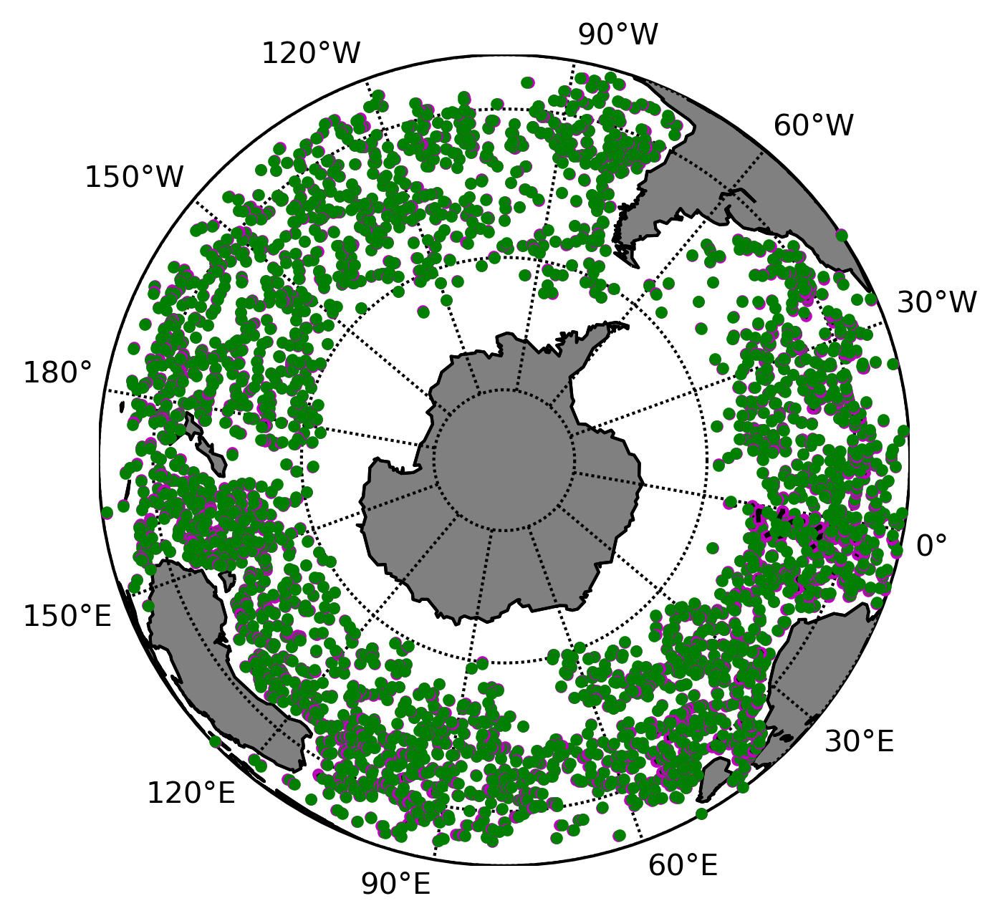

In [359]:
#pt.simple_trajectories_map(projection='mbtfpq')
pt.simple_trajectories_map()

# Normalize property as amp to the size of the green current dot, while animation.

In [247]:
def split_list(alist, wanted_parts=1,overlap=None):
    length = len(alist)
    overlap=overlap+1
    if overlap==None or overlap==1:        
        splitl=np.array([ alist[i*length // wanted_parts: (i+1)*length // wanted_parts]
                 for i in range(wanted_parts)])
    else:
        splitl=np.array([ alist[i*length // wanted_parts: (i+1)*length // wanted_parts + overlap//2] if i==0 
                         else  alist[i*length // wanted_parts - overlap//2+1 : (i+1)*length // wanted_parts]
                           for i in range(wanted_parts)])
    return splitl

In [248]:
a=list(range(100))

In [253]:
split_list(a, wanted_parts=5,overlap=1)

array([ list([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]),
       list([20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]),
       list([40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]),
       list([60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]),
       list([80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])], dtype=object)

In [208]:
['yes' if v == 1 else 'no' if v == 2 else 'idle' for v in l]

NameError: name 'l' is not defined

In [35]:
?sw.dist